# Gestion quantitative
## IND8123 : Technologie financière pour ingénieur



# Installation et importation des librairies nécessaires

In [ ]:
!pip install ta
!pip install tqdm

In [2]:
import yfinance as yf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import gridspec
from ta import *
from ta.momentum import *
from ta.trend import *
from ta.volatility import *
from ta.volume import *
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import train_test_split, TimeSeriesSplit, GridSearchCV, HalvingGridSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, roc_auc_score, accuracy_score
import seaborn as sns
from pandas_datareader import data as pdr
import pandas_datareader.data as web

# Prétraitement des données et mise en place des indicateurs techniques

## Téléchargement des données

In [ ]:
# Téléchargement des données
stocklist = ["AAPL", "GOOG", "TSLA", "MSFT", "^VXN"]
start_date = "2007-01-01"
data = yf.download(stocklist, start=start_date, auto_adjust=True)

# Pour FRED data, on peut utiliser pandas_datareader
fredlist = ["BAMLH0A0HYM2", "T6MFF"]
fred_data = pdr.get_data_fred(fredlist, start=start_date)

## Fonctions utilitaires

In [4]:
def prepare_stock_data(data, fred_data, ticker):
    """
    Prépare les données pour un ticker spécifique en combinant les données boursières et économiques.

    Args:
        data (pd.DataFrame): Données téléchargées avec yfinance
        fred_data (pd.DataFrame): Données économiques de FRED
        ticker (str): Symbole boursier (ex: 'AAPL', 'GOOG', 'MSFT')

    Returns:
        pd.DataFrame: DataFrame contenant toutes les données préparées
    """
    # Création du DataFrame de base
    df = data['Close'][ticker].to_frame('Close')
    df = df.join(data['Volume'][ticker].to_frame('Volume'))
    df = df.join(fred_data, how='left')

    # Nettoyage des données
    df = df.dropna()
    df.columns = ['Close', 'Volume', 'Credit', 'YC']

    # Ajout des autres colonnes de prix
    df['Open'] = data['Open'][ticker]
    df['High'] = data['High'][ticker]
    df['Low'] = data['Low'][ticker]

    # Calcul des indicateurs
    df['return_1d'] = (df['Close'] - df['Open']) / df['Open']
    df['return_5d'] = (df['Close'] - df['Open'].shift(5)) / df['Open'].shift(5)
    df['dir'] = np.where(df['Close'] >= df['Open'].shift(5), 1, 0)

    return df

def plot_performance(data, stock, strategy_name, freq='1D'):
    """Trace les performances de la stratégie"""
    if freq == '1D':
        col = 'strategy_return_1d'
        label = f'{strategy_name} - 1 jour'
    else:
        col = 'strategy_return_5d'
        label = f'{strategy_name} - 5 jours'

    if freq == '1D':
        cumulative_strat = (1 + data[col]).cumprod()
    else:
        strat_returns = data[col].dropna()
        non_overlapping = strat_returns.iloc[::5]  # Pas de 5 jours
        cumulative_strat = (1 + non_overlapping).cumprod()
        cumulative_strat = cumulative_strat.reindex(data.index, method='ffill')

    # Graphique
    plt.figure(figsize=(14, 7))
    plt.plot(cumulative_strat, label=label, color='blue')
    plt.title(f'{stock} - Performance: {label}')
    plt.ylabel('Performance cumulative')
    plt.legend()
    plt.grid(True)
    plt.show()

    return performance_stats(data[col].dropna(), freq)

def performance_stats(returns, freq='1D'):
    """
    Calcule les statistiques de performance pour des rendements non chevauchants
    Version compatible avec les fréquences 1D et 5D
    """
    if len(returns) == 0:
        return pd.DataFrame(index=['Value'])

    # Gestion des fréquences
    if freq == '5D':
        returns = returns.iloc[::5]  # Prendre un point tous les 5 jours
        days_per_period = 5
    else:  # 1D par défaut
        days_per_period = 1

    # Calculs de base
    cumulative_ret = (1 + returns).prod() - 1

    # Nombre de périodes par an (252 jours ouvrés)
    periods_per_year = 252 / days_per_period

    # Annualisation corrigée
    annualized_ret = (1 + cumulative_ret) ** (periods_per_year/len(returns)) - 1 if len(returns) > 0 else 0
    annualized_vol = returns.std() * np.sqrt(periods_per_year)
    sharpe_ratio = (annualized_ret / annualized_vol) if annualized_vol > 0 else np.nan

    # Max Drawdown corrigé
    equity_curve = (1 + returns).cumprod()
    max_dd = (equity_curve / equity_curve.cummax() - 1).min()

    stats = {
        'Cumulative Return': cumulative_ret,
        'Annualized Return': annualized_ret,
        'Annualized Volatility': annualized_vol,
        'Sharpe Ratio': sharpe_ratio,
        'Max Drawdown': max_dd,
        'Number of Trades': len(returns)
    }

    return pd.DataFrame(stats, index=['Value'])

## Fonctions pour les indicateurs à tester

In [5]:
def rsi_strategy(data, stock, window=14, threshold=40):
    """Implémente la stratégie RSI"""
    # Calcul du RSI
    data['rsi'] = RSIIndicator(data['Close'], window=window).rsi()

    # Génération des signaux
    data['signal'] = 0
    data.loc[data['rsi'] < threshold, 'signal'] = 1

    # Calcul des rendements
    data['strategy_return_1d'] = data['return_1d'] * data['signal'].shift(1)
    data['strategy_return_5d'] = data['return_5d'] * data['signal'].shift(5)

    # Graphique RSI
    plt.figure(figsize=(14, 10))
    plt.plot(data['Close'], label='Prix', color='black')
    plt.title(f'{stock} - Prix et RSI')
    plt.grid(True)

    ax2 = plt.twinx()
    ax2.plot(data['rsi'], label='RSI', color='blue')
    ax2.axhline(threshold, color='red', linestyle='--', label='Seuil')
    ax2.set_ylim(0, 100)
    plt.legend()
    plt.show()

    return data

def bollinger_strategy(data, stock, window=20, window_dev=2):
    """Implémente la stratégie Bollinger Bands"""
    # Calcul des Bandes
    indicator_bb = BollingerBands(close=data['Close'], window=window, window_dev=window_dev)
    data['bb_high'] = indicator_bb.bollinger_hband()
    data['bb_low'] = indicator_bb.bollinger_lband()
    data['bb_pctb'] = indicator_bb.bollinger_pband()

    # Génération des signaux
    data['signal'] = 1  # Par défaut entre les bandes = long
    data.loc[data['bb_pctb'] > 1, 'signal'] = -1  # Au-dessus = short
    data.loc[data['bb_pctb'] < 0, 'signal'] = 0   # En-dessous = neutre

    # Calcul des rendements
    data['strategy_return_1d'] = data['return_1d'] * data['signal'].shift(1)
    data['strategy_return_5d'] = data['return_5d'] * data['signal'].shift(5)

    # Graphique Bollinger
    plt.figure(figsize=(14, 10))
    plt.plot(data['Close'], label='Prix', color='black')
    plt.plot(data['bb_high'], label='Bande sup', color='red', linestyle='--')
    plt.plot(data['bb_low'], label='Bande inf', color='green', linestyle='--')
    plt.fill_between(data.index, data['bb_low'], data['bb_high'], color='grey', alpha=0.1)
    plt.title(f'{stock} - Bandes de Bollinger')
    plt.legend()
    plt.grid(True)
    plt.show()

    return data

def cmf_strategy(data, stock, window=20, buy_threshold=0.2, sell_threshold=-0.2):
    """Implémente la stratégie Chaikin Money Flow"""
    # Calcul du CMF
    data['cmf'] = ChaikinMoneyFlowIndicator(
        high=data['High'],
        low=data['Low'],
        close=data['Close'],
        volume=data['Volume'],
        window=window
    ).chaikin_money_flow()

    # Génération des signaux
    data['signal'] = 0  # Par défaut neutre
    data.loc[data['cmf'] > buy_threshold, 'signal'] = 1    # Achat si CMF > 0.2
    data.loc[data['cmf'] < sell_threshold, 'signal'] = -1   # Vente si CMF < -0.2

    # Calcul des rendements
    data['strategy_return_1d'] = data['return_1d'] * data['signal'].shift(1)
    data['strategy_return_5d'] = data['return_5d'] * data['signal'].shift(5)

    # Graphique CMF
    plt.figure(figsize=(14, 10))

    # Prix
    plt.subplot(2, 1, 1)
    plt.plot(data['Close'], label='Prix', color='black')
    plt.title(f'{stock} - Prix et Chaikin Money Flow')
    plt.grid(True)

    # CMF
    plt.subplot(2, 1, 2)
    plt.plot(data['cmf'], label='CMF', color='purple')
    plt.axhline(buy_threshold, color='green', linestyle='--', label='Seuil achat')
    plt.axhline(sell_threshold, color='red', linestyle='--', label='Seuil vente')
    plt.axhline(0, color='grey', linestyle='-', alpha=0.5)
    plt.ylabel('CMF')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    return data

def stochastic_strategy(data, stock, window=14, overbought=0.9, oversold=0.5):
    """Implémente la stratégie de l'Oscillateur Stochastique de Lane"""
    # Calcul de l'oscillateur stochastique (%K)
    stoch = StochasticOscillator(
        high=data['High'],
        low=data['Low'],
        close=data['Close'],
        window=window
    )
    data['stoch'] = stoch.stoch()
    data['stoch_signal'] = stoch.stoch_signal()  # Ligne de signal (%D)

    # Génération des signaux
    data['signal'] = 0  # Par défaut neutre
    data.loc[data['stoch'] > overbought, 'signal'] = -1  # Sur-achat
    data.loc[data['stoch'] < oversold, 'signal'] = 1     # Sur-vente

    # Calcul des rendements
    data['strategy_return_1d'] = data['return_1d'] * data['signal'].shift(1)
    data['strategy_return_5d'] = data['return_5d'] * data['signal'].shift(5)

    # Graphique
    plt.figure(figsize=(14, 10))

    # Prix
    plt.subplot(2, 1, 1)
    plt.plot(data['Close'], label='Prix', color='black')
    plt.title(f'{stock} - Oscillateur Stochastique de Lane')
    plt.grid(True)

    # Stochastique
    plt.subplot(2, 1, 2)
    plt.plot(data['stoch'], label='%K (Ligne principale)', color='blue')
    plt.plot(data['stoch_signal'], label='%D (Ligne de signal)', color='orange', linestyle='--')
    plt.axhline(overbought, color='red', linestyle='--', label='Sur-achat')
    plt.axhline(oversold, color='green', linestyle='--', label='Sur-vente')
    plt.ylim(0, 1)
    plt.ylabel('Stochastique')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    return data

def calculate_tdi(close, window=20, multiple=2):
    """
    Calcule manuellement le Trend Detection Index (TDI)
    DI: Directional Index (momentum sur window jours)
    TDI: DI courant comparé à DI sur une période plus longue (window*multiple)
    """
    # Calcul du momentum directionnel
    momentum = close.diff(window)

    # Directional Index (DI)
    di = momentum.rolling(window).mean()

    # Trend Detection Index (TDI)
    long_window = window * multiple
    tdi = di - di.rolling(long_window).mean()

    return pd.DataFrame({'di': di, 'tdi': tdi})

def tdi_strategy(data, stock, window=20, multiple=2):
    """Implémente la stratégie Trend Detection Index"""
    # Calcul manuel du TDI
    tdi_values = calculate_tdi(data['Close'], window, multiple)
    data['di'] = tdi_values['di']
    data['tdi'] = tdi_values['tdi']

    # Génération des signaux
    extended_window = window * multiple
    data['signal'] = 0  # Par défaut neutre

    # Conditions de trading
    long_condition = (data['tdi'] > 0) & (data['di'] > 0)
    short_condition = (data['tdi'] > 0) & (data['di'] < 0)

    data.loc[long_condition, 'signal'] = 1    # Momentum positif
    data.loc[short_condition, 'signal'] = -1  # Momentum perdu

    # Ignorer les premières périodes sans données complètes
    data.iloc[:extended_window, data.columns.get_loc('signal')] = 0

    # Calcul des rendements (comme précédemment)
    data['strategy_return_1d'] = data['return_1d'] * data['signal'].shift(1)
    data['strategy_return_5d'] = data['return_5d'] * data['signal'].shift(5)

    # Graphique (identique à la version précédente)
    plt.figure(figsize=(14, 10))

    # Prix
    plt.subplot(3, 1, 1)
    plt.plot(data['Close'], label='Prix', color='black')
    plt.title(f'{stock} - Trend Detection Index (window={window}, multiple={multiple})')
    plt.grid(True)

    # DI
    plt.subplot(3, 1, 2)
    plt.plot(data['di'], label='Directional Index (DI)', color='blue')
    plt.axhline(0, color='grey', linestyle='--')
    plt.ylabel('DI')
    plt.grid(True)

    # TDI
    plt.subplot(3, 1, 3)
    plt.plot(data['tdi'], label='Trend Detection Index (TDI)', color='green')
    plt.axhline(0, color='grey', linestyle='--')
    plt.ylabel('TDI')
    plt.xlabel('Date')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    return data

def momentum_strategy(data, stock, window=1):
    """Implémente la stratégie Momentum"""
    # Calcul du Momentum
    data['momentum'] = data['Close'].pct_change(window)

    # Génération des signaux
    data['signal'] = 0
    data.loc[data['momentum'] > 0, 'signal'] = 1

    # Ignorer les premières périodes sans données complètes
    data.iloc[:window, data.columns.get_loc('signal')] = 0

    # Calcul des rendements
    data[f'strategy_return_1d'] = data['return_1d'] * data['signal'].shift(1)
    data[f'strategy_return_5d'] = data['return_5d'] * data['signal'].shift(5)

    # # Graphique
    # plt.figure(figsize=(14, 10))

    # Prix
    plt.subplot(2, 1, 1)
    plt.plot(data['Close'], label='Prix', color='black')
    plt.title(f'{stock} - Stratégie Momentum ({window} jour(s))')
    plt.grid(True)

    # Momentum
    plt.subplot(2, 1, 2)
    plt.bar(data.index, data['momentum'],
            color=np.where(data['momentum'] > 0, 'g', 'r'),
            alpha=0.7)
    plt.axhline(0, color='grey', linestyle='-')
    plt.ylabel('Momentum')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    return data

def vxn_strategy(data, stock, vxn_data, window=14, low_thresh=30, high_thresh=80):
    """Stratégie basée sur le RSI du VXN"""
    # Calcul du RSI
    vxn_rsi = RSIIndicator(vxn_data, window=window).rsi()

    # Génération des signaux
    signal = ((vxn_rsi < low_thresh) | (vxn_rsi > high_thresh)).astype(int)

    # Alignement des données
    data['signal'] = signal.reindex(data.index, method='ffill').fillna(0)

    # Calcul des rendements
    data['strategy_return_1d'] = data['return_1d'] * data['signal'].shift(1)
    data['strategy_return_5d'] = data['return_5d'] * data['signal'].shift(5)

    # Graphique
    plot_rsi_strategy(vxn_data, vxn_rsi,
                     f"{stock} - RSI({window}) du VXN",
                     low_thresh, high_thresh)

    return data

def credit_strategy(data, stock, credit_data, window=14, threshold=50):
    """Stratégie basée sur le RSI des écarts de crédit"""
    credit_rsi = RSIIndicator(credit_data, window=window).rsi()

    signal = (credit_rsi < threshold).astype(int)
    data['signal'] = signal.reindex(data.index, method='ffill').fillna(0)

    data['strategy_return_1d'] = data['return_1d'] * data['signal'].shift(1)
    data['strategy_return_5d'] = data['return_5d'] * data['signal'].shift(5)

    plot_rsi_strategy(credit_data, credit_rsi,
                     f"{stock} - RSI({window}) des écarts de crédit",
                     threshold, None)

    return data

def yield_curve_strategy(data, stock, yc_data, window=14, threshold=40):
    """Stratégie basée sur le RSI de la courbe des taux"""
    yc_rsi = RSIIndicator(yc_data, window=window).rsi()

    signal = (yc_rsi < threshold).astype(int)
    data['signal'] = signal.reindex(data.index, method='ffill').fillna(0)

    data['strategy_return_1d'] = data['return_1d'] * data['signal'].shift(1)
    data['strategy_return_5d'] = data['return_5d'] * data['signal'].shift(5)

    plot_rsi_strategy(yc_data, yc_rsi,
                     f"{stock} - RSI({window}) de la courbe des taux",
                     threshold, None)

    return data

def plot_rsi_strategy(price_data, rsi_data, title, low_thresh, high_thresh=None):
    """Fonction utilitaire pour tracer les stratégies RSI"""
    plt.figure(figsize=(14, 10))

    # Prix
    plt.subplot(2, 1, 1)
    plt.plot(price_data, label='Indicateur', color='black')
    plt.title(title)
    plt.grid(True)

    # RSI
    plt.subplot(2, 1, 2)
    plt.plot(rsi_data, label='RSI', color='purple')
    if low_thresh:
        plt.axhline(low_thresh, color='green', linestyle='--', label='Seuil bas')
    if high_thresh:
        plt.axhline(high_thresh, color='red', linestyle='--', label='Seuil haut')
    plt.ylim(0, 100)
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

## Fonctions pour choisir les indicateurs et les tickers à essayer ou à comparer

In [6]:
def get_all_strategies():
  return {
        'RSI': {
            'func': rsi_strategy,
            'params': {'window': 14, 'threshold': 40}
        },
        'Bollinger': {
            'func': bollinger_strategy,
            'params': {'window': 20, 'window_dev': 2}
        },
        'Chaikin MF': {
            'func': cmf_strategy,
            'params': {'window': 20, 'buy_threshold': 0.2, 'sell_threshold': -0.2}
        },
        'Stochastique': {
            'func': stochastic_strategy,
            'params': {'window': 14, 'overbought': 0.9, 'oversold': 0.5}
        },
        'Trend Detection': {
            'func': tdi_strategy,
            'params': {'window': 20, 'multiple': 2}
        },
        'Momentum 1j': {
            'func': momentum_strategy,
            'params': {'window': 1}
        },
        'Momentum 5j': {
            'func': momentum_strategy,
            'params': {'window': 5}
        },
        'RSI VXN': {
            'func': vxn_strategy,
            'params': {'window': 14, 'low_thresh': 30, 'high_thresh': 80},
            'special_data': data['Close']['^VXN']
        },
        'RSI Credit': {
            'func': credit_strategy,
            'params': {'window': 14, 'threshold': 50},
            'special_data': fred_data['BAMLH0A0HYM2']
        },
        'RSI YC': {
            'func': yield_curve_strategy,
            'params': {'window': 14, 'threshold': 40},
            'special_data': fred_data['T6MFF']
        }
    }

def test_strategy_on_ticker(data, fred_data, ticker, strategy_func, strategy_name, strategy_params, hold_periods=['1D', '5D']):
    """
    Teste une stratégie sur un ticker et affiche les performances
    """
    # Préparation des données
    df = prepare_stock_data(data, fred_data, ticker)

    # Application de la stratégie
    df_strat = strategy_func(df.copy(), ticker, **strategy_params)

    # Analyse de performance
    print(f"\nPerformance {strategy_name} sur {ticker}:")
    for period in hold_periods:
        print(plot_performance(df_strat, ticker, strategy_name, period))

def test_unique_strategy(data, fred_data, ticker, strat_name):
    """
    Teste une seule stratégie sur un ticker
    """
    strategy = get_all_strategies()[strat_name]

    if 'special_data' in strategy:
      if strat_name == 'RSI VXN':
        strategy['params']['vxn_data'] = strategy['special_data']
      elif strat_name == 'RSI Credit':
        strategy['params']['credit_data'] = strategy['special_data']
      elif strat_name == 'RSI YC':
        strategy['params']['yc_data'] = strategy['special_data']

    test_strategy_on_ticker(
        data=data,
        fred_data=fred_data,
        ticker=ticker,
        strategy_func=strategy['func'],
        strategy_name=strat_name,
        strategy_params=strategy['params']
    )

def test_all_strategies(data, fred_data, ticker):
    """
    Teste toutes les stratégies disponibles sur un ticker donné
    """
    # Dictionnaire des stratégies et leurs paramètres

    strategies = get_all_strategies()

    print(f"\n===== ANALYSE DES STRATÉGIES POUR {ticker} =====")

    for strat_name, strat_config in strategies.items():
        # Préparation des données spéciales si nécessaire
        if 'special_data' in strat_config:
          if strat_name == 'RSI VXN':
            strat_config['params']['vxn_data'] = strat_config['special_data']
          elif strat_name == 'RSI Credit':
            strat_config['params']['credit_data'] = strat_config['special_data']
          elif strat_name == 'RSI YC':
            strat_config['params']['yc_data'] = strat_config['special_data']

        test_strategy_on_ticker(
            data=data,
            fred_data=fred_data,
            ticker=ticker,
            strategy_func=strat_config['func'],
            strategy_name=strat_name,
            strategy_params=strat_config['params']
        )

def compare_strategies(data, fred_data, tickers, strategy_name):
    """
    Compare une stratégie spécifique sur plusieurs tickers
    """
    strategies_config = get_all_strategies()

    if strategy_name not in strategies_config:
        print(f"Stratégie {strategy_name} non trouvée")
        return

    strat_config = strategies_config[strategy_name]

    if 'special_data' in strat_config:
      if strategy_name == 'RSI VXN':
        strat_config['params']['vxn_data'] = strat_config['special_data']
      elif strategy_name == 'RSI Credit':
        strat_config['params']['credit_data'] = strat_config['special_data']
      elif strategy_name == 'RSI YC':
        strat_config['params']['yc_data'] = strat_config['special_data']

    for ticker in tickers:
        test_strategy_on_ticker(
            data=data,
            fred_data=fred_data,
            ticker=ticker,
            strategy_func=strat_config['func'],
            strategy_name=strategy_name,
            strategy_params=strat_config['params']
        )

## Fonctions pour la préparation des données pour le Machine Learning (ML)

In [7]:
def prepare_ml_data(stock_data, market_data, fred_data):
    """Prépare les données pour le machine learning pour un ticker donné"""

    # Calcul des indicateurs techniques avec décalage de 5 jours
    close_prices = stock_data['Close']
    open_prices = stock_data['Open']

    # SMA
    sma5 = close_prices.rolling(5).mean().shift(5)
    # EMA
    ema5 = close_prices.ewm(span=5, adjust=False).mean().shift(5)
    # MACD
    macd_indicator = MACD(close_prices)
    macd1 = macd_indicator.macd().shift(5)
    macd_signal = macd_indicator.macd_signal().shift(5)
    # RSI
    rsi1 = RSIIndicator(close_prices).rsi().shift(5)
    # BBands
    bband = BollingerBands(close_prices, window=20, window_dev=2)
    bband_1 = bband.bollinger_pband().shift(5)
    # Chaikin Money Flows
    cmf_1 = ChaikinMoneyFlowIndicator(high=stock_data['High'], low=stock_data['Low'],
                                     close=stock_data['Close'], volume=stock_data['Volume']).chaikin_money_flow().shift(5)
    # Lane Oscillator (Stochastic %K)
    stochOSC_1 = StochasticOscillator(high=stock_data['High'], low=stock_data['Low'],
                                     close=stock_data['Close']).stoch().shift(5)
    # Retours (Momentum)
    ret1 = (close_prices - close_prices.shift(1)) / close_prices.shift(1) * 100  # Momentum 1 jour
    ret5 = (close_prices - close_prices.shift(5)) / close_prices.shift(5) * 100  # Momentum 5 jours
    ret1 = ret1.shift(5)
    ret5 = ret5.shift(5)
    # VXN RSI
    vxn_rsi = RSIIndicator(market_data['Close']['^VXN']).rsi().shift(5)
    # Credit RSI
    credit_rsi = RSIIndicator(fred_data['BAMLH0A0HYM2']).rsi().shift(5)
    # Yield Curve RSI
    yc_rsi = RSIIndicator(fred_data['T6MFF']).rsi().shift(5)

    # Variable cible : direction des prix
    dir = np.where(close_prices >= open_prices.shift(4), 1, 0)  # direction comparée au prix 5 jours avant
    # Performance du stock (Open à Close sur 5 jours)
    stock_perf = (close_prices / open_prices.shift(4)) - 1

    # Combinaison des données pour l'entraînement
    ml_data = pd.DataFrame({
        'Return': stock_perf,
        'Prix': close_prices,
        'Direction': dir,
        'MACD': macd1,
        'MACD_signal': macd_signal,
        'Ret1': ret1,
        'Ret5': ret5,
        'RSI': rsi1,
        'BBand': bband_1,
        'CMF': cmf_1,
        'LSO': stochOSC_1,
        'VXN': vxn_rsi.reindex(close_prices.index, method='ffill'),
        'Credit': credit_rsi.reindex(close_prices.index, method='ffill'),
        'YC': yc_rsi.reindex(close_prices.index, method='ffill')
    }).dropna()

    return ml_data

def visualize_ml_data(ml_data, ticker_name, start_date='2022'):
    """
    Visualise les données préparées pour le machine learning

    Args:
        ml_data: DataFrame préparé (sortie de prepare_ml_data)
        ticker_name: str - nom du ticker à afficher dans les titres
        start_date: str - date de début pour le graphique des prix
    """
    # 1. Graphique des prix avec indicateur de direction
    plt.figure(figsize=(14, 7))
    plt.plot(ml_data['Prix'][start_date:], label=f'Prix de clôture {ticker_name}', linewidth=2)

    # Points verts pour les hausses
    plt.scatter(ml_data['Prix'][start_date:].index,
                ml_data['Prix'][start_date:].where(ml_data['Direction'][start_date:] == 1),
                color='green', label='Hausse', alpha=0.7)

    # Points rouges pour les baisses
    plt.scatter(ml_data['Prix'][start_date:].index,
                ml_data['Prix'][start_date:].where(ml_data['Direction'][start_date:] == 0),
                color='red', label='Baisse', alpha=0.7)

    plt.title(f'{ticker_name} - Prix de fermeture et Indicateur de direction', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Prix ($)', fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

    # 2. Boxplot des indicateurs techniques par direction
    plt.figure(figsize=(14, 10))
    temp = ml_data.drop(['Return', 'Prix'], axis=1)
    melted = temp.melt(id_vars=['Direction'], var_name='Indicator', value_name='Value')

    # Palette de couleurs personnalisée
    palette = {0: 'lightcoral', 1: 'lightgreen'}

    sns.boxplot(x='Value', y='Indicator', hue='Direction', data=melted,
                palette=palette, width=0.6)

    plt.title(f'Indicateurs techniques vs Direction des prix - {ticker_name}', fontsize=14)
    plt.xlabel('Valeur', fontsize=12)
    plt.ylabel('Indicateur', fontsize=12)
    plt.legend(title='Direction Prix', labels=['Baisse', 'Hausse'])
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

def split_and_prepare_data(ml_data, test_size=0.2, random_state=None):
    """
    Sépare les données en ensembles d'entraînement et de test et effectue le prétraitement

    Args:
        ml_data: DataFrame préparé (sortie de prepare_ml_data)
        test_size: float - proportion des données à utiliser pour le test (0-1)
        random_state: int - seed pour la reproductibilité

    Returns:
        Tuple contenant (X_train_scaled, X_test_scaled, y_train, y_test, d_perf_train, d_perf_test, scaler)
    """
    # Conversion de la direction en catégorie
    data = ml_data.copy()
    data['Direction'] = data['Direction'].astype('category')

    # Séparation train/test
    if random_state is not None:
        data = data.sample(frac=1, random_state=random_state)  # Shuffle si random_state spécifié

    split_idx = int(len(data) * (1 - test_size))
    d_train = data.iloc[:split_idx]
    d_test = data.iloc[split_idx:]

    # Séparation des performances
    d_perf_train = d_train['Return']
    d_perf_test = d_test['Return']

    # Séparation features/target
    X_train = d_train.drop(['Return', 'Prix', 'Direction'], axis=1)
    y_train = d_train['Direction']
    X_test = d_test.drop(['Return', 'Prix', 'Direction'], axis=1)
    y_test = d_test['Direction']

    # Standardisation des données
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    return X_train_scaled, X_test_scaled, y_train, y_test, d_perf_train, d_perf_test, scaler

## Fonctions pour l'évaluation des modèles de ML

In [8]:
def plot_feature_importance(importance, feature_names, model_name):
    """Visualise l'importance des caractéristiques"""
    importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importance})
    importance_df = importance_df.sort_values('Importance', ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(x='Importance', y='Feature', data=importance_df)
    plt.title(f'Importance des variables - {model_name}')
    plt.tight_layout()
    plt.show()

def plot_confusion_matrix(y_true, y_pred):
    """Affiche la matrice de confusion avec annotations TP, FP, TN, FN"""
    cm = confusion_matrix(y_true, y_pred)

    # Conversion en DataFrame pour un meilleur affichage
    cm_df = pd.DataFrame(cm,
                         index=['Actual Down (0)', 'Actual Up (1)'],
                         columns=['Predicted Down (0)', 'Predicted Up (1)'])

    # Annotation personnalisée
    annotations = [
        [f"True Negative\n{cm[0,0]}", f"False Positive\n{cm[0,1]}"],
        [f"False Negative\n{cm[1,0]}", f"True Positive\n{cm[1,1]}"]
    ]

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_df, annot=annotations, fmt='', cmap='Blues',
                cbar=False, linewidths=1, linecolor='black')

    plt.title('Matrice de Confusion', pad=20)
    plt.xlabel('Prédictions', labelpad=15)
    plt.ylabel('Réalité', labelpad=15)
    plt.xticks(rotation=0)
    plt.yticks(rotation=0)
    plt.show()

def plot_roc_curve(y_true, y_proba, model_name):
    """Trace la courbe ROC"""
    fpr, tpr, _ = roc_curve(y_true, y_proba)
    auc_score = roc_auc_score(y_true, y_proba)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('Taux faux positifs')
    plt.ylabel('Taux vrais positifs')
    plt.title(f'Courbe ROC - {model_name}')
    plt.legend()
    plt.show()

def evaluate_model(model, X_train, X_test, y_train, y_test, feature_names, model_name):
    """Évalue un modèle et affiche les résultats"""
    # Entraînement
    model.fit(X_train, y_train)

    # Prédictions
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    # Importance des caractéristiques
    if hasattr(model, "coef_"):
        plot_feature_importance(model.coef_[0], feature_names, model_name)
    elif hasattr(model, "feature_importances_"):
        plot_feature_importance(model.feature_importances_, feature_names, model_name)

    # Matrice de confusion
    plot_confusion_matrix(y_test, y_pred)

    # Rapport de classification
    print(f"\nRapport de classification - {model_name}:\n")
    print(classification_report(y_test, y_pred))

    # Courbe ROC (si le modèle peut fournir des probabilités)
    if y_proba is not None:
        plot_roc_curve(y_test, y_proba, model_name)

    return model

## Fonctions pour l'entraînement des modèles de ML (Régression logistique, Arbre de décision, Forêt aléatoire, Gradient Boosting)

In [9]:
def print_model_title(model_name):
    """Affiche le titre du modèle"""
    print("\n" + "="*50)
    print(f"{model_name}")
    print("="*50)

def train_logistic_regression(X_train, X_test, y_train, y_test, feature_names):
    """Entraîne et évalue une régression logistique"""
    print_model_title("Régression Logistique")
    model = LogisticRegression(max_iter=1000)
    return evaluate_model(model, X_train, X_test, y_train, y_test, feature_names, "Régression Logistique")

def train_decision_tree(X_train, X_test, y_train, y_test, feature_names, max_depth=3):
    """Entraîne et évalue un arbre de décision"""
    print_model_title("Arbre de Décision")
    model = DecisionTreeClassifier(max_depth=max_depth)
    model = evaluate_model(model, X_train, X_test, y_train, y_test, feature_names, "Arbre de Décision")

    # Visualisation de l'arbre
    plt.figure(figsize=(20, 10))
    plot_tree(model, filled=True, feature_names=feature_names,
              class_names=['Down', 'Up'], max_depth=2)
    plt.title('Arbre de décision (simplifié)')
    plt.show()

    return model

def train_random_forest(X_train, X_test, y_train, y_test, feature_names, n_estimators=100):
    """Entraîne et évalue une forêt aléatoire"""
    print_model_title("Random Forest")
    model = RandomForestClassifier(n_estimators=n_estimators)
    return evaluate_model(model, X_train, X_test, y_train, y_test, feature_names, "Random Forest")

def train_gradient_boosting(X_train, X_test, y_train, y_test, feature_names,
                           cv_splits=3, n_jobs=-1, verbose=1):
    """Entraîne et évalue un modèle Gradient Boosting avec optimisation des hyperparamètres"""
    print_model_title("Gradient Boosting")

    # Configuration simplifiée pour éviter les erreurs
    param_grid = {
        'learning_rate': [0.1, 0.2],
        'n_estimators': [100, 150],
        'max_depth': [3, 4],
        'min_samples_leaf': [20, 30],
    }

    # Configuration du modèle de base avec validation interne désactivée
    base_gbm = GradientBoostingClassifier(
        random_state=42,
        n_iter_no_change=None,  # Désactive la validation interne
        validation_fraction=0.01  # Désactive la validation interne
    )

    # Validation croisée standard au lieu de TimeSeriesSplit
    cv = StratifiedKFold(n_splits=min(cv_splits, 3))  # On limite à 3 splits

    # Recherche d'hyperparamètres
    gbm = HalvingGridSearchCV(
        estimator=base_gbm,
        param_grid=param_grid,
        cv=cv,
        n_jobs=n_jobs,
        verbose=verbose,
        factor=2,
        min_resources="exhaust",
        aggressive_elimination=False
    )

    # Entraînement
    gbm.fit(X_train, y_train)

    # Affichage des meilleurs paramètres
    print("\nMeilleurs paramètres trouvés:")
    for param, value in gbm.best_params_.items():
        print(f"{param}: {value}")

    # Évaluation du modèle
    best_model = gbm.best_estimator_
    evaluate_model(best_model, X_train, X_test, y_train, y_test, feature_names, "Gradient Boosting")

    return best_model

def train_all_models(X_train, X_test, y_train, y_test, feature_names):
    """Entraîne et évalue tous les modèles"""
    models = {
        'Logistic Regression': train_logistic_regression(X_train, X_test, y_train, y_test, feature_names),
        'Decision Tree': train_decision_tree(X_train, X_test, y_train, y_test, feature_names),
        'Random Forest': train_random_forest(X_train, X_test, y_train, y_test, feature_names),
        'Gradient Boosting': train_gradient_boosting(X_train, X_test, y_train, y_test, feature_names)
    }
    return models

## Fonction utilitaire pour tester un modèle sur un ticker

In [10]:
def learn_from_ticker(data, fred_data, ticker):
  stock_data = prepare_stock_data(data, fred_data, ticker)

  ml_data = prepare_ml_data(stock_data, data, fred_data)
  visualize_ml_data(ml_data, ticker)

  X_train, X_test, y_train, y_test, _, _, _ = split_and_prepare_data(ml_data)
  feature_names = ml_data.drop(['Return', 'Prix', 'Direction'], axis=1).columns.tolist()

  return train_all_models(X_train, X_test, y_train, y_test, feature_names)

def analyze_and_learn_from_ticker(data, fred_data, ticker):
  test_all_strategies(data, fred_data, ticker)
  learn_from_ticker(data, fred_data, ticker)

## Exemple pour Apple

### Analyse des indicateurs


===== ANALYSE DES STRATÉGIES POUR AAPL =====


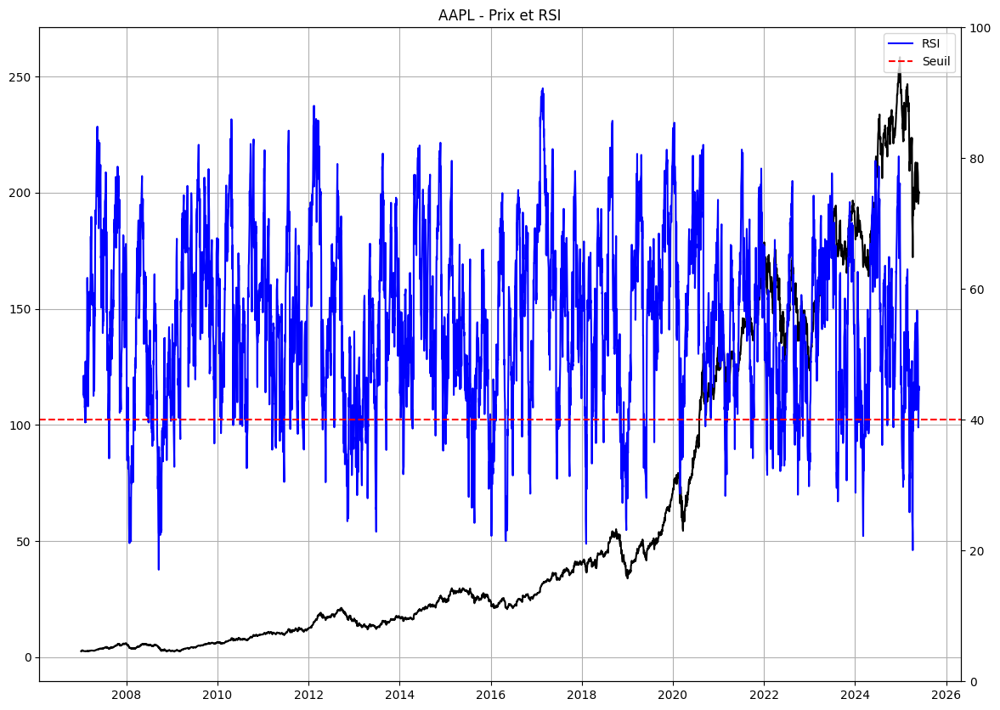


Performance RSI sur AAPL:


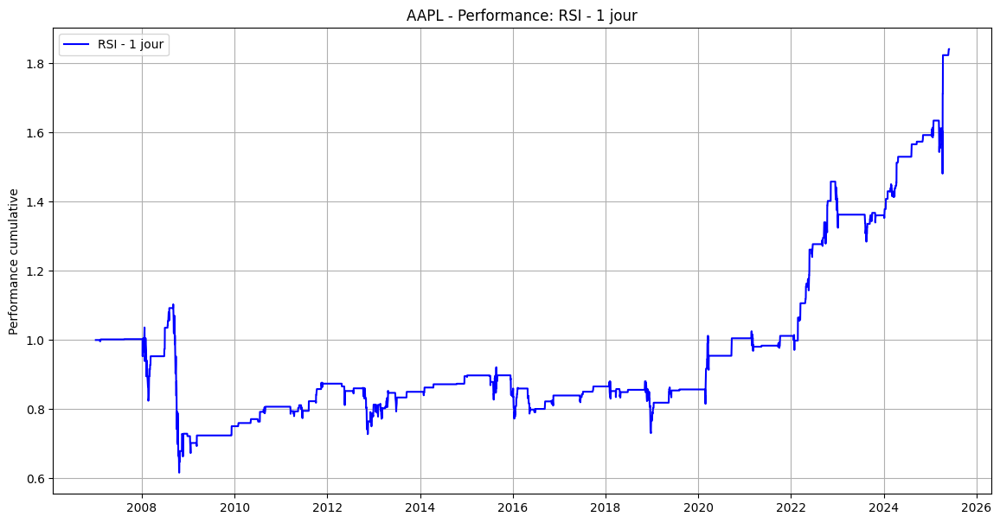

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.841393           0.034057               0.145473   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.234111     -0.441414              4594  


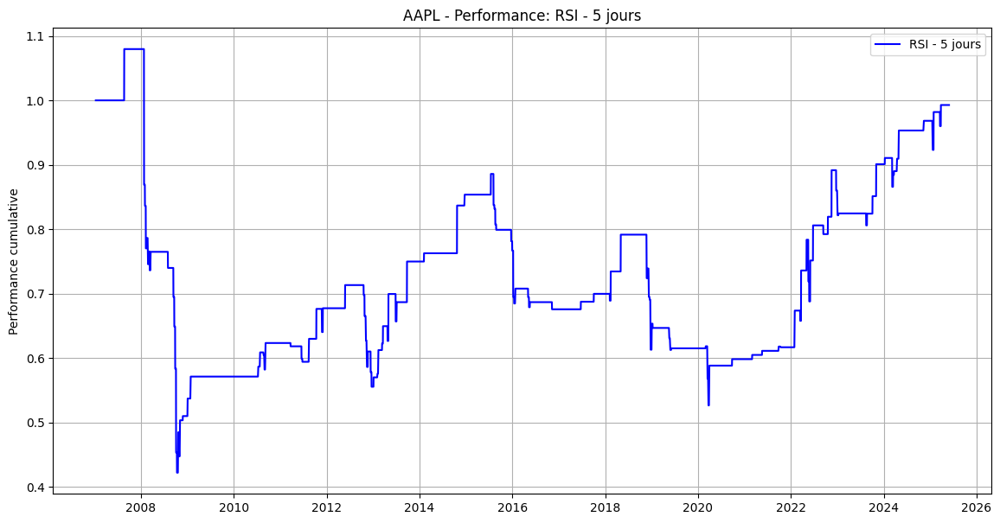

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.007224          -0.000398                0.15552   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.002559     -0.609091               918  


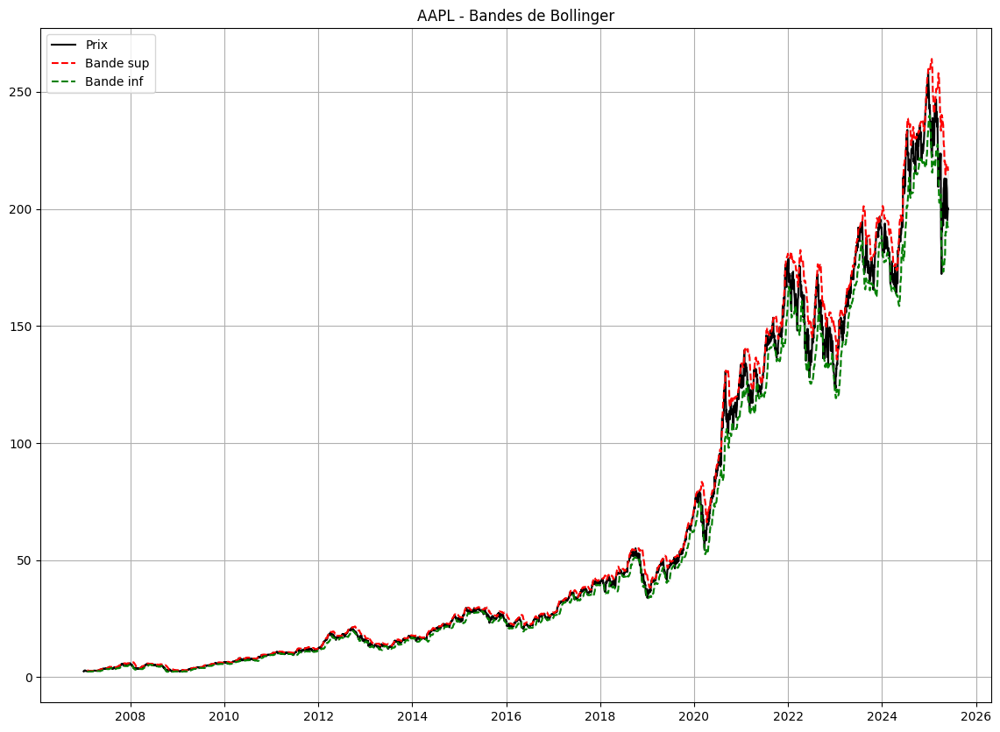


Performance Bollinger sur AAPL:


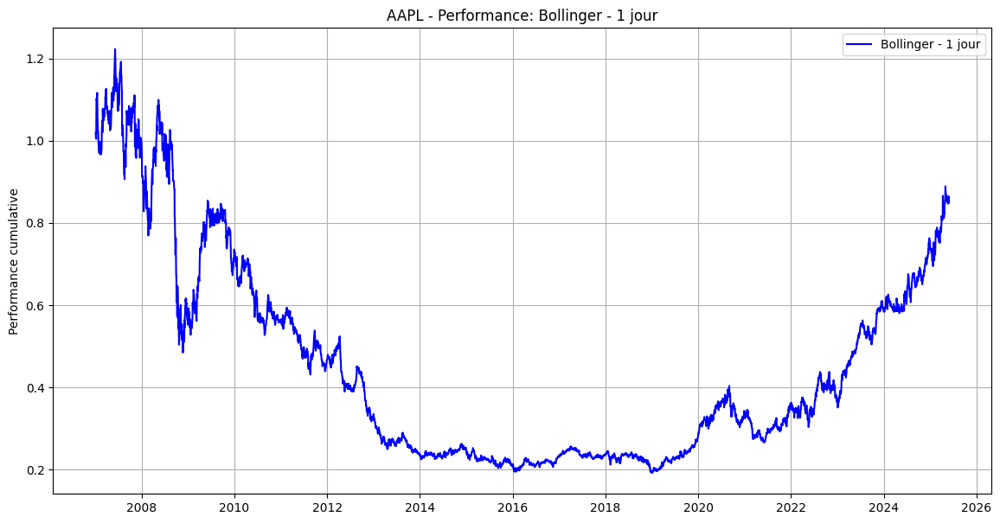

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           -0.15119          -0.008951               0.241276   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value       -0.0371     -0.842677              4594  


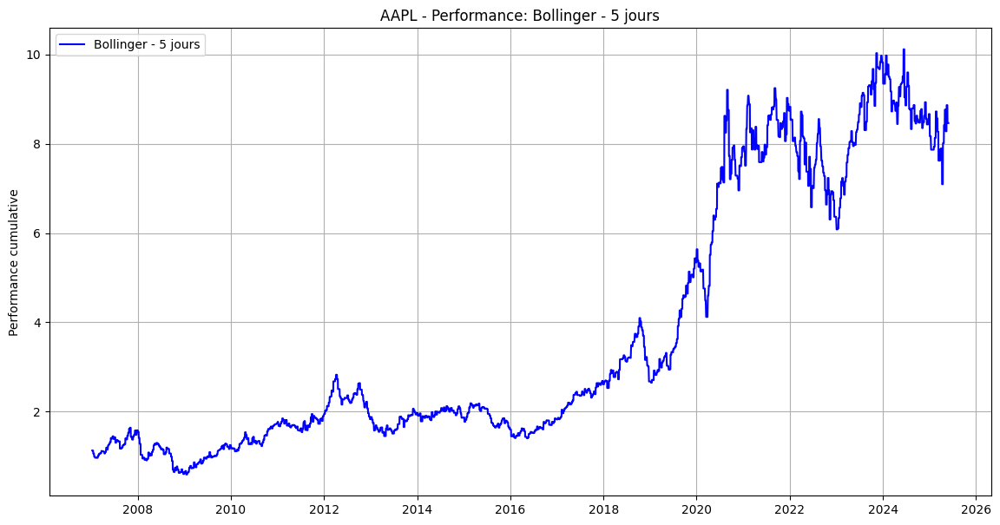

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           7.464287           0.124415               0.321787   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.386637     -0.640913               918  


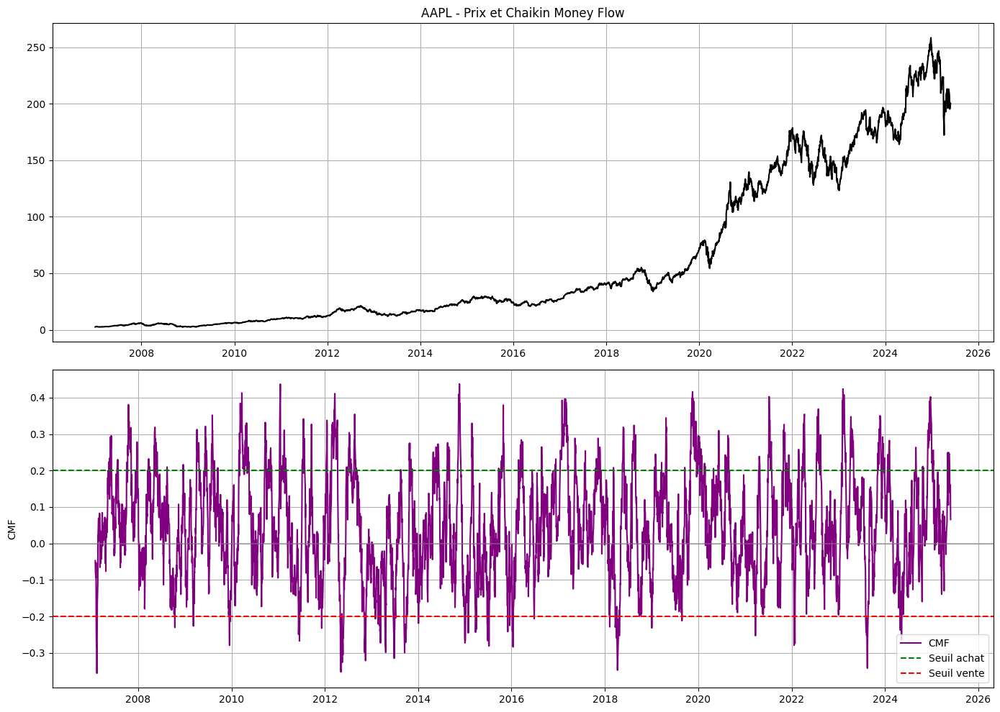


Performance Chaikin MF sur AAPL:


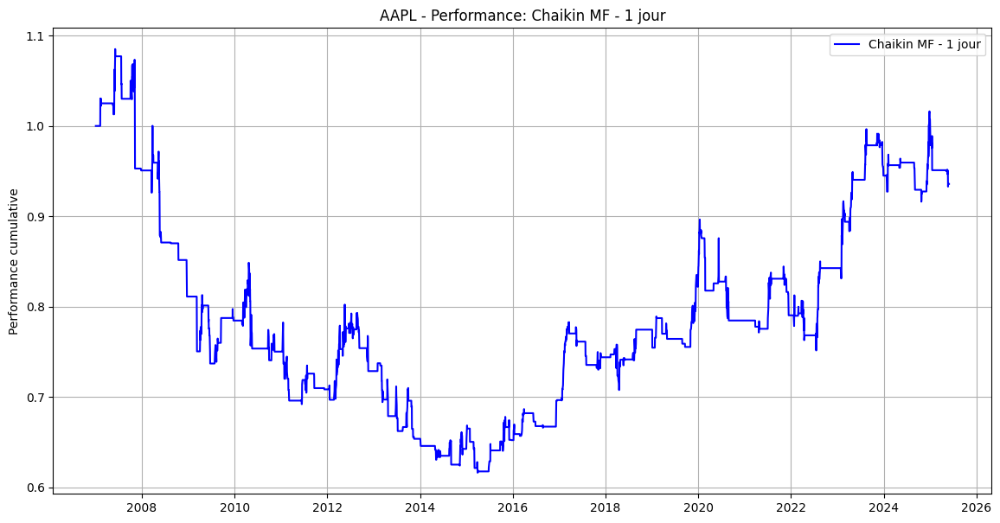

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.064186          -0.003632               0.091961   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.039499     -0.432264              4594  


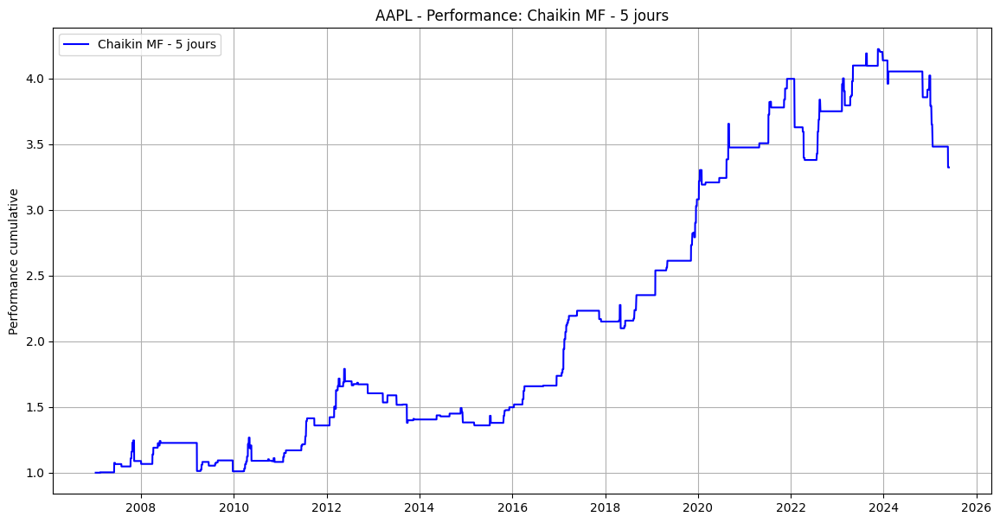

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           2.324149           0.068172                0.12342   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.552361     -0.240307               918  


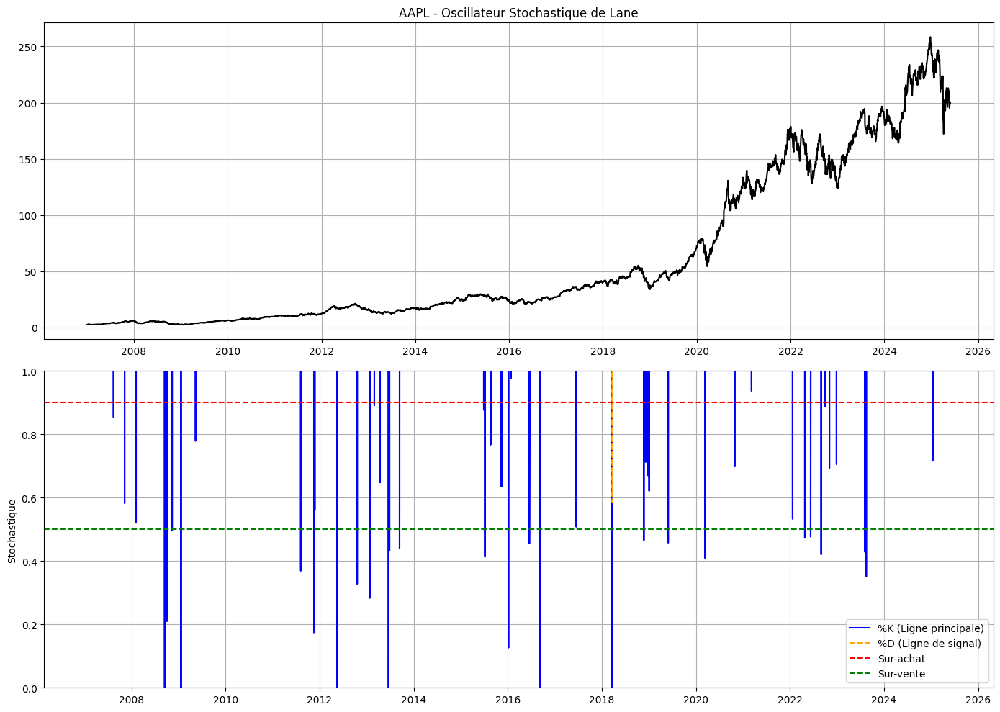


Performance Stochastique sur AAPL:


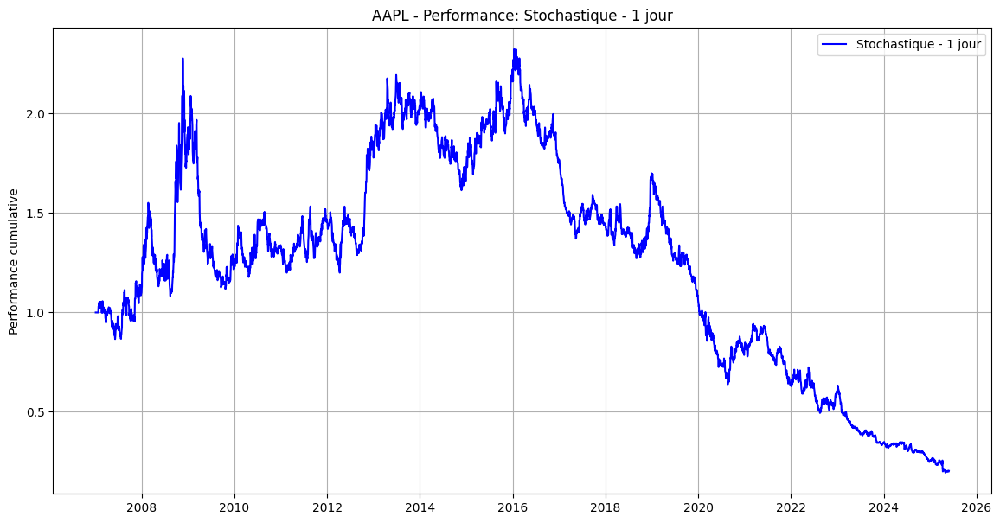

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.796729          -0.083684               0.253076   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.330669     -0.916368              4594  


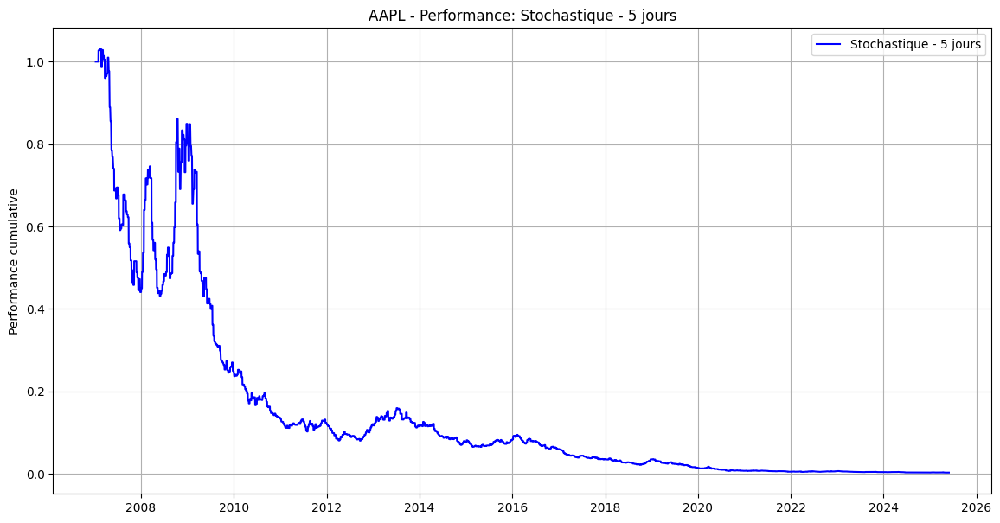

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.997383          -0.278509               0.324508   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      -0.85825     -0.997571               918  


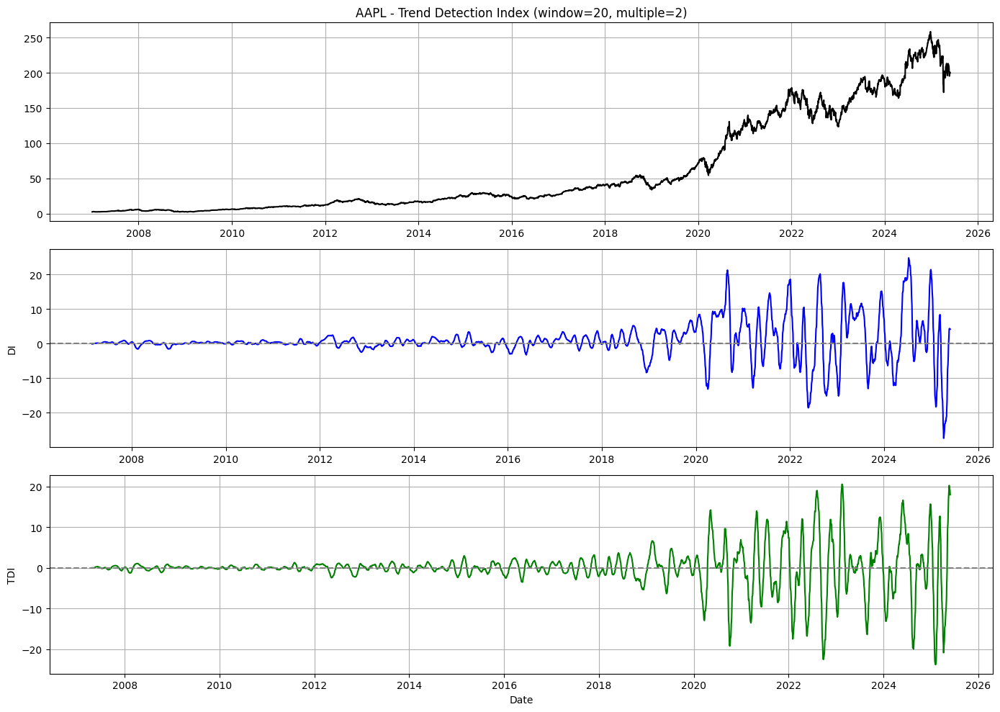


Performance Trend Detection sur AAPL:


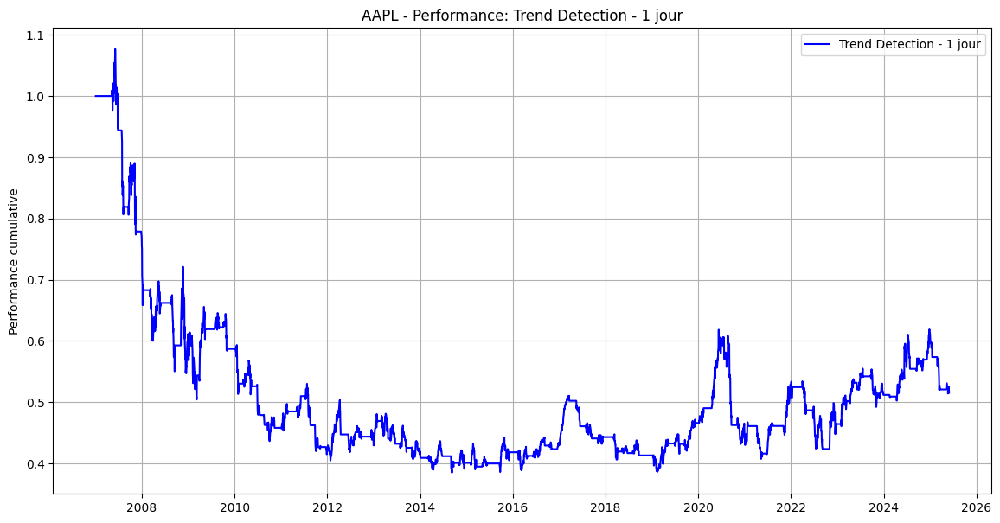

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.484682          -0.035713               0.167069   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.213764     -0.642404              4594  


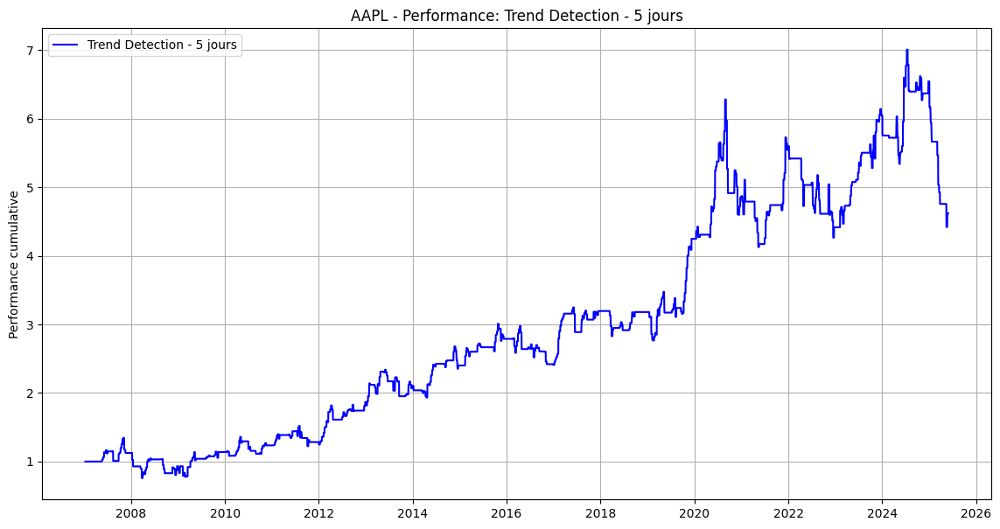

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           3.621937           0.087677               0.223716   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.391914     -0.435745               918  


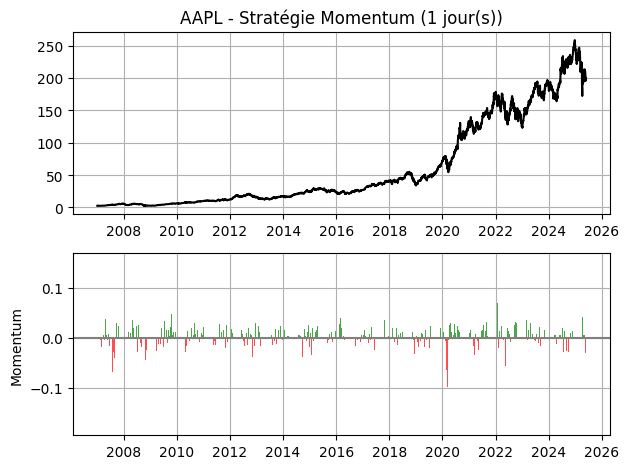


Performance Momentum 1j sur AAPL:


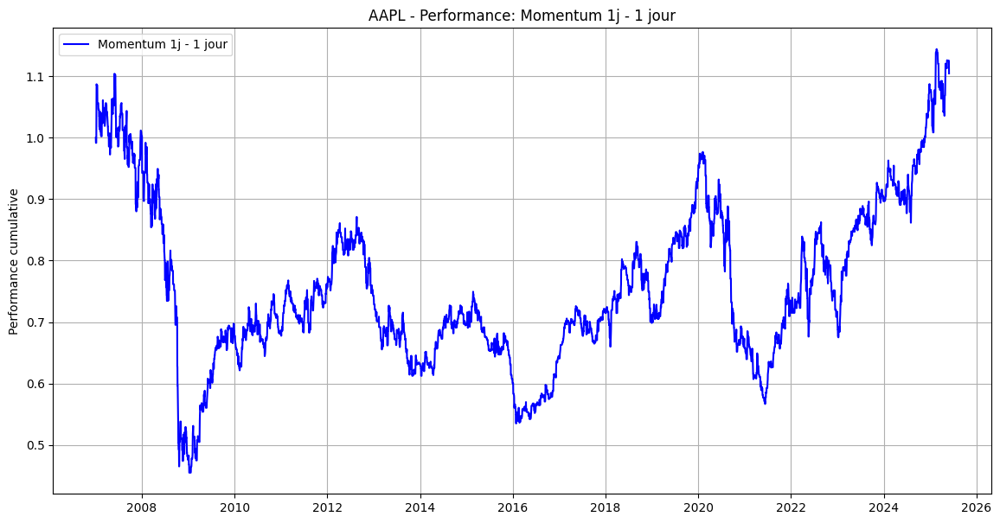

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.104596           0.005472               0.174057   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.031437     -0.587928              4594  


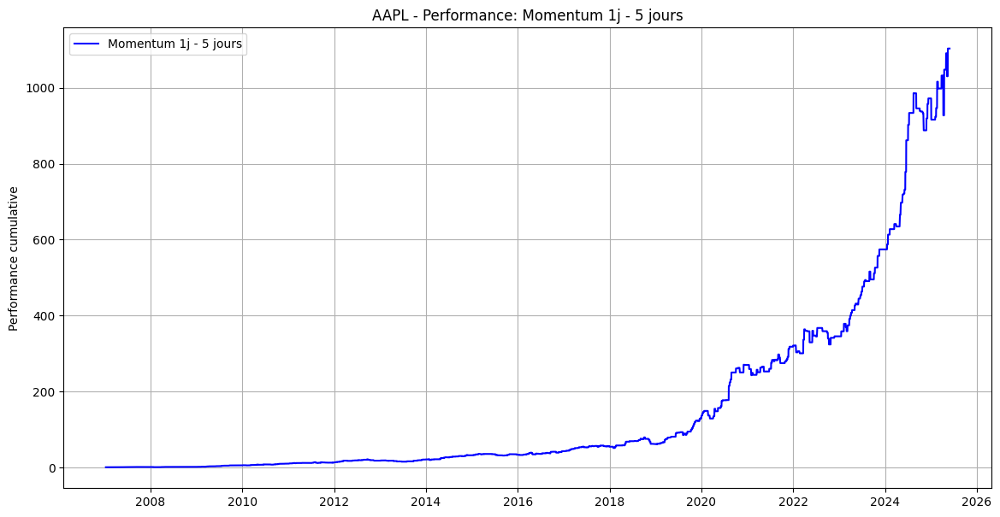

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value        1102.029307           0.469075               0.232712   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      2.015692     -0.314341               918  


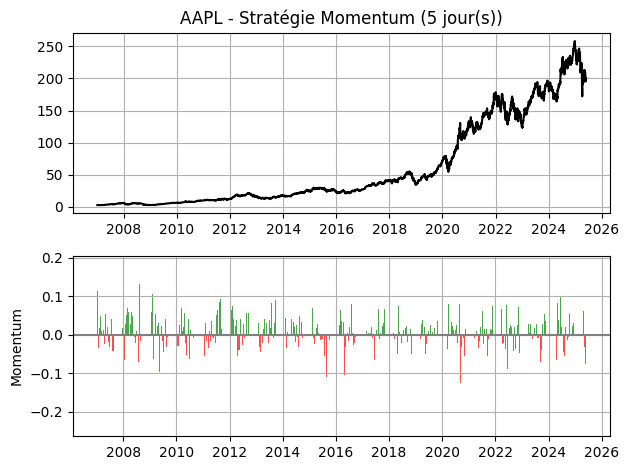


Performance Momentum 5j sur AAPL:


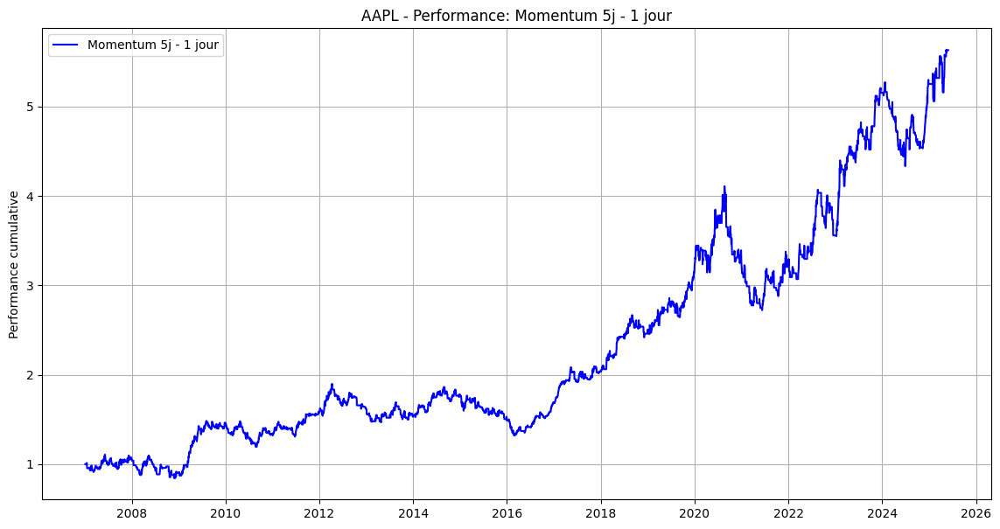

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           4.631783           0.099451               0.161171   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.617054      -0.33749              4594  


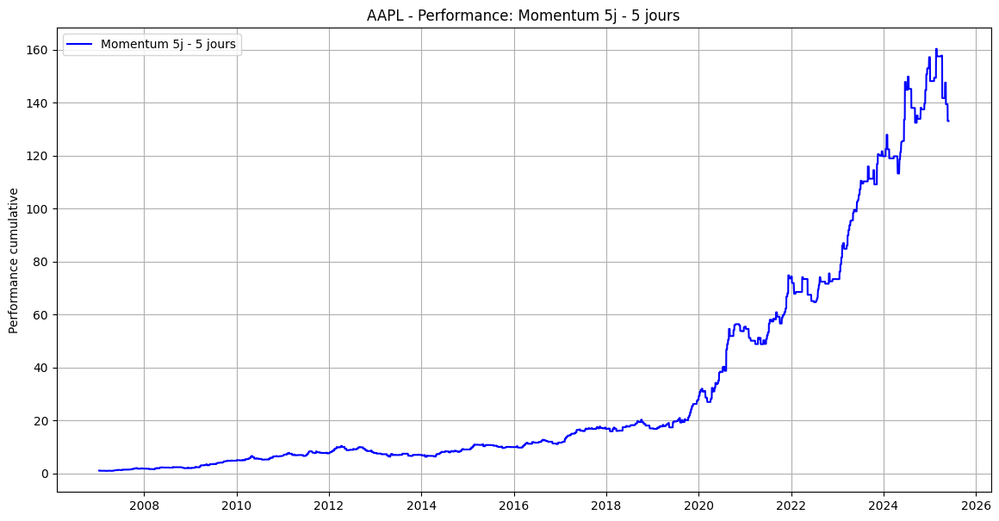

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value         132.071237           0.308026               0.228355   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      1.348888     -0.394242               918  


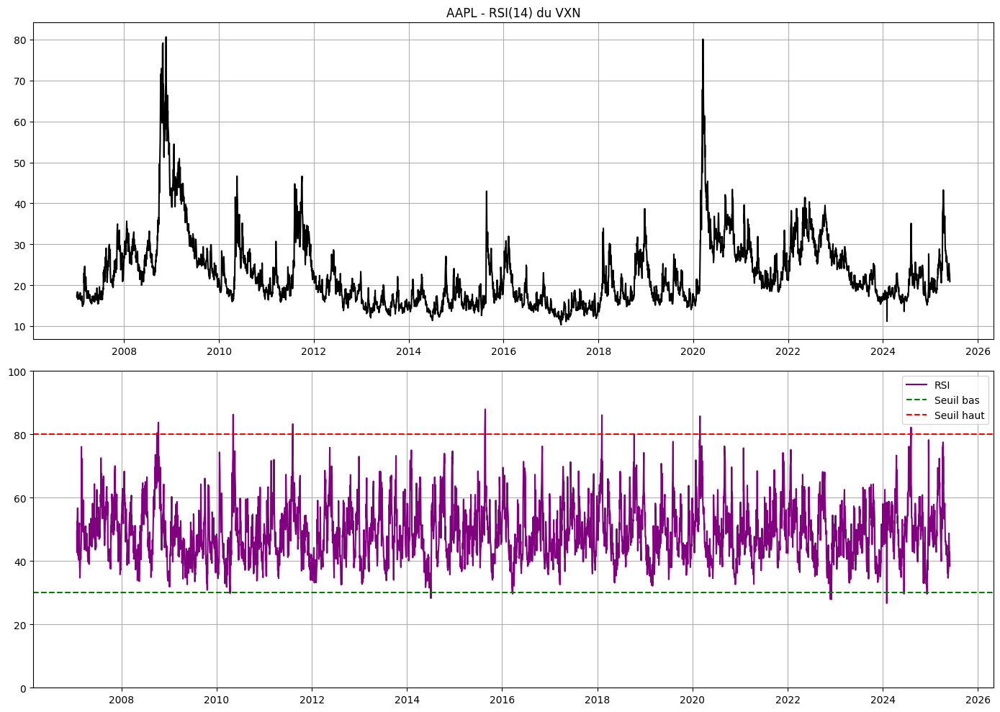


Performance RSI VXN sur AAPL:


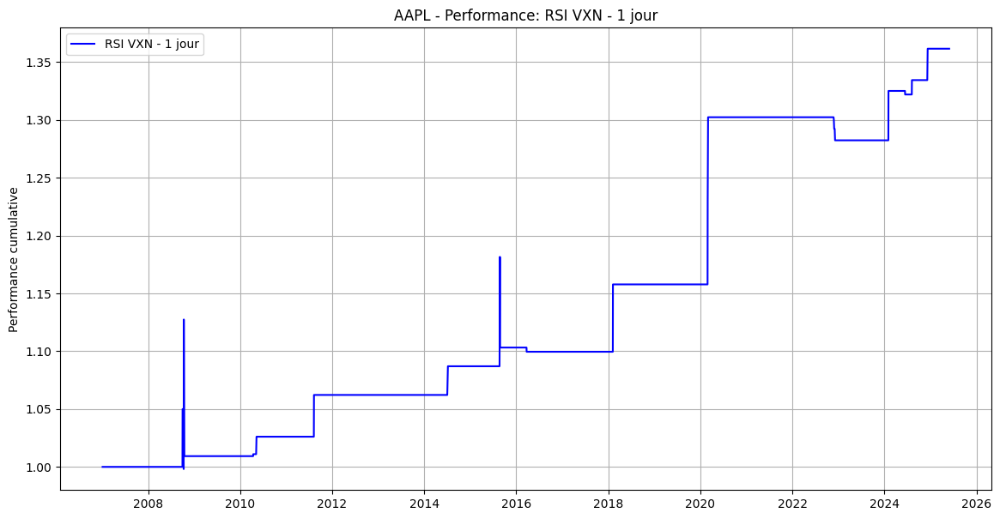

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.361474            0.01707               0.056587   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.301665     -0.104765              4594  


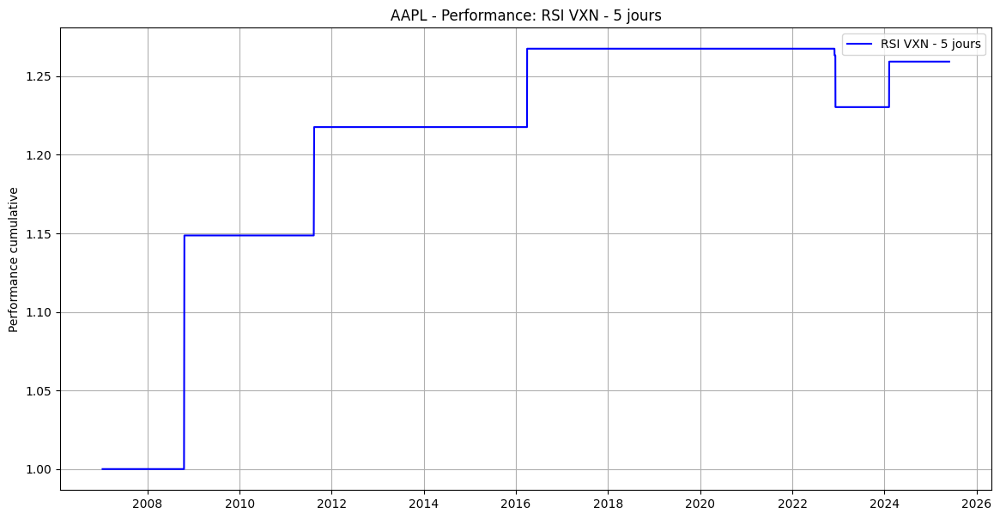

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.259293           0.012738                0.03962   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.321507     -0.029318               918  


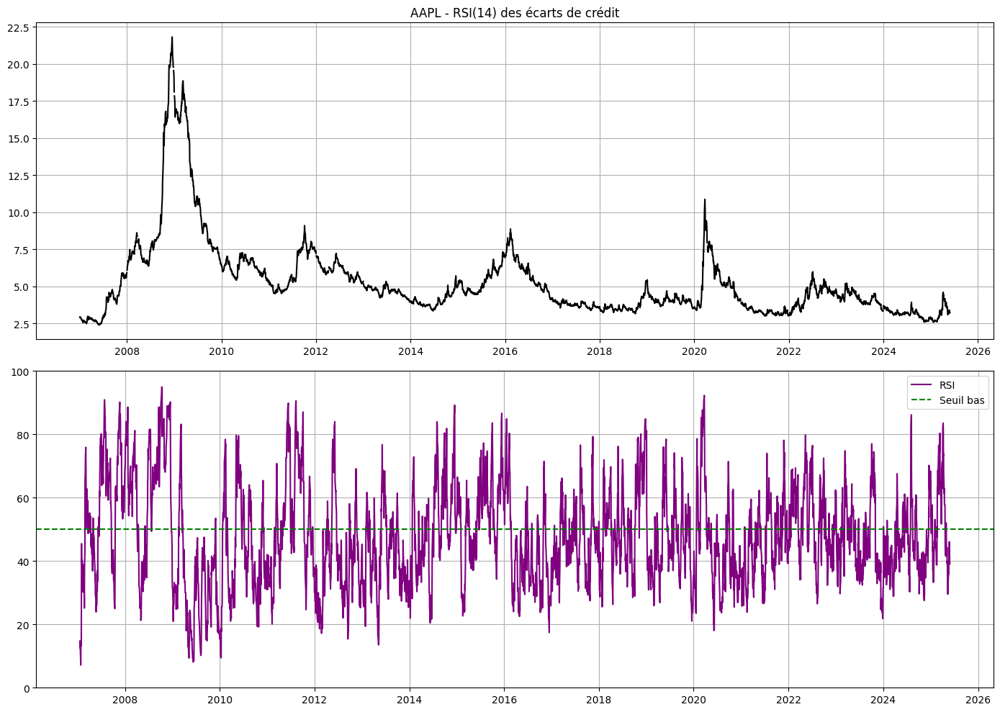


Performance RSI Credit sur AAPL:


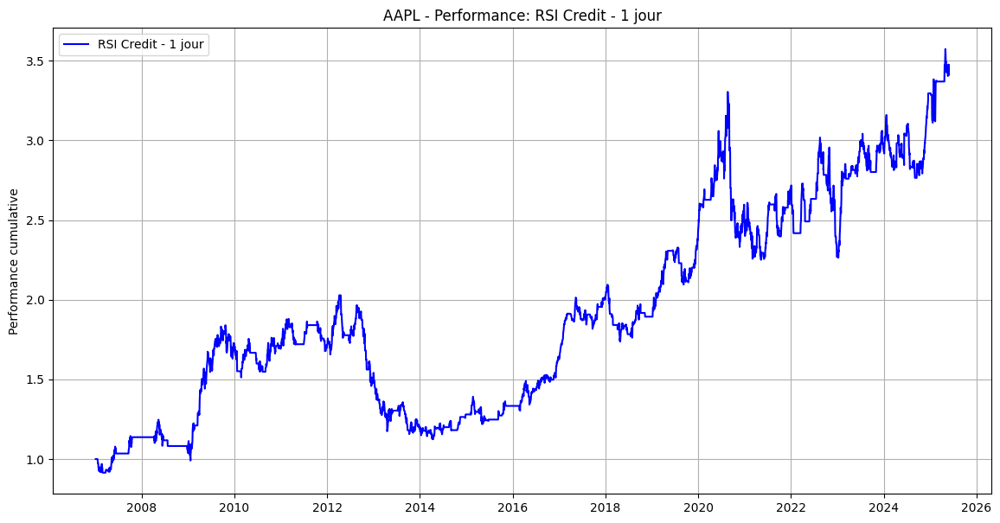

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           2.411557           0.069633               0.159014   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.437903     -0.445609              4594  


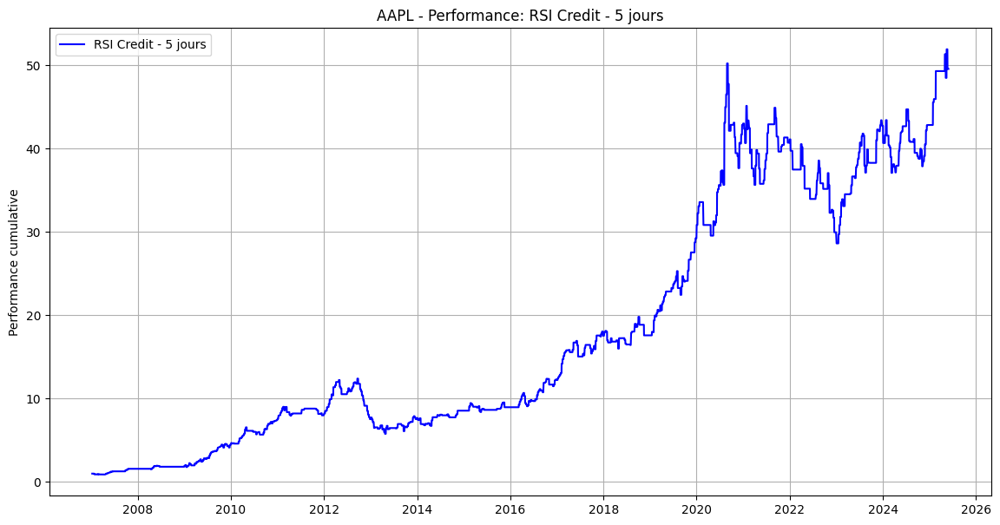

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          48.546873           0.238967                0.22649   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      1.055087     -0.534113               918  


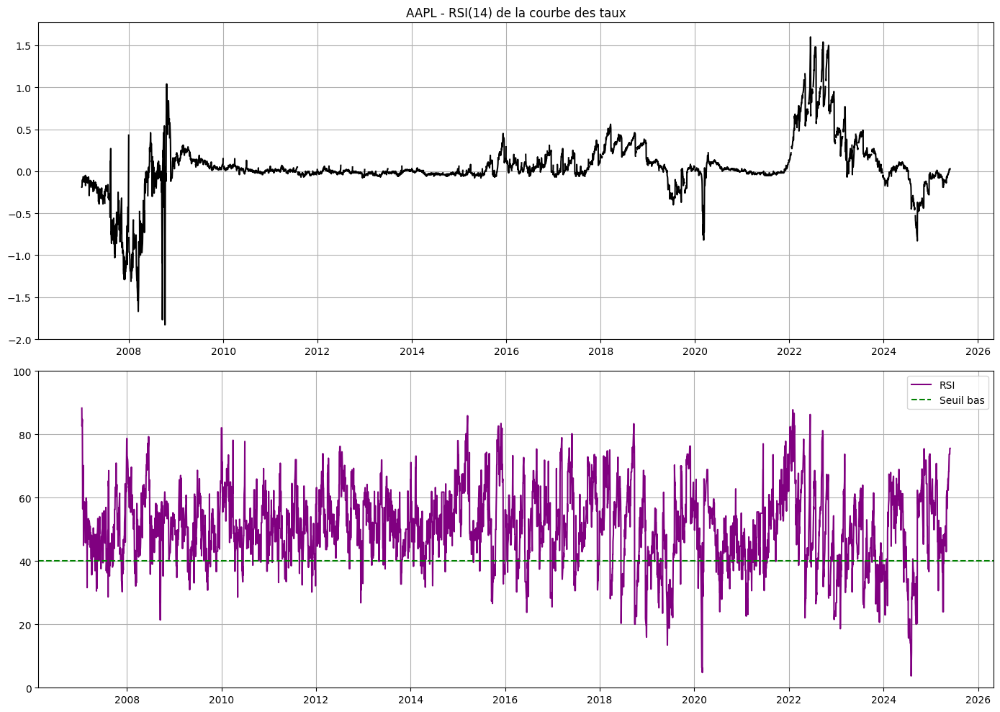


Performance RSI YC sur AAPL:


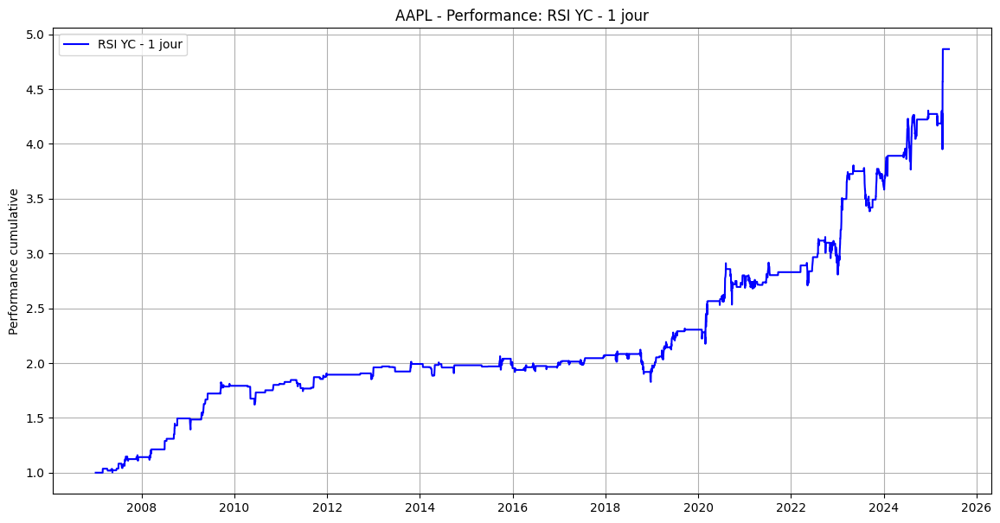

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           3.865454           0.090665               0.108738   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.833801     -0.138775              4594  


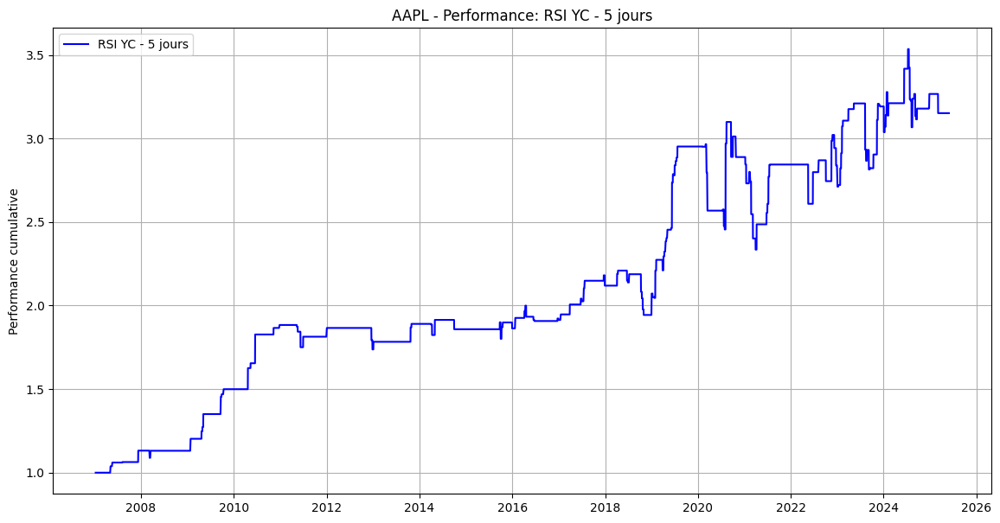

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           2.151781           0.065054               0.121473   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.535543     -0.246547               918  


In [11]:
test_all_strategies(data, fred_data, 'AAPL')

### Machine learning sur Apple

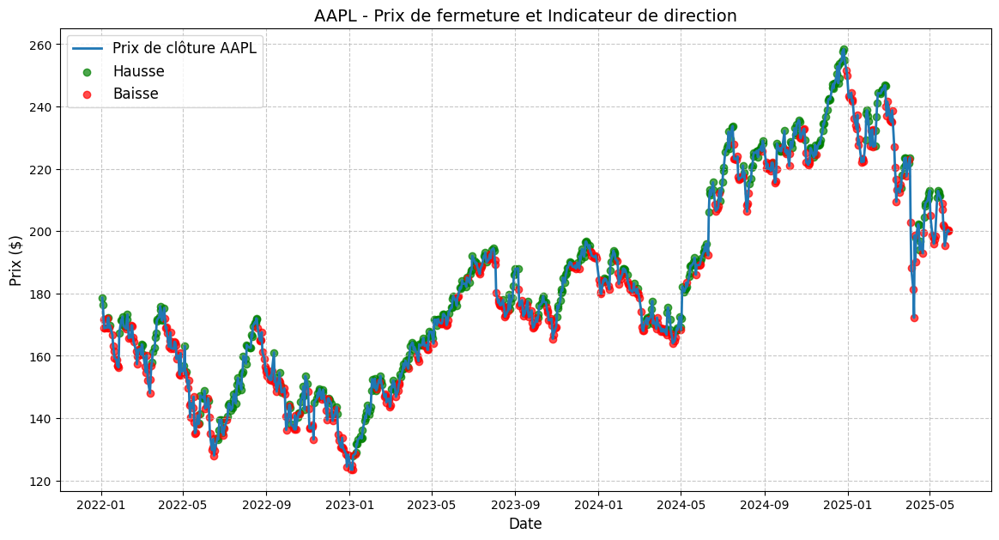

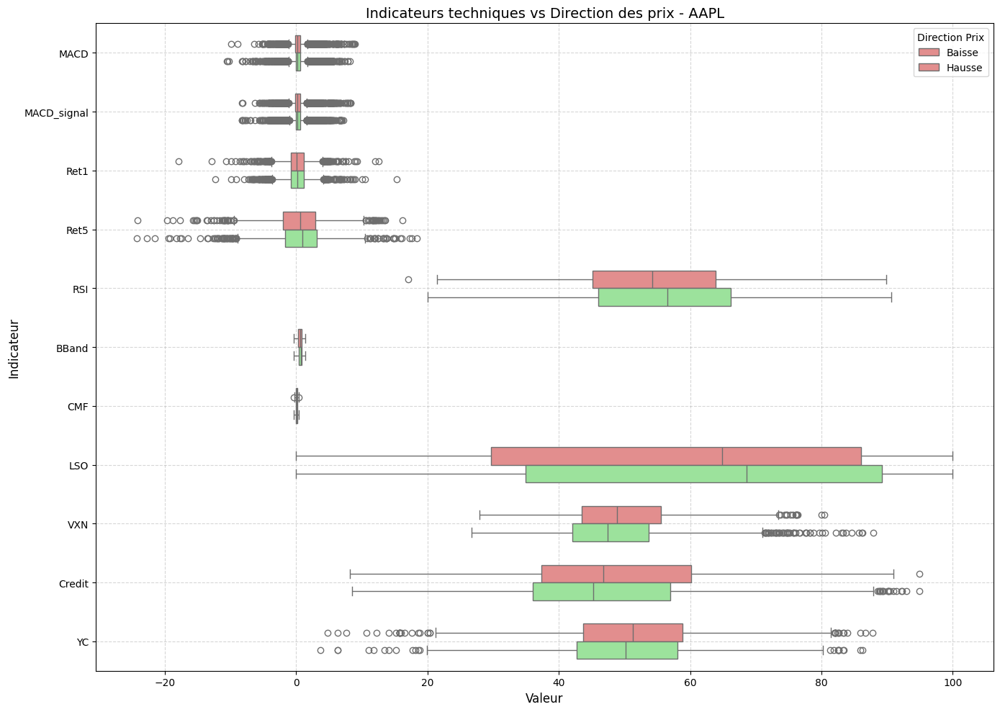


Régression Logistique


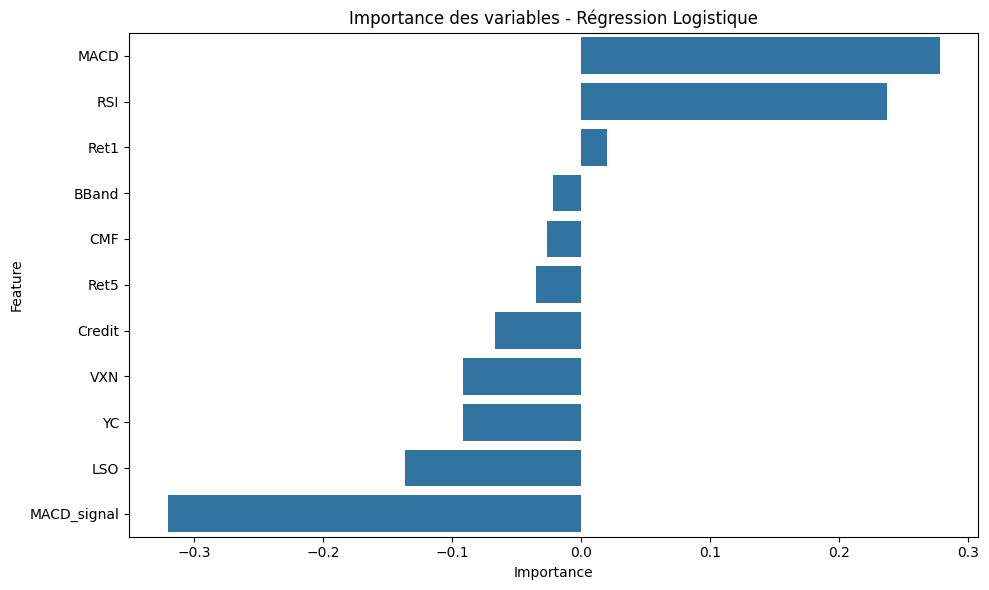

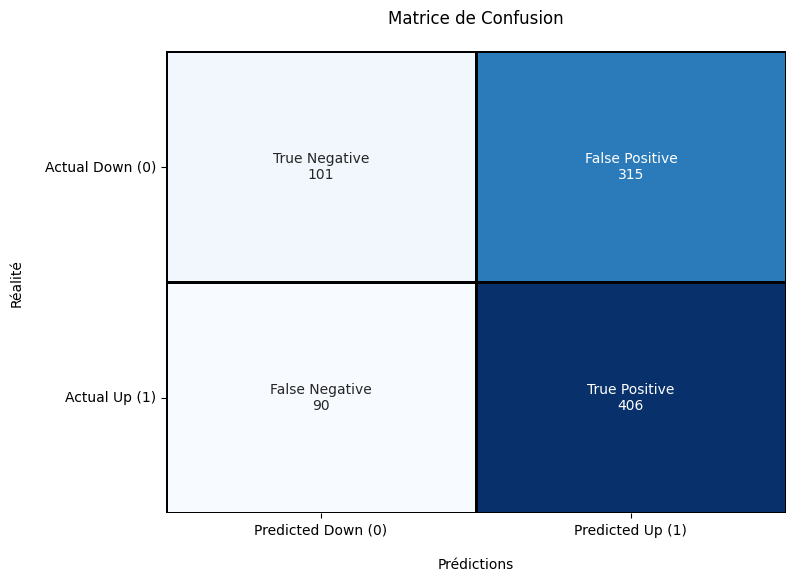


Rapport de classification - Régression Logistique:

              precision    recall  f1-score   support

           0       0.53      0.24      0.33       416
           1       0.56      0.82      0.67       496

    accuracy                           0.56       912
   macro avg       0.55      0.53      0.50       912
weighted avg       0.55      0.56      0.51       912



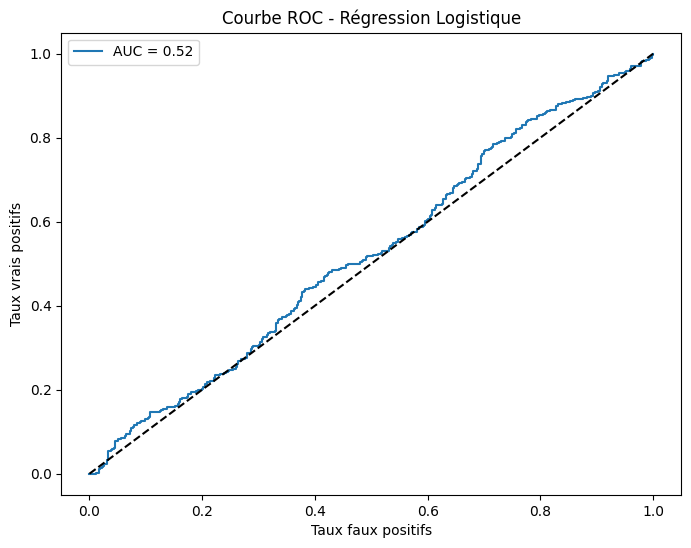


Arbre de Décision


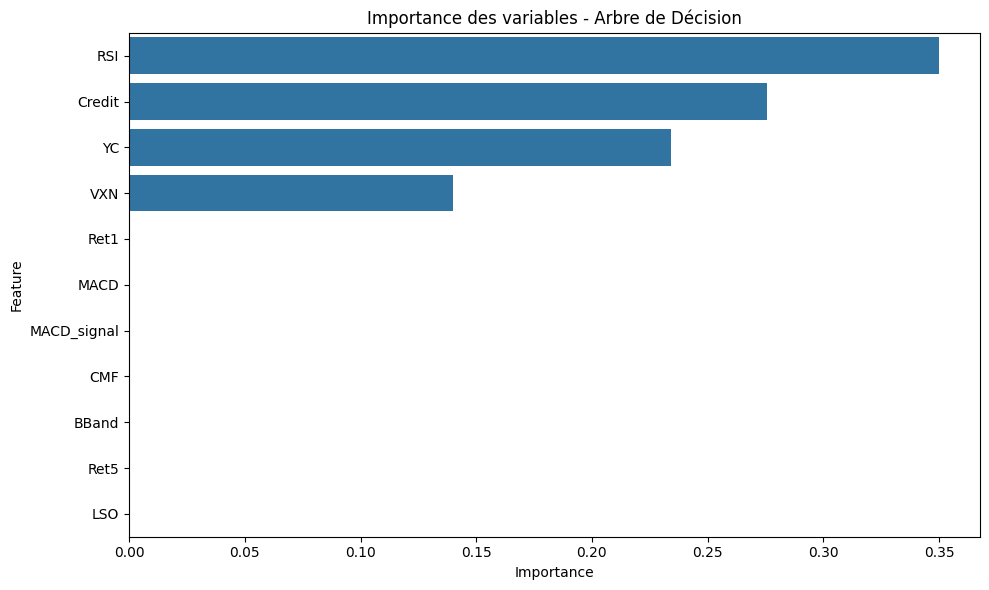

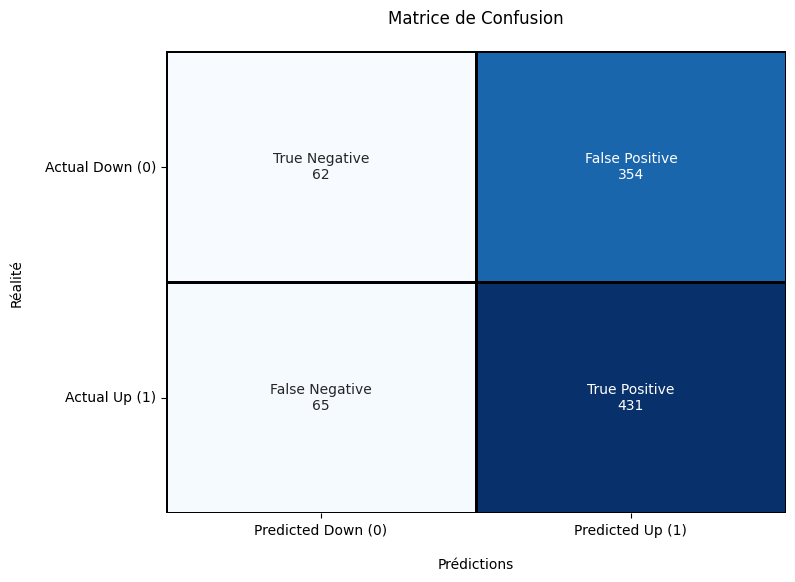


Rapport de classification - Arbre de Décision:

              precision    recall  f1-score   support

           0       0.49      0.15      0.23       416
           1       0.55      0.87      0.67       496

    accuracy                           0.54       912
   macro avg       0.52      0.51      0.45       912
weighted avg       0.52      0.54      0.47       912



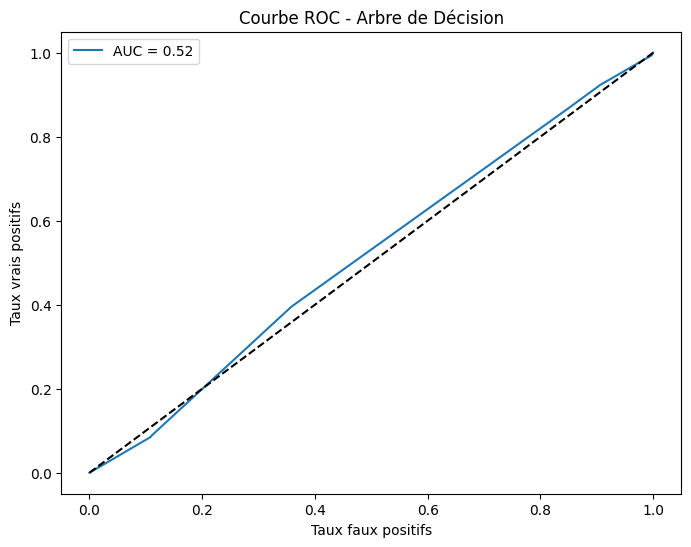

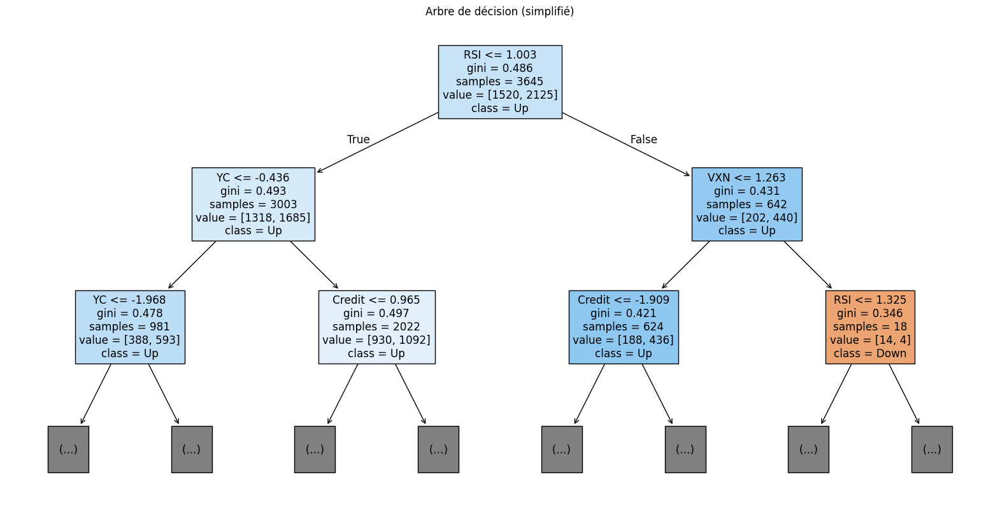


Random Forest


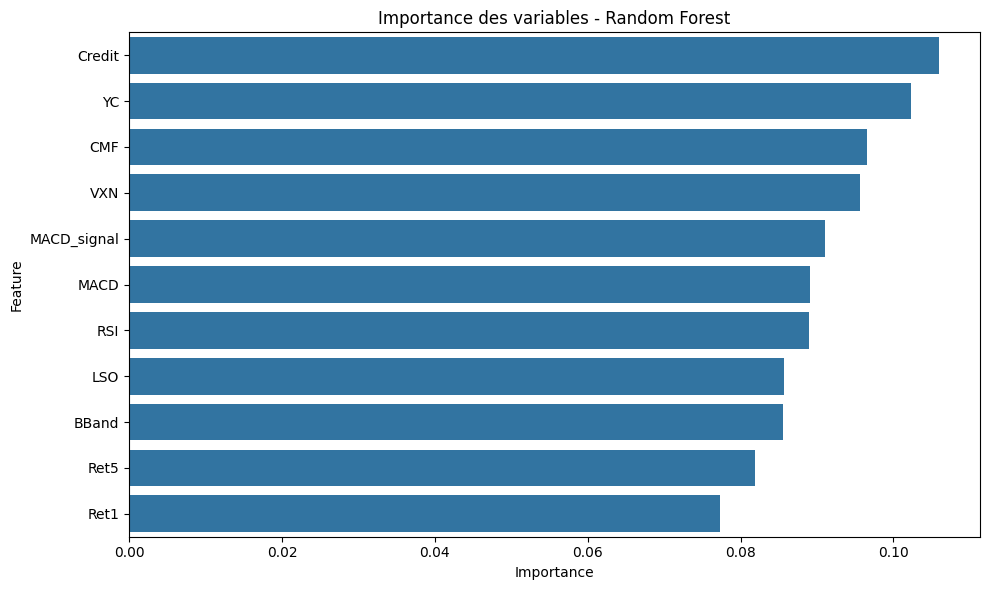

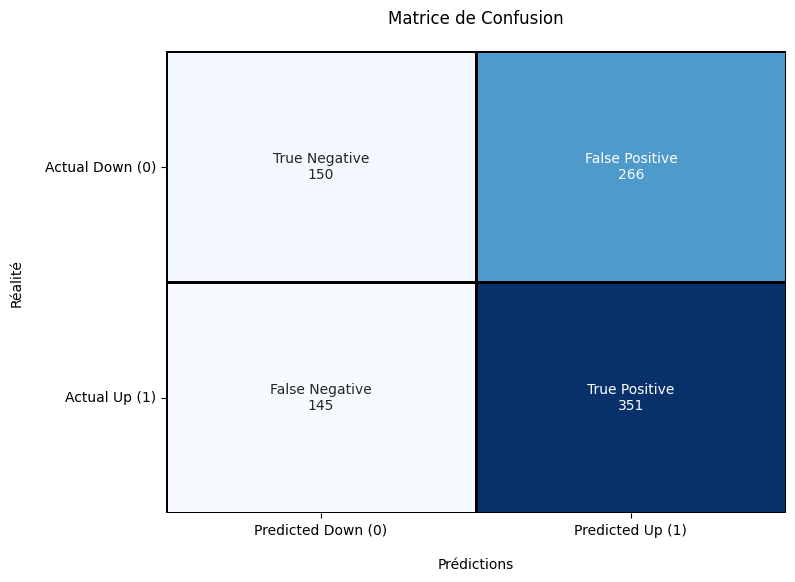


Rapport de classification - Random Forest:

              precision    recall  f1-score   support

           0       0.51      0.36      0.42       416
           1       0.57      0.71      0.63       496

    accuracy                           0.55       912
   macro avg       0.54      0.53      0.53       912
weighted avg       0.54      0.55      0.54       912



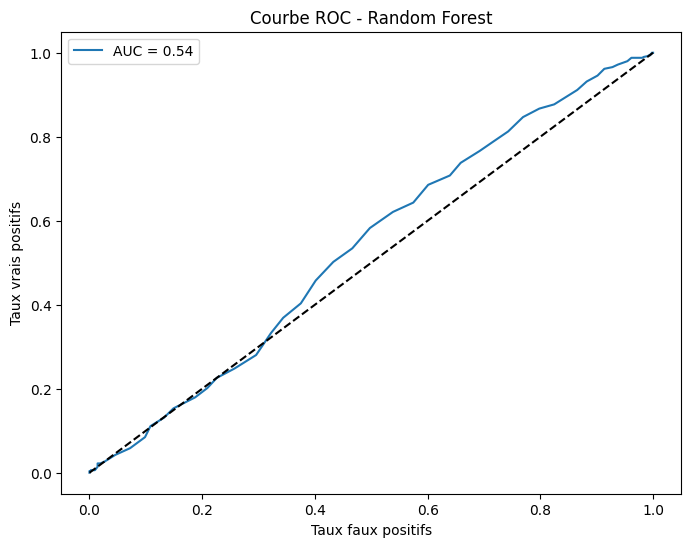


Gradient Boosting
n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 227
max_resources_: 3645
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 16
n_resources: 227
Fitting 3 folds for each of 16 candidates, totalling 48 fits
----------
iter: 1
n_candidates: 8
n_resources: 454
Fitting 3 folds for each of 8 candidates, totalling 24 fits
----------
iter: 2
n_candidates: 4
n_resources: 908
Fitting 3 folds for each of 4 candidates, totalling 12 fits
----------
iter: 3
n_candidates: 2
n_resources: 1816
Fitting 3 folds for each of 2 candidates, totalling 6 fits
----------
iter: 4
n_candidates: 1
n_resources: 3632
Fitting 3 folds for each of 1 candidates, totalling 3 fits

Meilleurs paramètres trouvés:
learning_rate: 0.2
max_depth: 3
min_samples_leaf: 20
n_estimators: 100


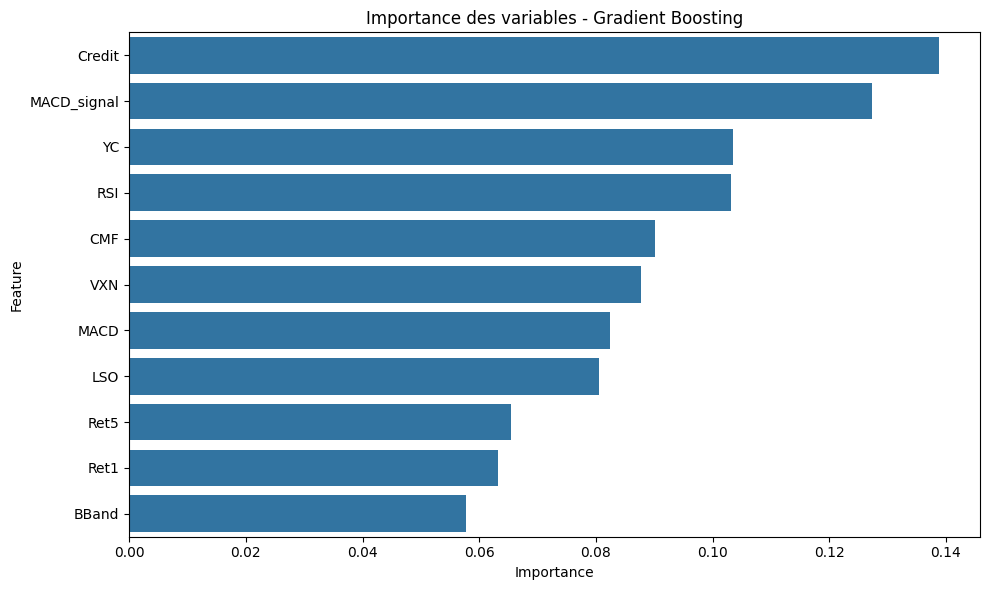

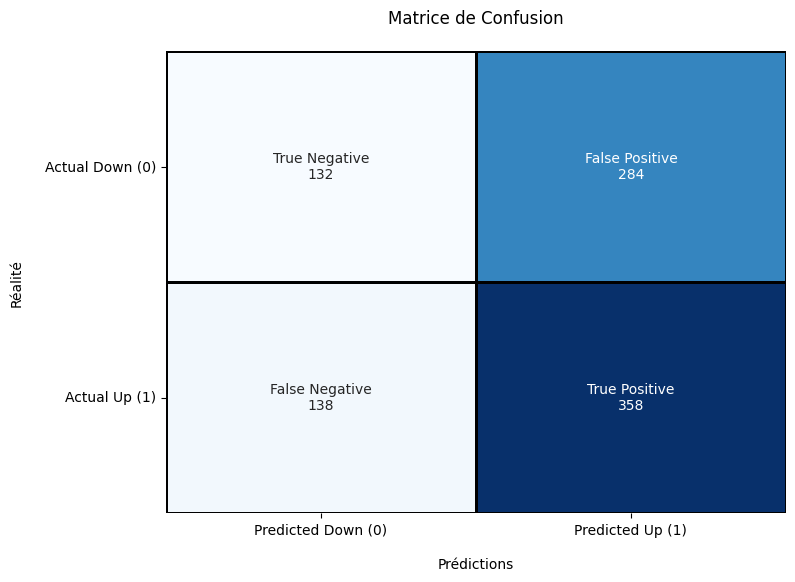


Rapport de classification - Gradient Boosting:

              precision    recall  f1-score   support

           0       0.49      0.32      0.38       416
           1       0.56      0.72      0.63       496

    accuracy                           0.54       912
   macro avg       0.52      0.52      0.51       912
weighted avg       0.53      0.54      0.52       912



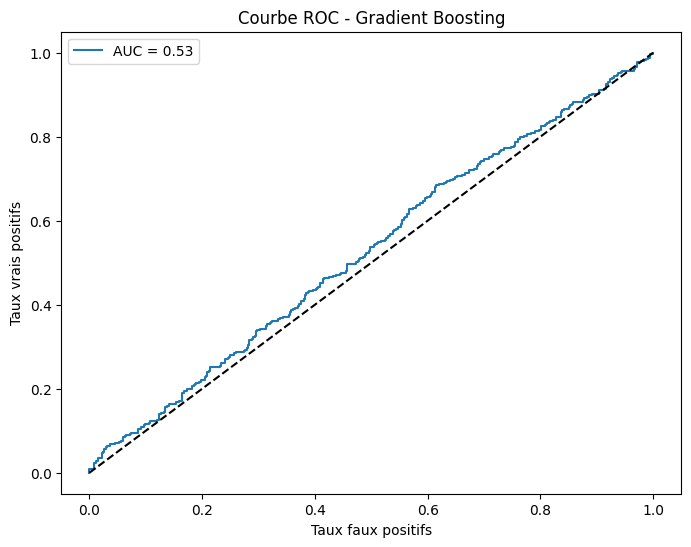

In [12]:
aapl_models = learn_from_ticker(data, fred_data, 'AAPL')

### Bonus: Validation de l'ensemble des procédures avec Microsoft


===== ANALYSE DES STRATÉGIES POUR MSFT =====


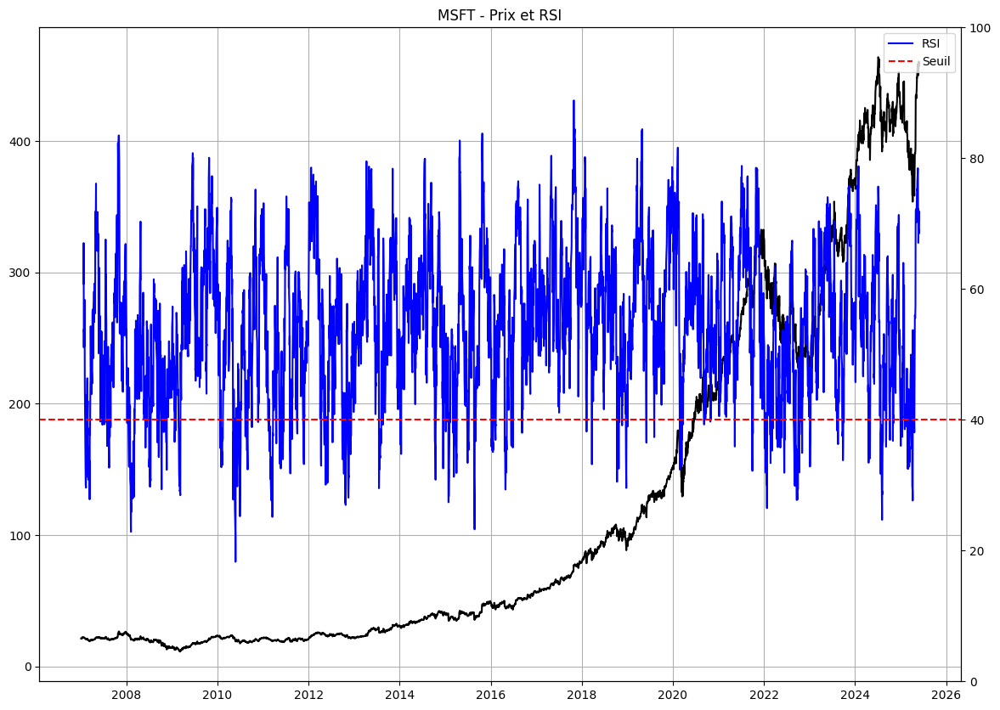


Performance RSI sur MSFT:


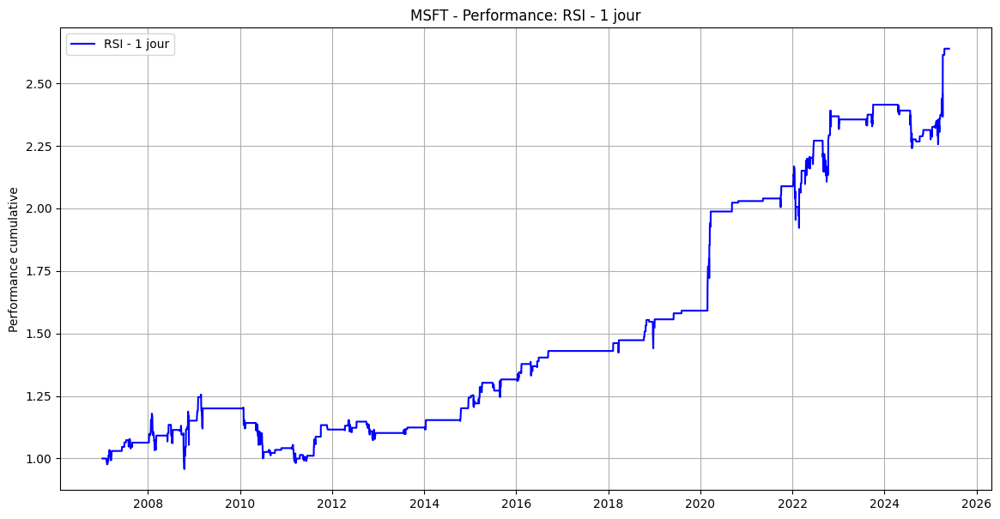

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           1.638239           0.054656               0.102923   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.531036     -0.218361              4594  


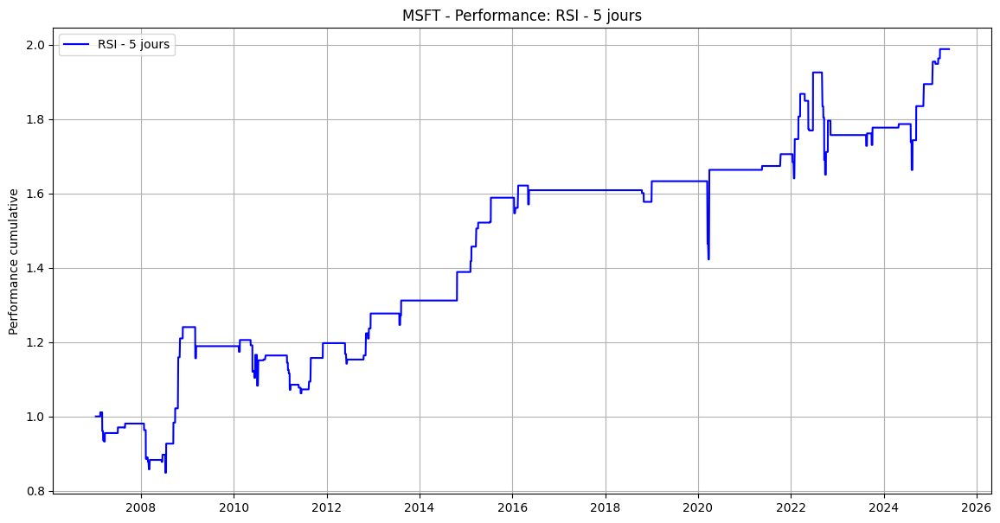

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.988534           0.038461               0.099765   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.385513     -0.160661               918  


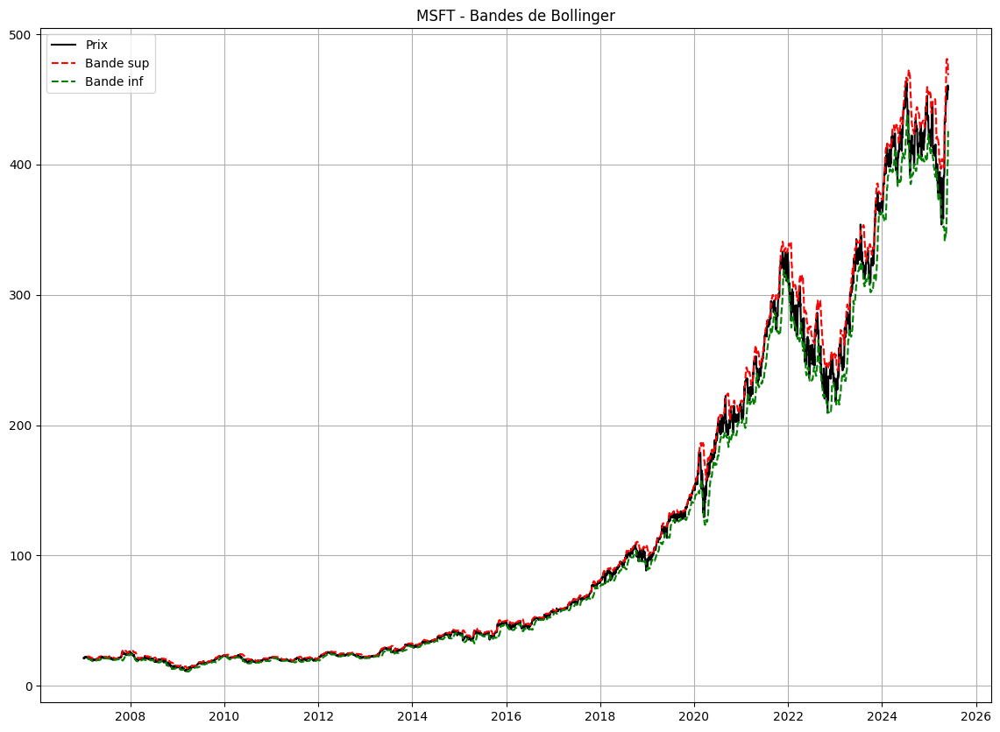


Performance Bollinger sur MSFT:


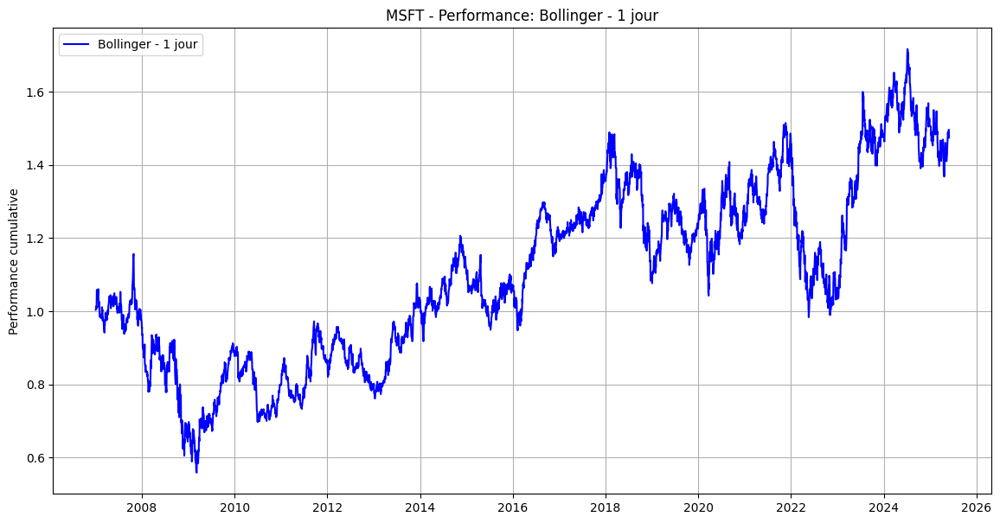

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.474191           0.021518               0.206367   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.104269     -0.516901              4594  


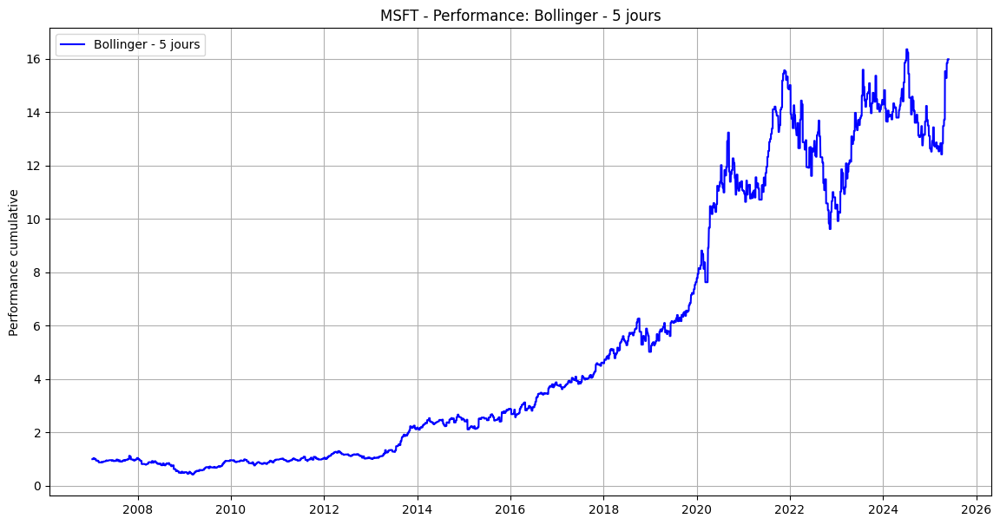

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          14.983796           0.164352               0.263782   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.623061     -0.625531               918  


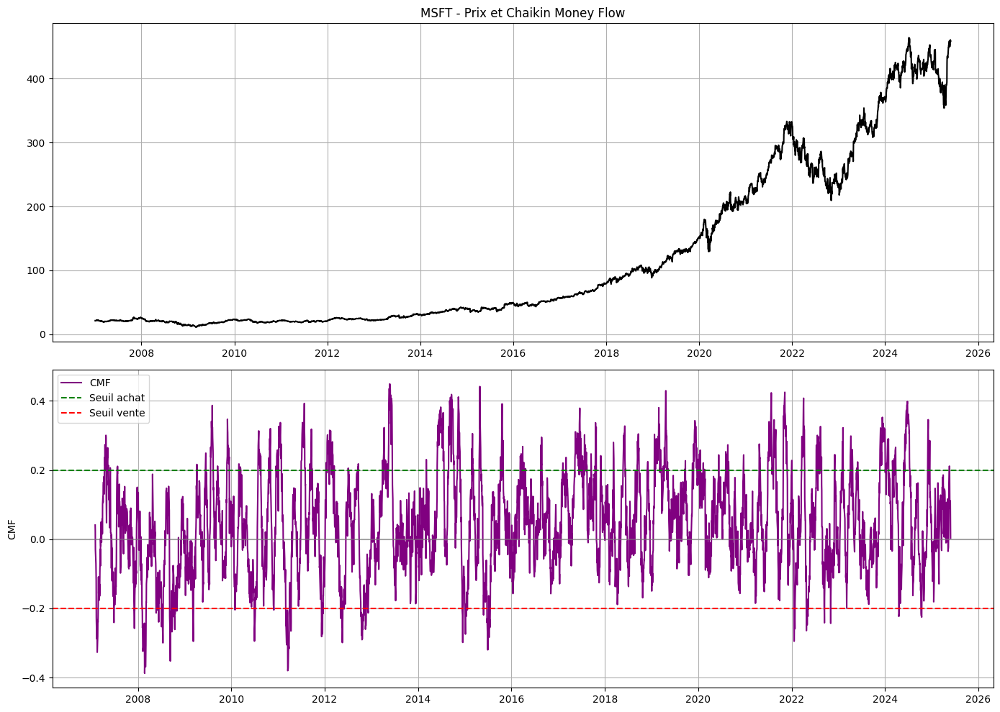


Performance Chaikin MF sur MSFT:


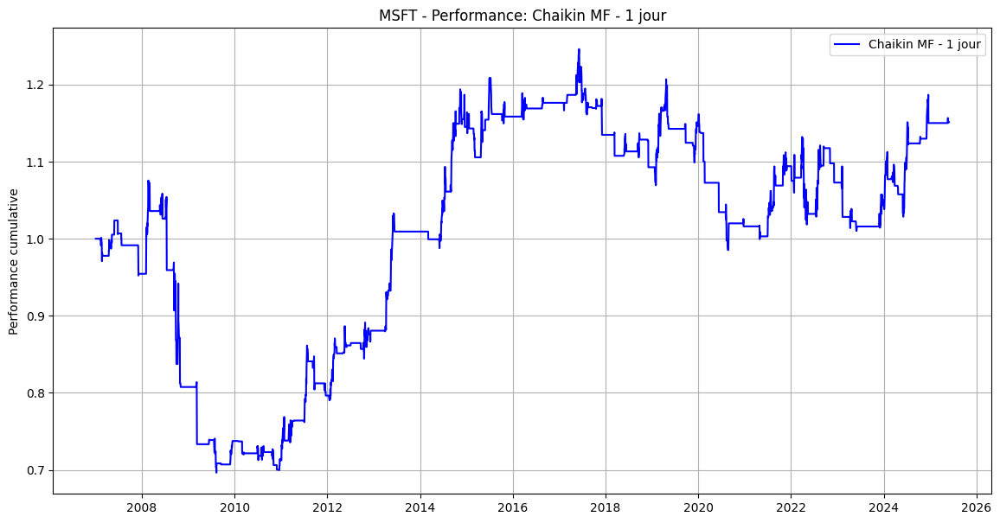

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.151337            0.00776               0.088793   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.087396      -0.35256              4594  


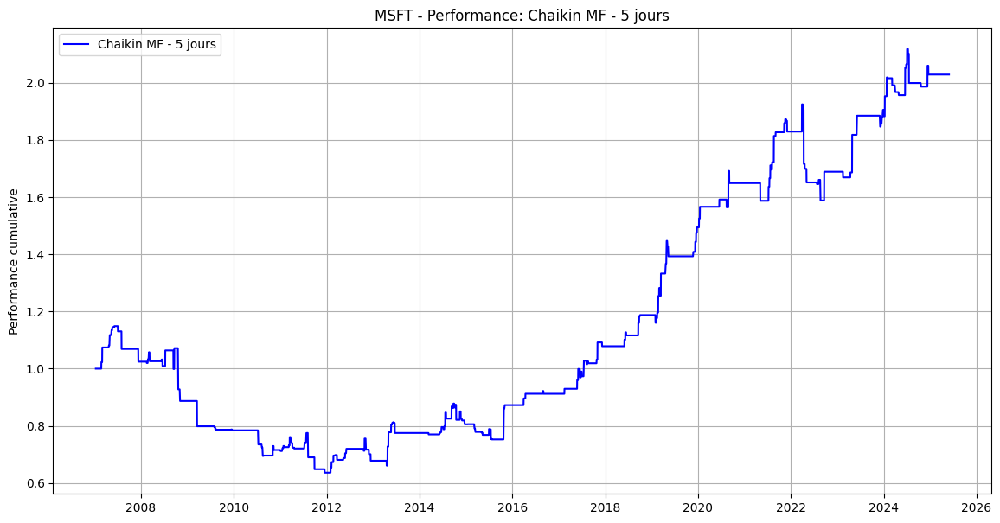

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           1.028396           0.039593               0.114419   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.346034     -0.446182               918  


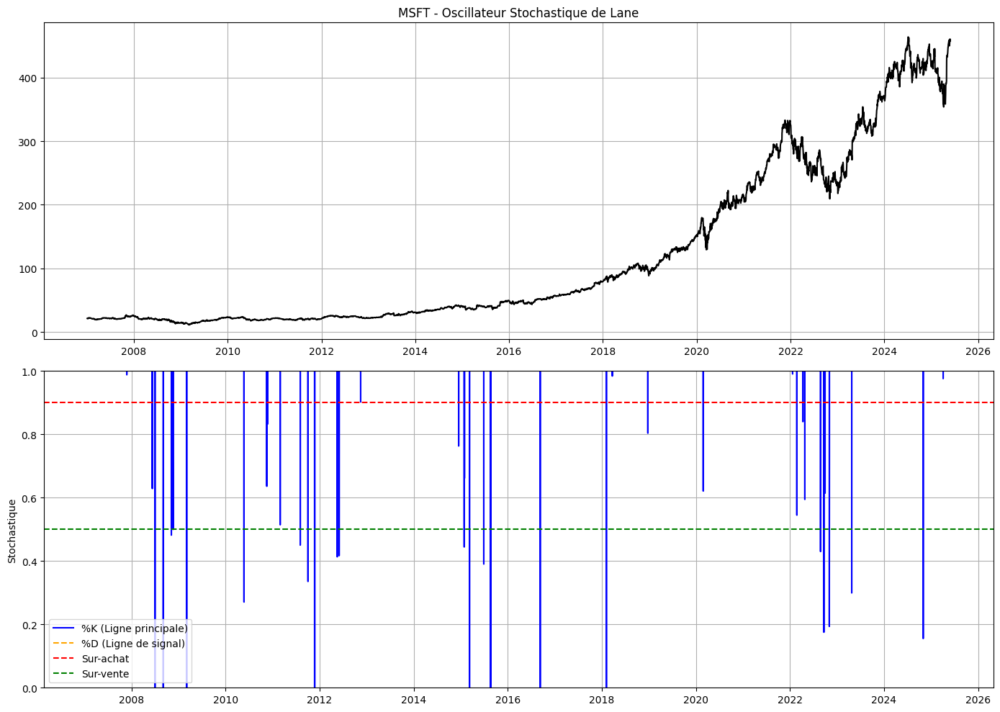


Performance Stochastique sur MSFT:


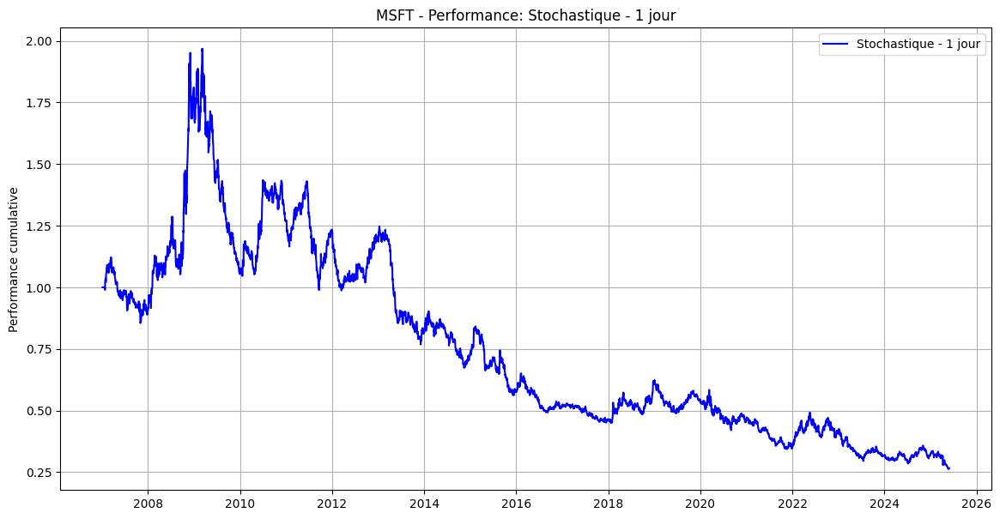

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.733344           -0.06994                0.21562   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.324366     -0.866472              4594  


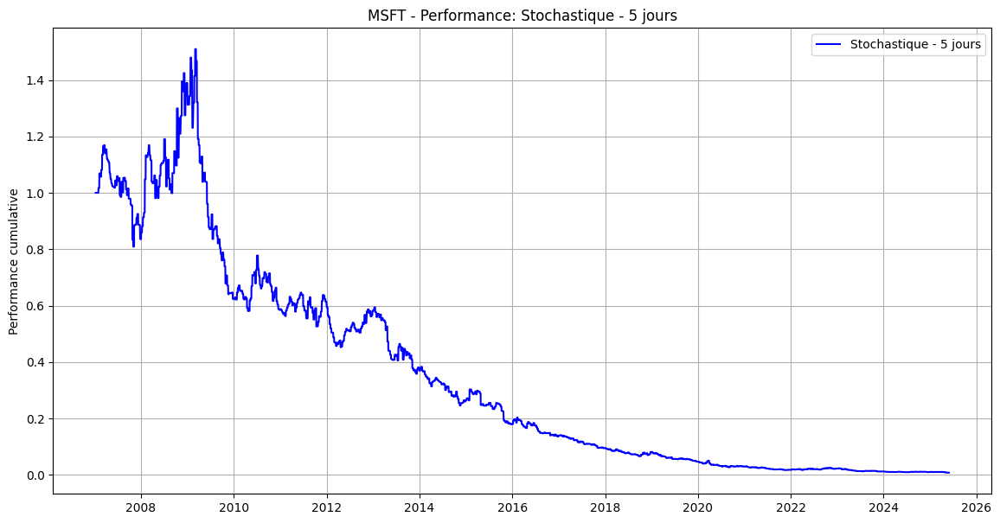

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.992161          -0.233713               0.270347   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.864493     -0.994807               918  


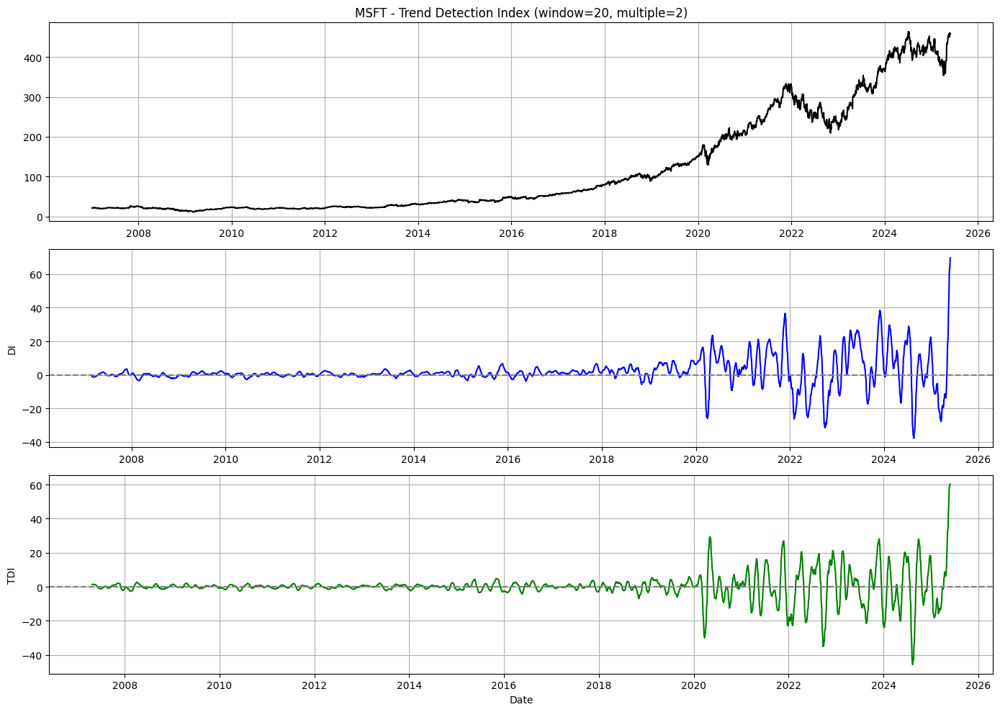


Performance Trend Detection sur MSFT:


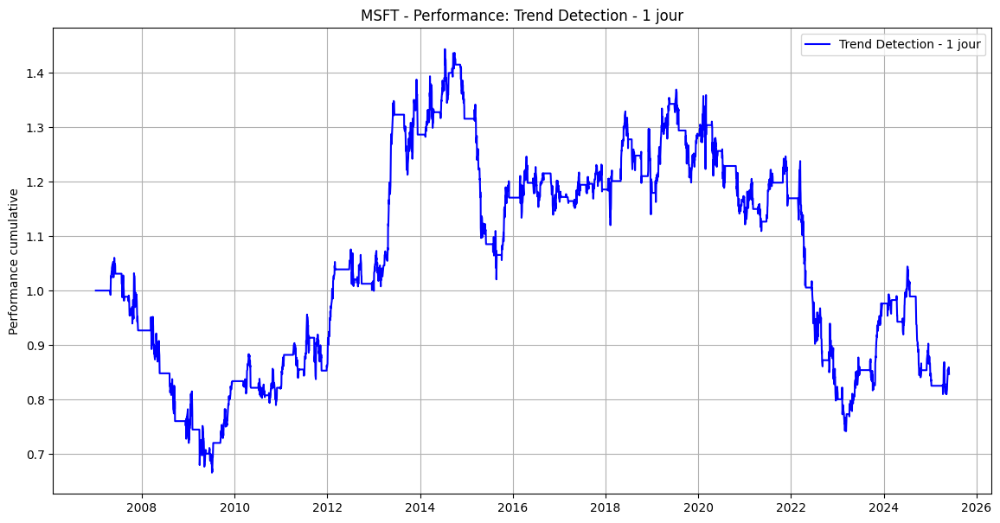

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.153426          -0.009095               0.144772   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.062821     -0.486469              4594  


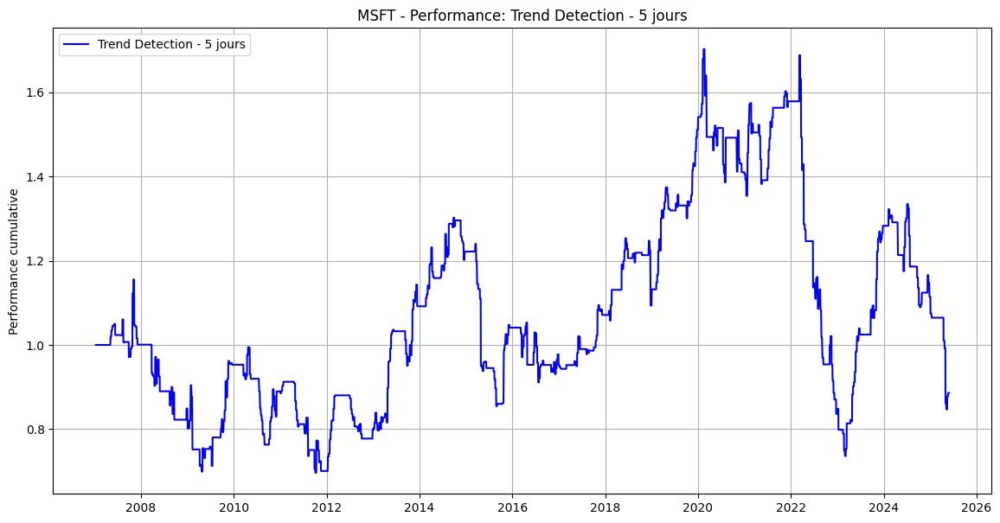

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.113872          -0.006615                0.18445   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.035865       -0.5673               918  


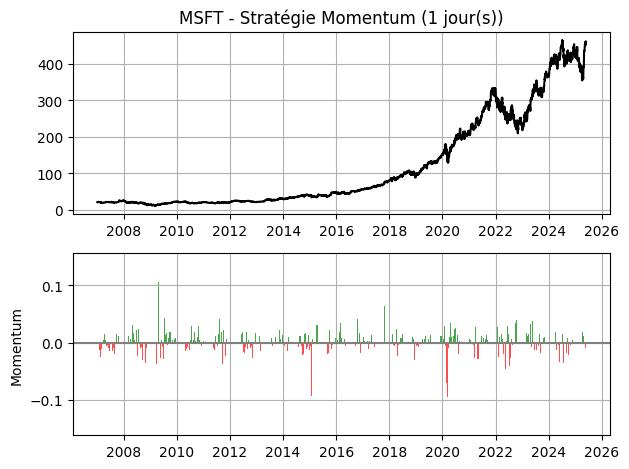


Performance Momentum 1j sur MSFT:


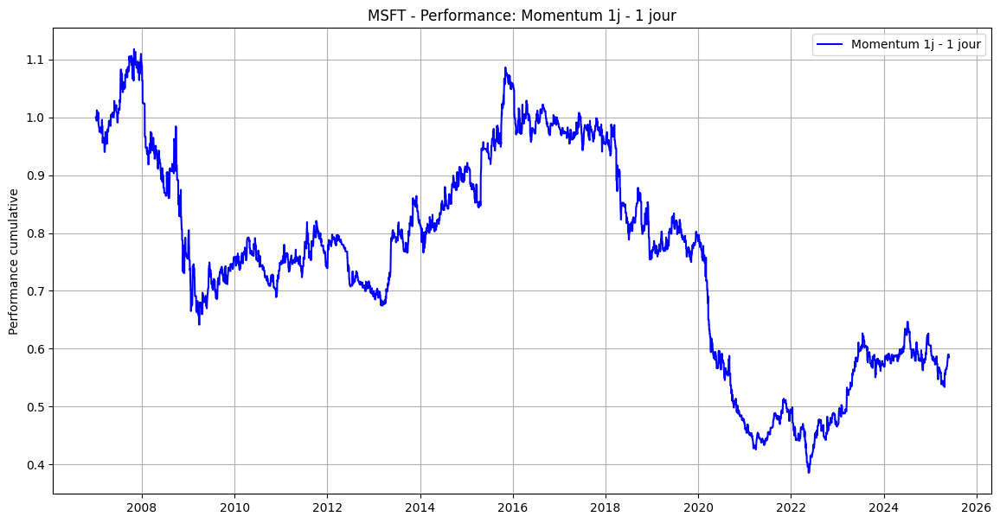

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.414865          -0.028969               0.147016   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.197048     -0.654931              4594  


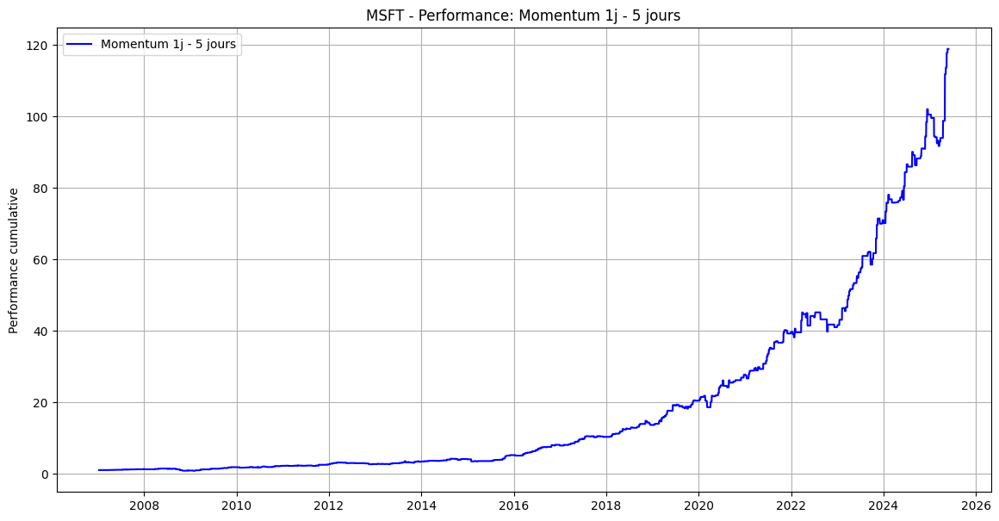

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value         117.908576            0.29997               0.186842   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value       1.60547     -0.461798               918  


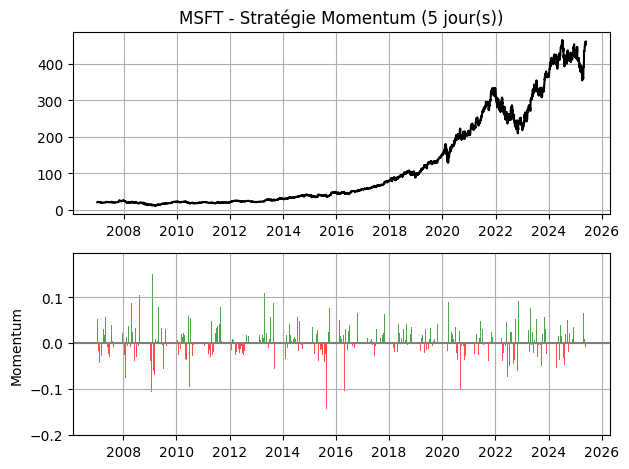


Performance Momentum 5j sur MSFT:


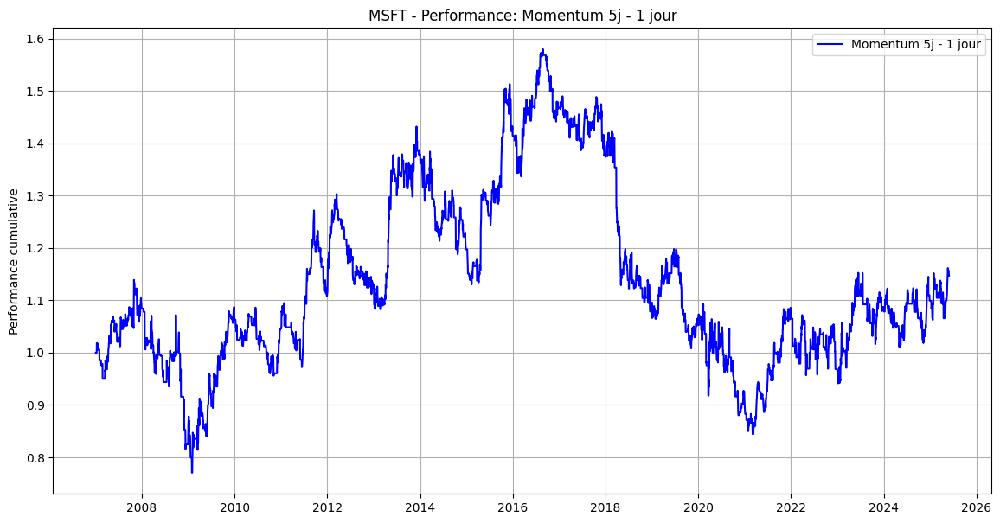

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.147017           0.007552               0.149099   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.050654     -0.465513              4594  


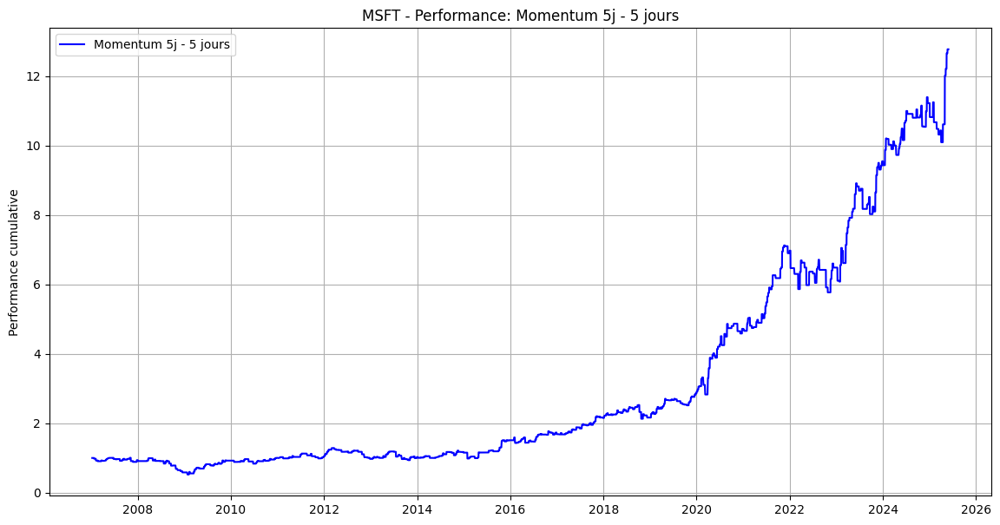

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          11.776006            0.15012               0.202471   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.741441      -0.47816               918  


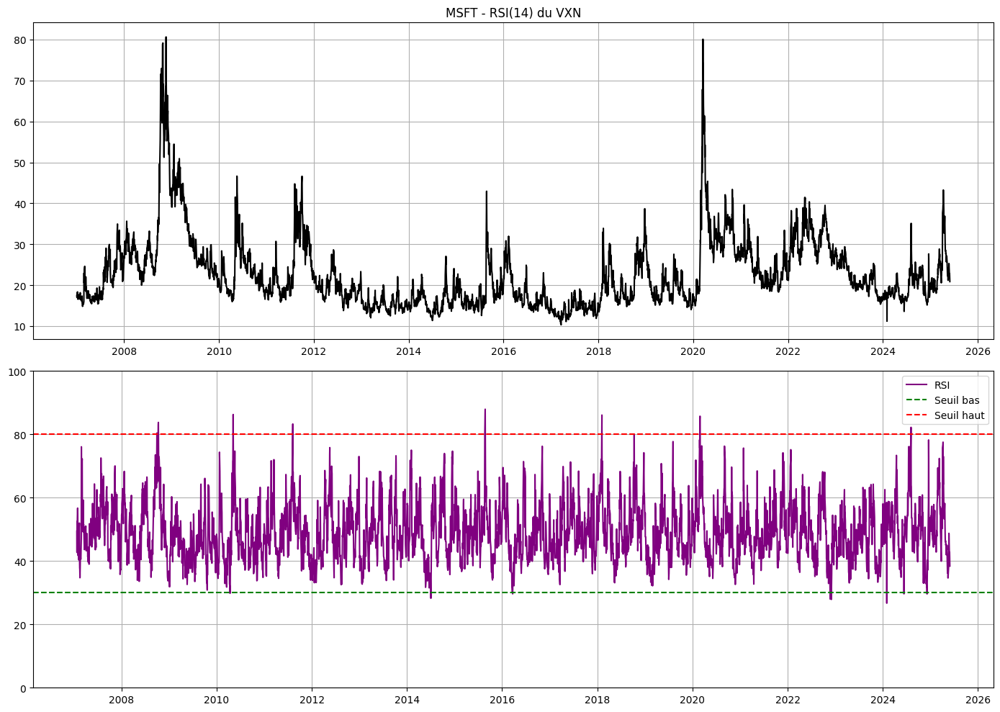


Performance RSI VXN sur MSFT:


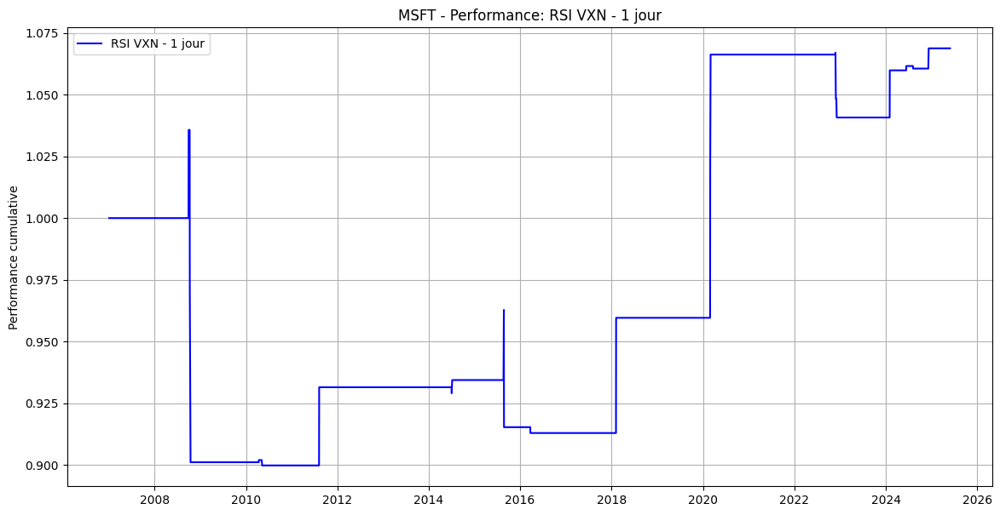

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.068743           0.003654               0.035462   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.103028      -0.13118              4594  


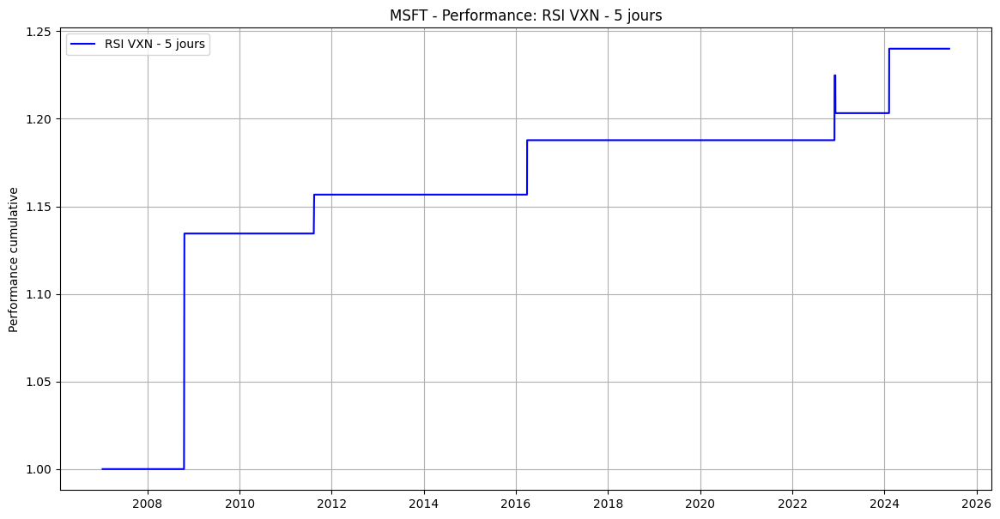

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.239978           0.011879               0.034253   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.346806     -0.017613               918  


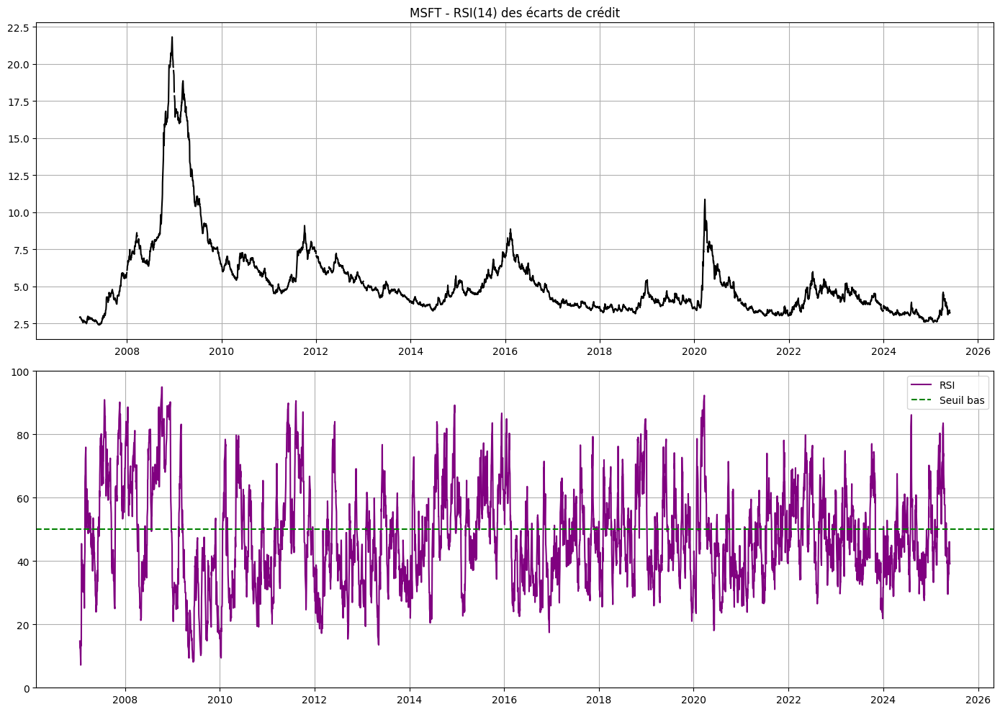


Performance RSI Credit sur MSFT:


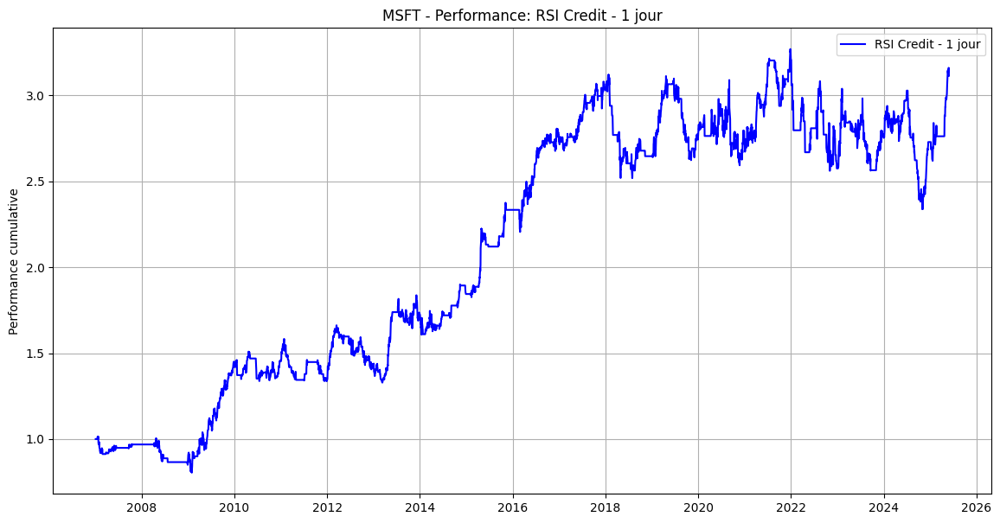

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           2.115096           0.064312               0.142365   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.451742     -0.284977              4594  


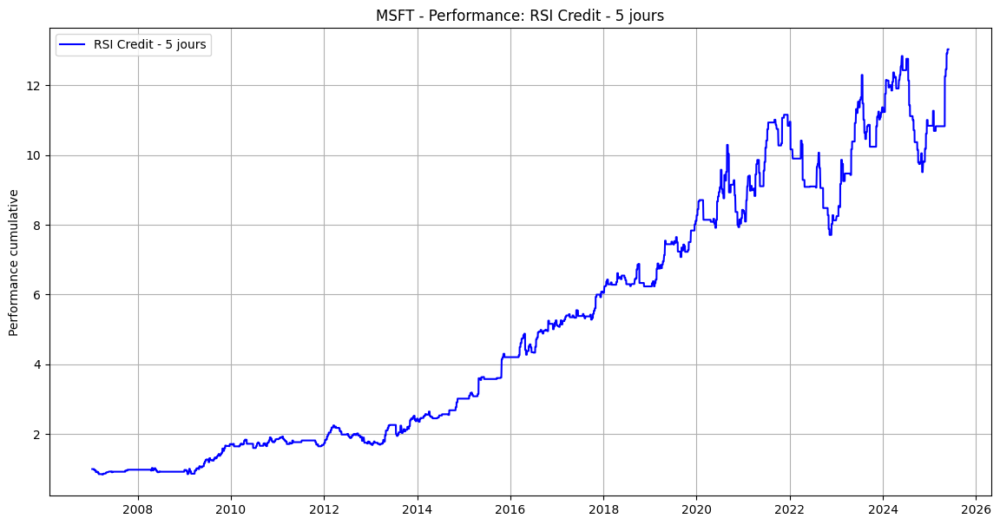

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          12.028291           0.151356               0.189295   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.799577     -0.308758               918  


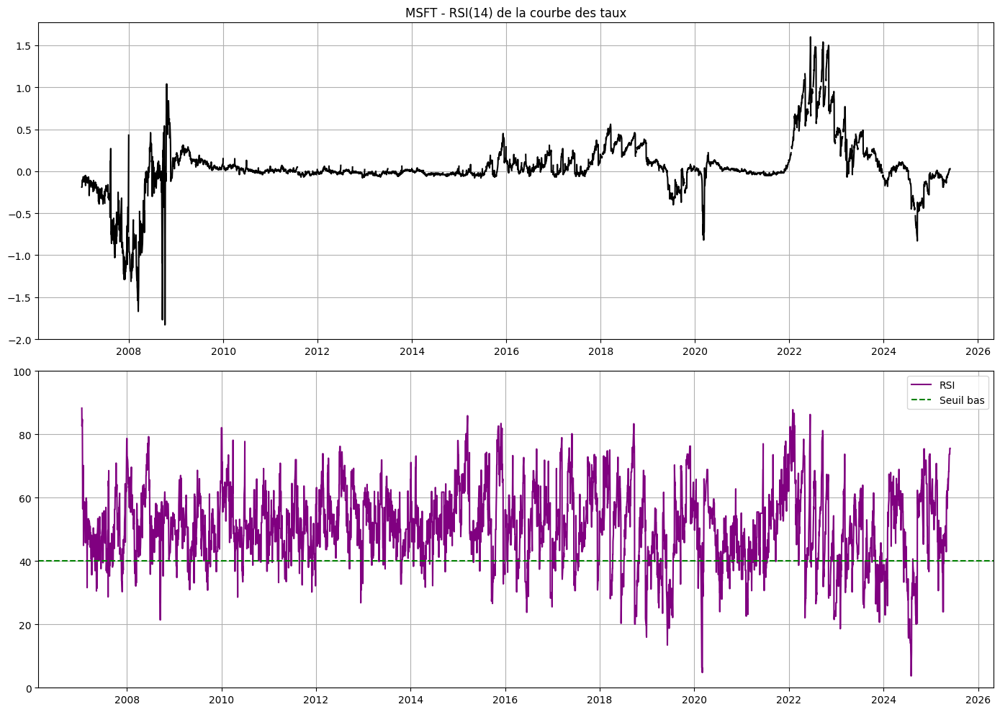


Performance RSI YC sur MSFT:


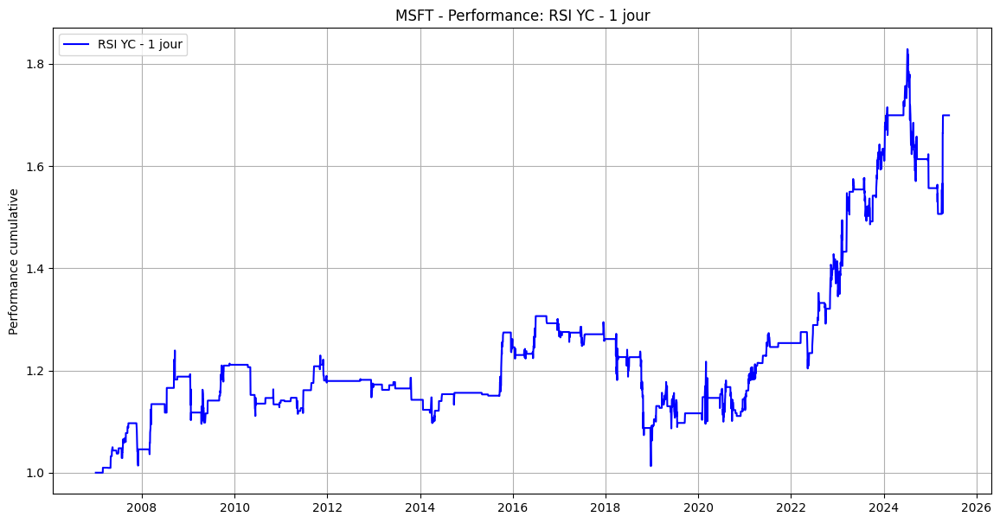

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.699109           0.029505               0.099054   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.297872     -0.224656              4594  


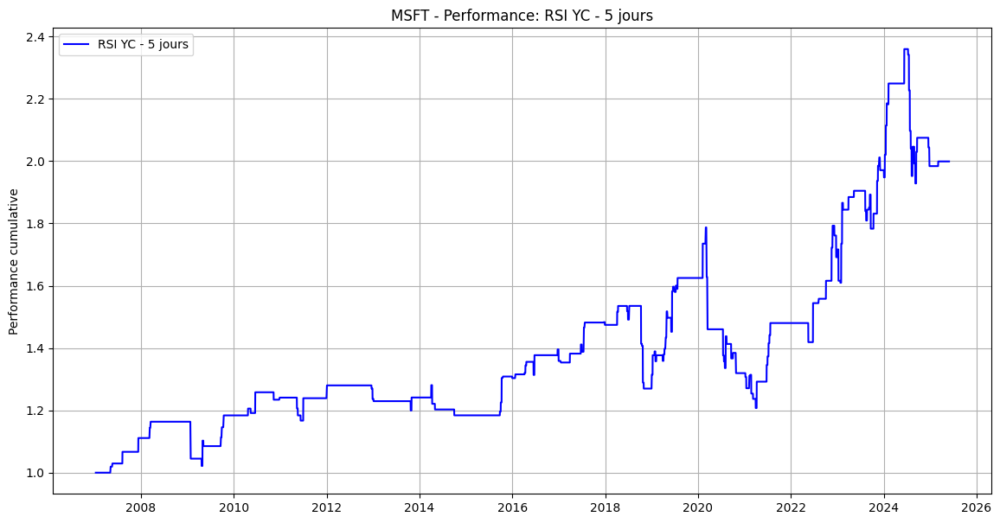

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.998913           0.038757               0.107753   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.359687     -0.324347               918  


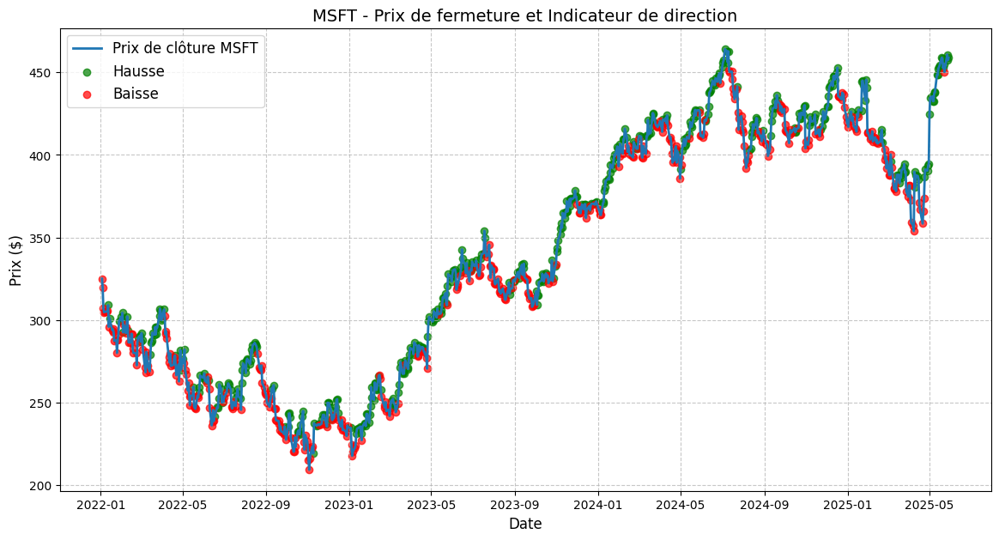

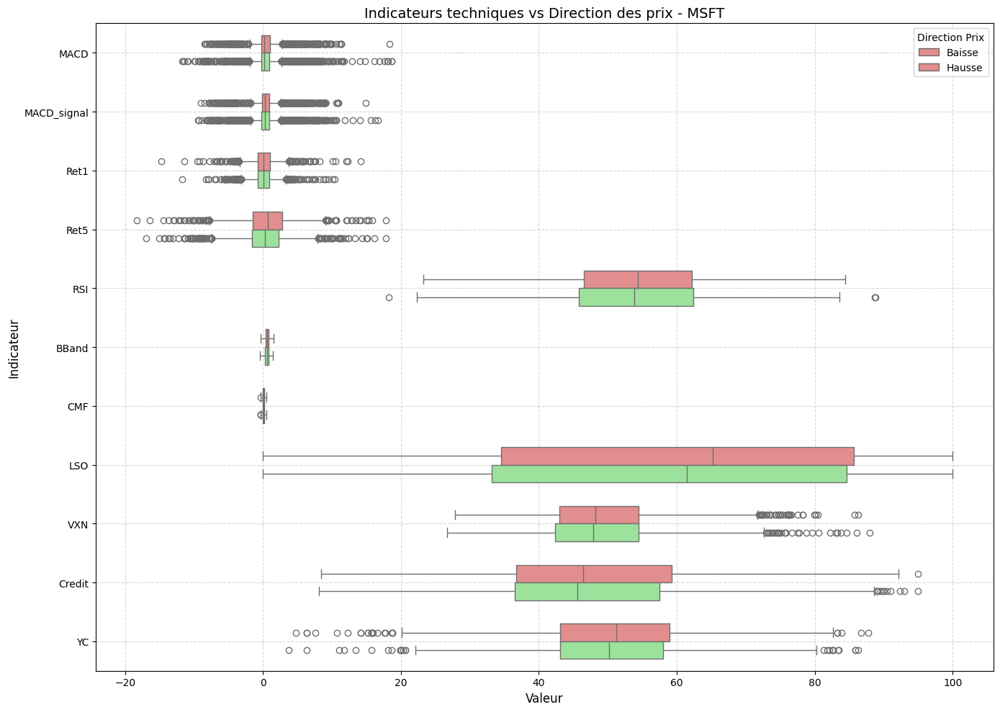


Régression Logistique


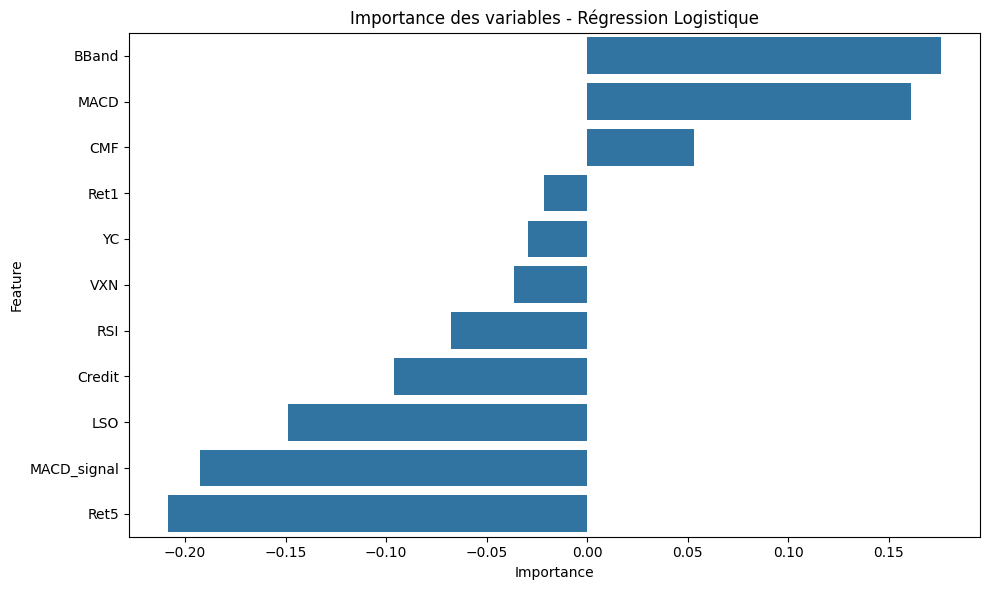

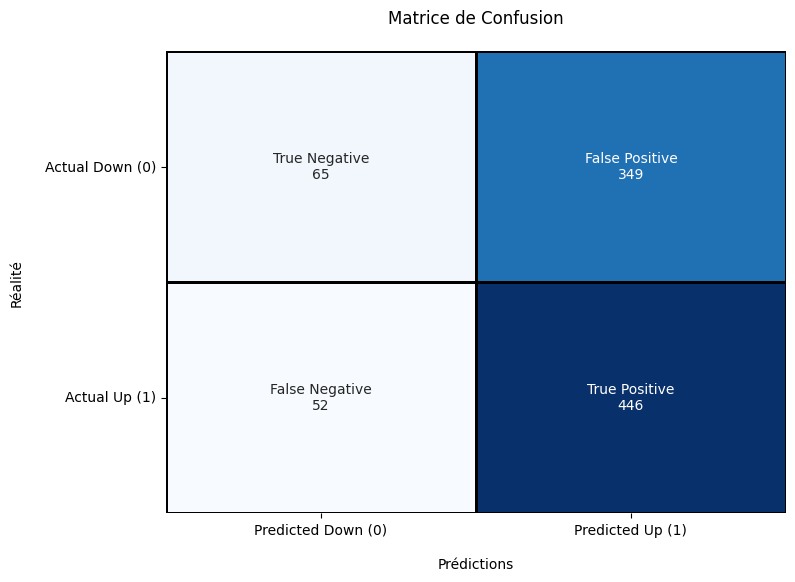


Rapport de classification - Régression Logistique:

              precision    recall  f1-score   support

           0       0.56      0.16      0.24       414
           1       0.56      0.90      0.69       498

    accuracy                           0.56       912
   macro avg       0.56      0.53      0.47       912
weighted avg       0.56      0.56      0.49       912



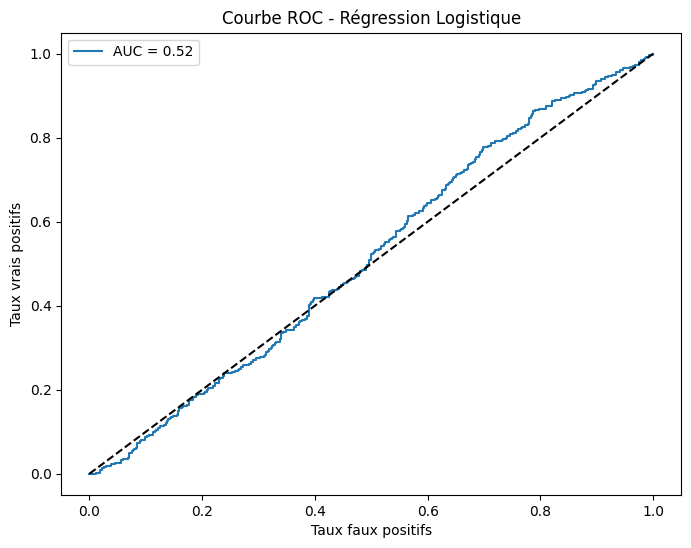


Arbre de Décision


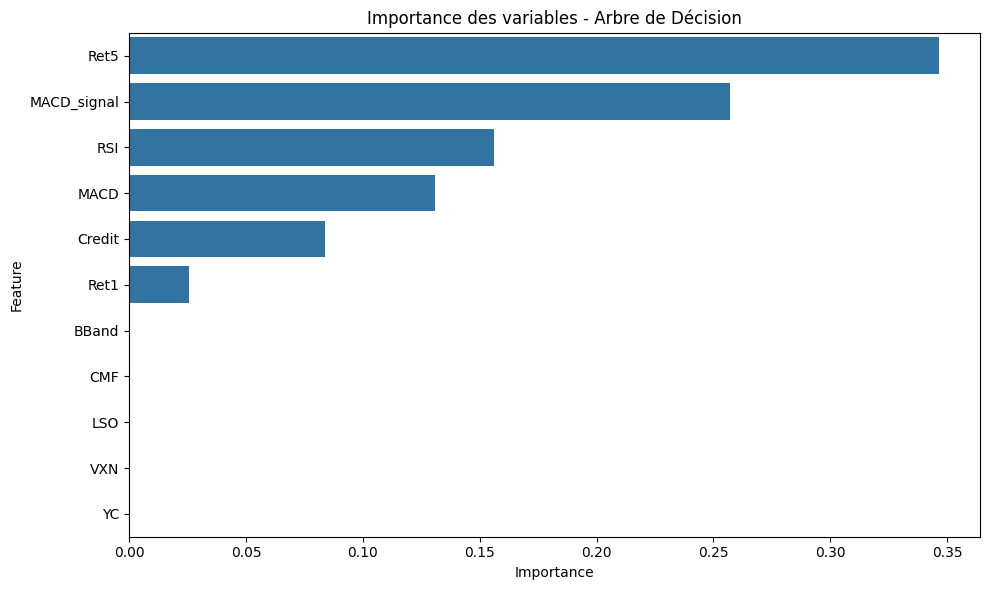

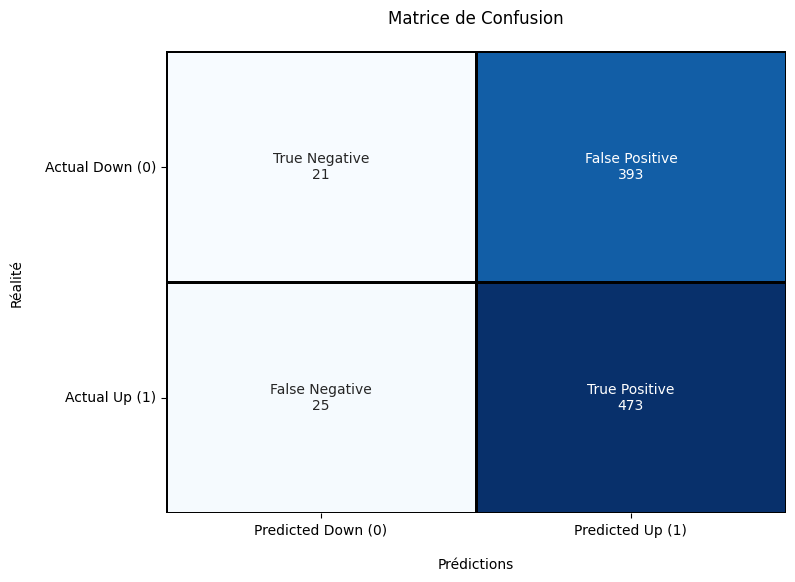


Rapport de classification - Arbre de Décision:

              precision    recall  f1-score   support

           0       0.46      0.05      0.09       414
           1       0.55      0.95      0.69       498

    accuracy                           0.54       912
   macro avg       0.50      0.50      0.39       912
weighted avg       0.51      0.54      0.42       912



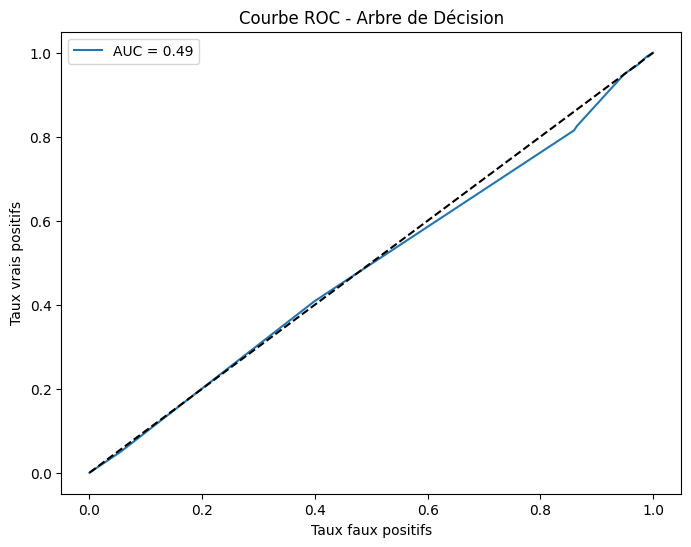

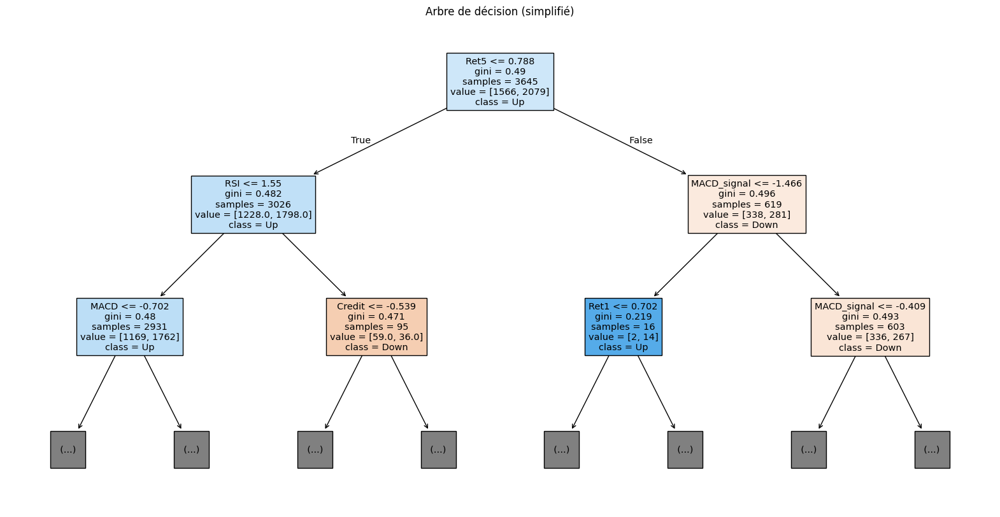


Random Forest


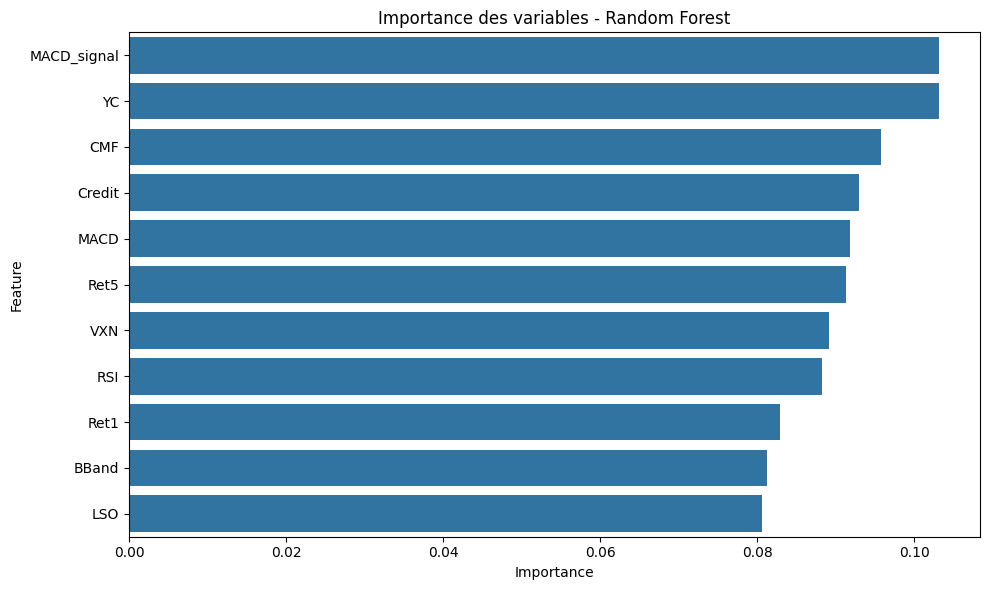

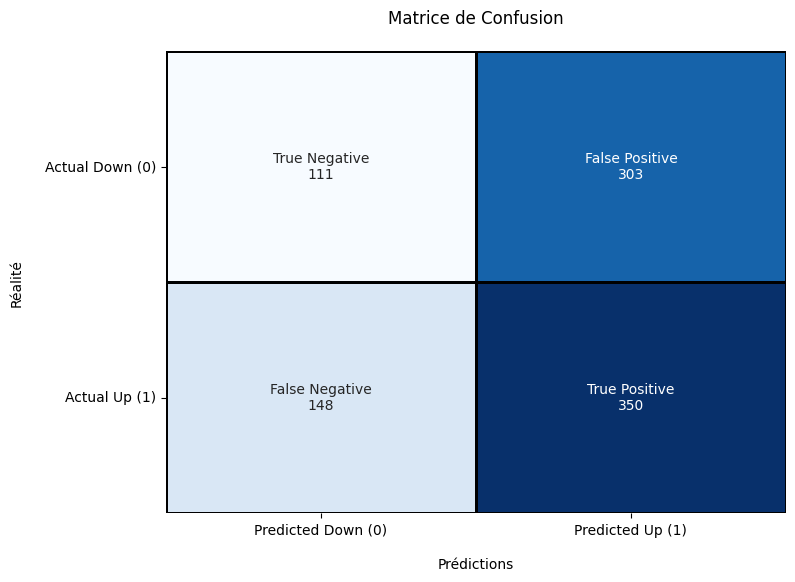


Rapport de classification - Random Forest:

              precision    recall  f1-score   support

           0       0.43      0.27      0.33       414
           1       0.54      0.70      0.61       498

    accuracy                           0.51       912
   macro avg       0.48      0.49      0.47       912
weighted avg       0.49      0.51      0.48       912



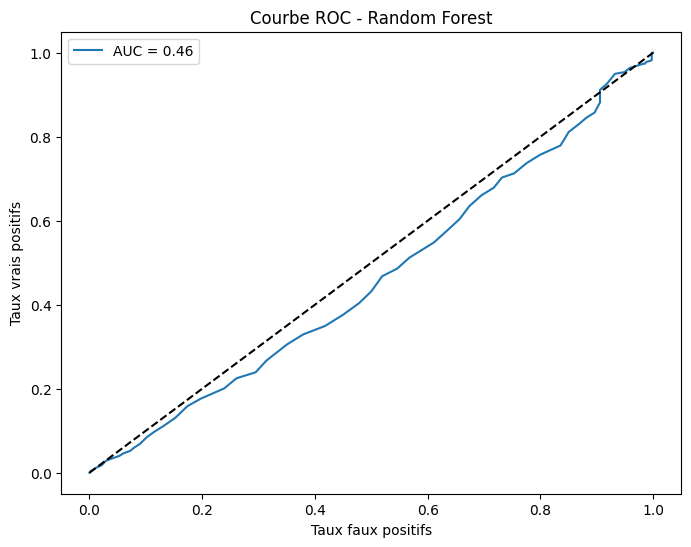


Gradient Boosting
n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 227
max_resources_: 3645
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 16
n_resources: 227
Fitting 3 folds for each of 16 candidates, totalling 48 fits
----------
iter: 1
n_candidates: 8
n_resources: 454
Fitting 3 folds for each of 8 candidates, totalling 24 fits
----------
iter: 2
n_candidates: 4
n_resources: 908
Fitting 3 folds for each of 4 candidates, totalling 12 fits
----------
iter: 3
n_candidates: 2
n_resources: 1816
Fitting 3 folds for each of 2 candidates, totalling 6 fits
----------
iter: 4
n_candidates: 1
n_resources: 3632
Fitting 3 folds for each of 1 candidates, totalling 3 fits

Meilleurs paramètres trouvés:
learning_rate: 0.1
max_depth: 3
min_samples_leaf: 30
n_estimators: 100


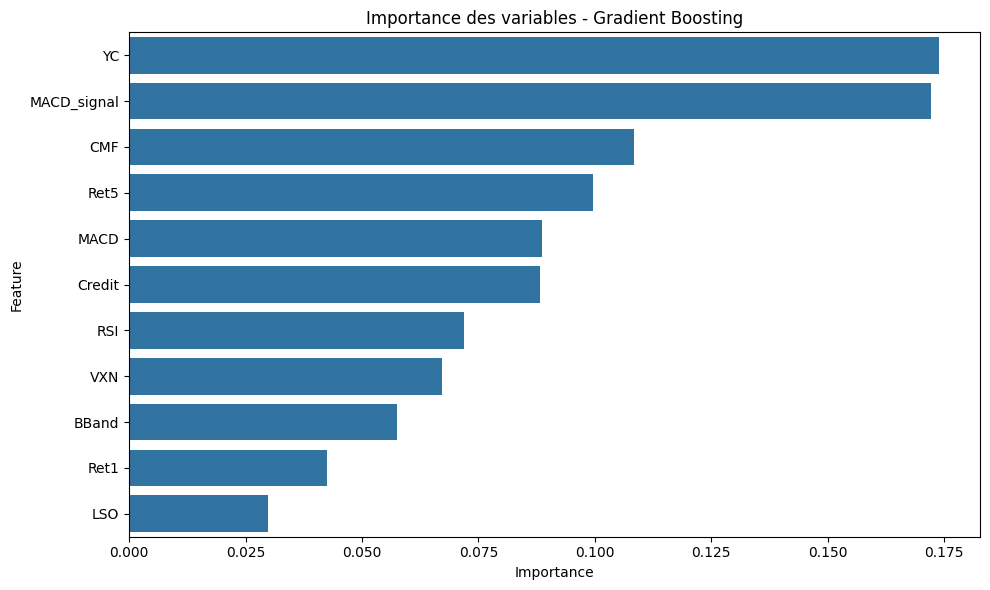

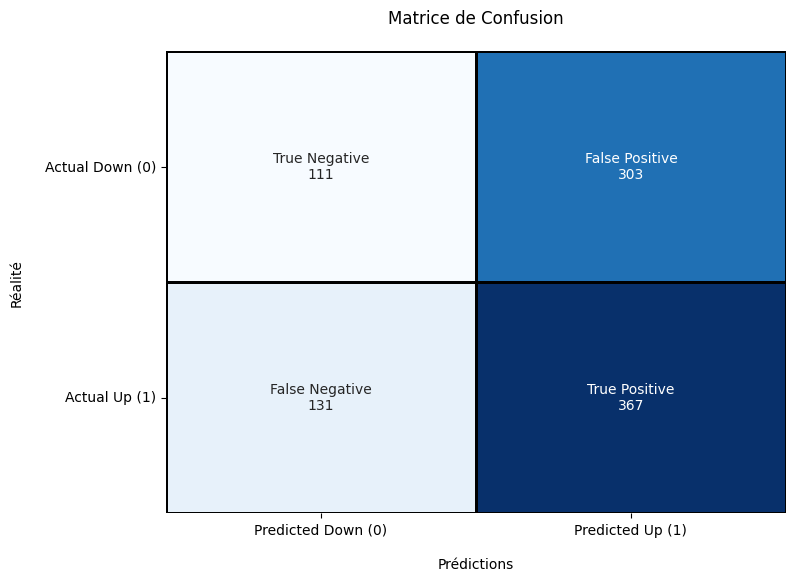


Rapport de classification - Gradient Boosting:

              precision    recall  f1-score   support

           0       0.46      0.27      0.34       414
           1       0.55      0.74      0.63       498

    accuracy                           0.52       912
   macro avg       0.50      0.50      0.48       912
weighted avg       0.51      0.52      0.50       912



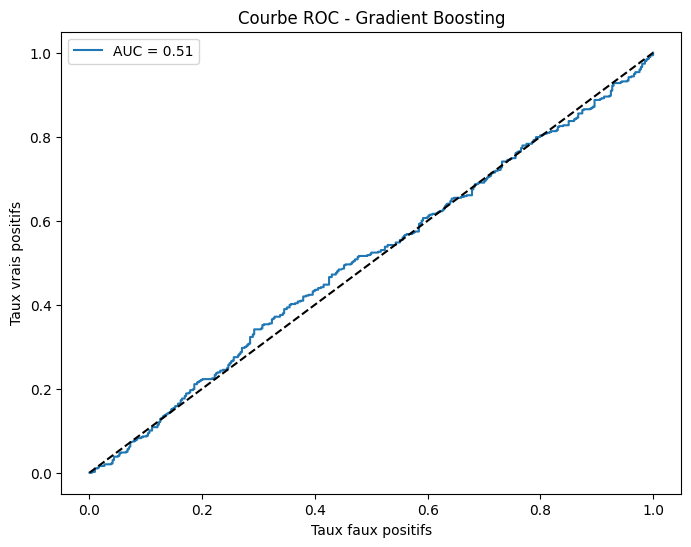

In [24]:
analyze_and_learn_from_ticker(data, fred_data, 'MSFT')

# Questions

## Question 1

### Analyse des indicateurs pour Google


===== ANALYSE DES STRATÉGIES POUR GOOG =====


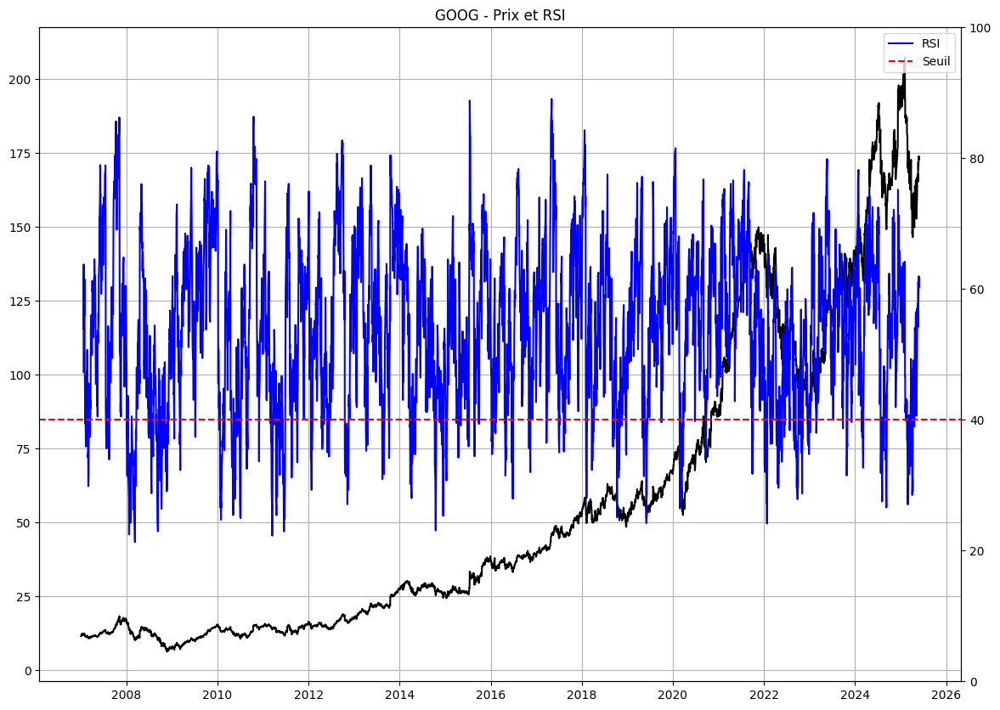


Performance RSI sur GOOG:


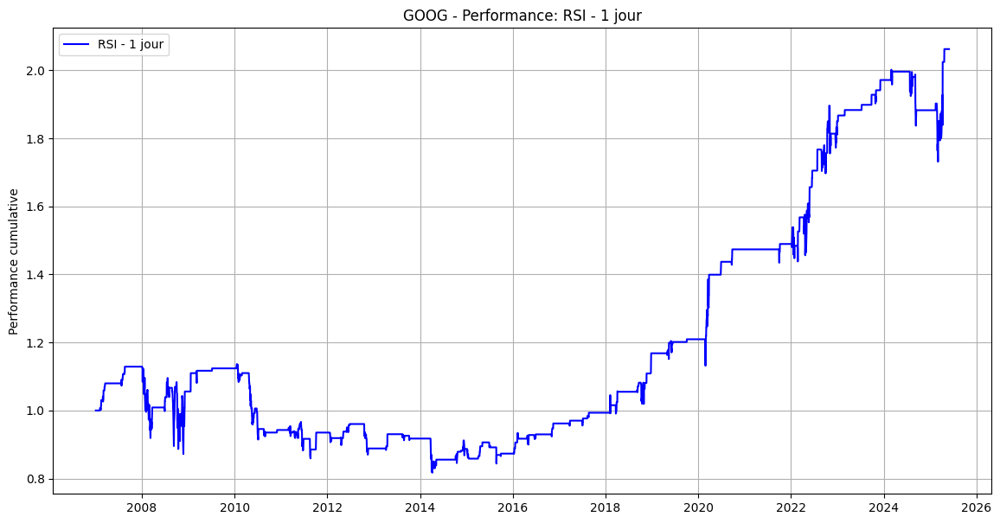

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           1.062217           0.040501               0.122855   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.329665     -0.280722              4594  


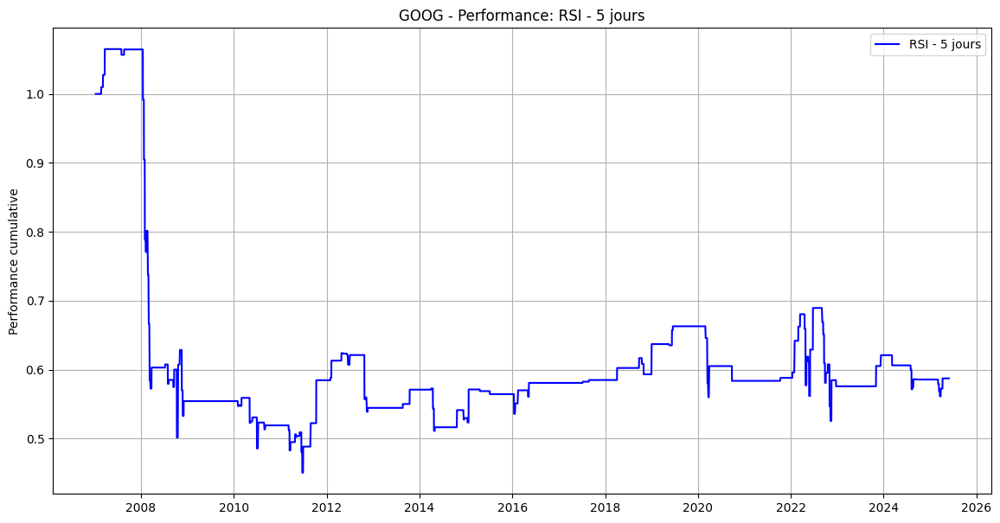

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.412734            -0.0288               0.145702   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.197665     -0.577015               918  


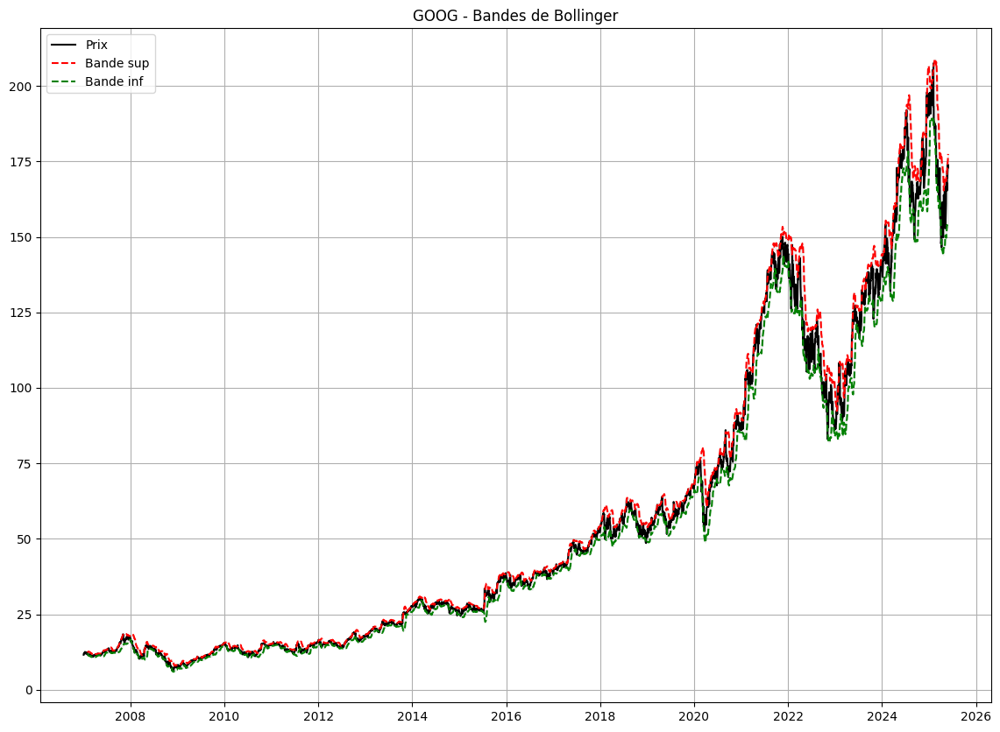


Performance Bollinger sur GOOG:


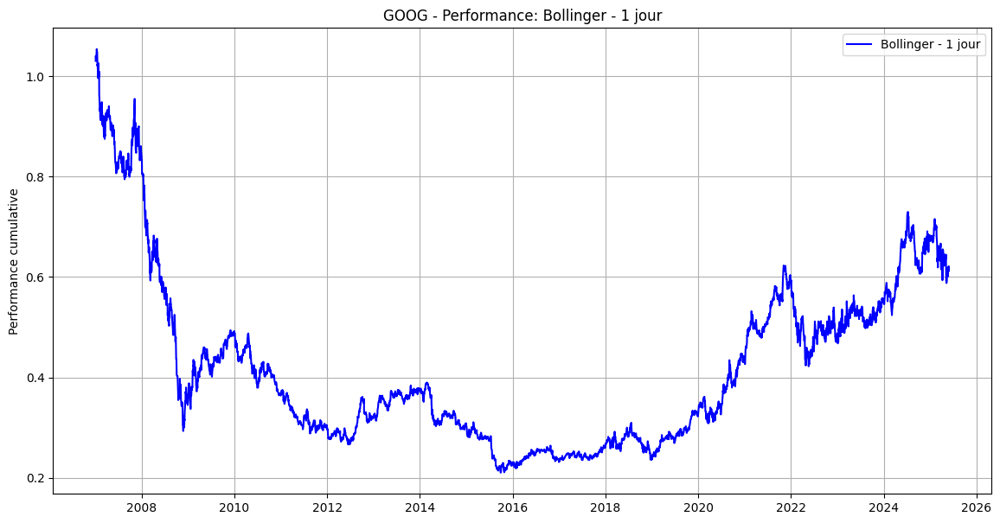

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.387827           -0.02656               0.216824   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.122496     -0.800426              4594  


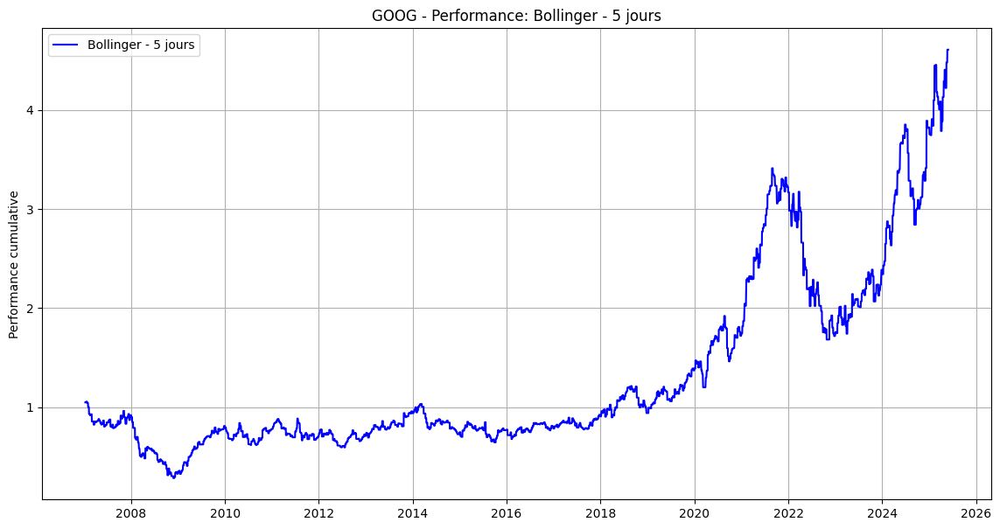

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           3.605996           0.087471               0.297901   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.293625     -0.728332               918  


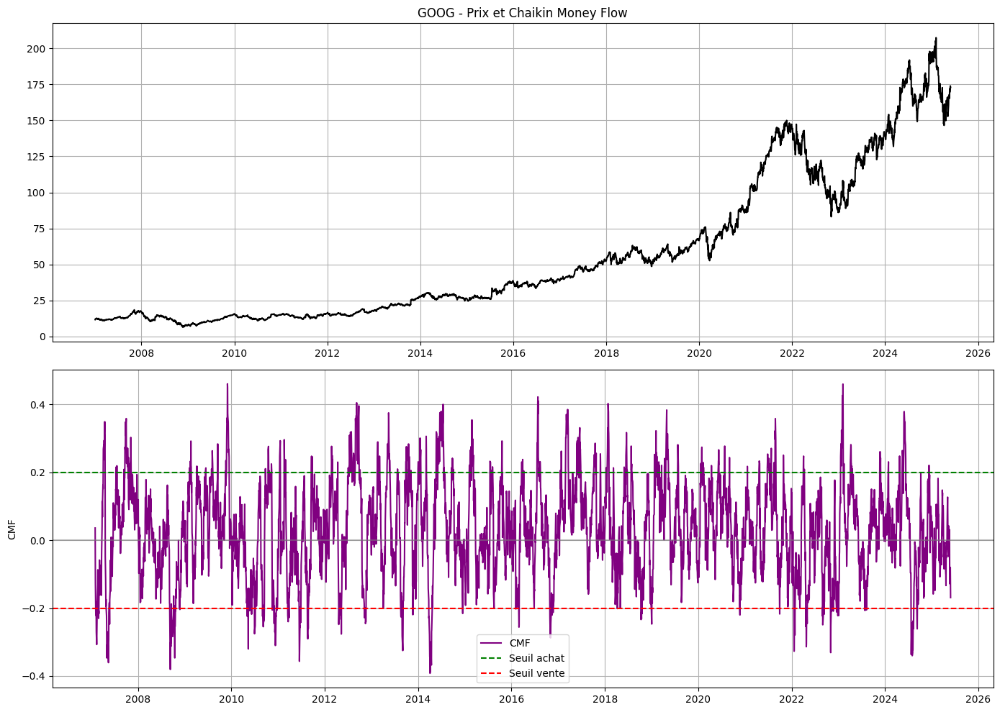


Performance Chaikin MF sur GOOG:


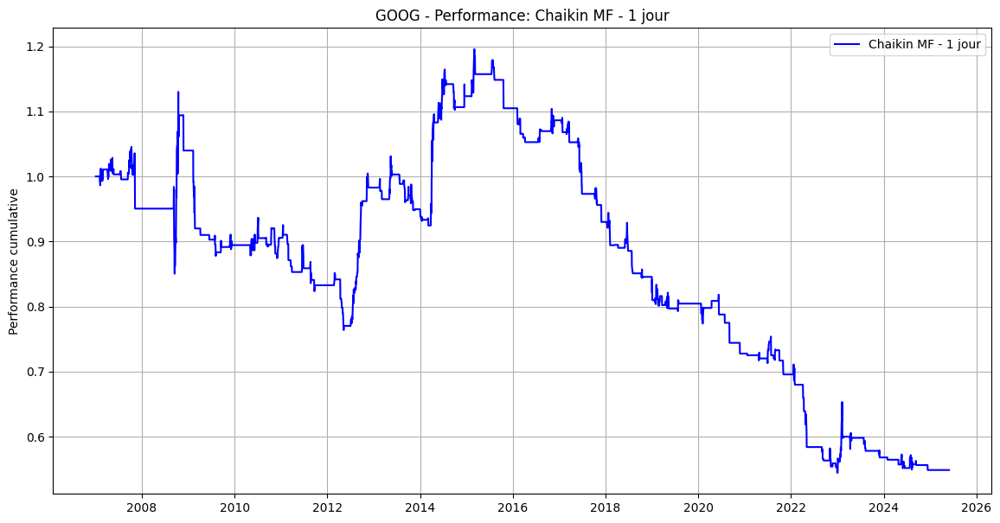

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.451404          -0.032398               0.096416   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.336021     -0.544652              4594  


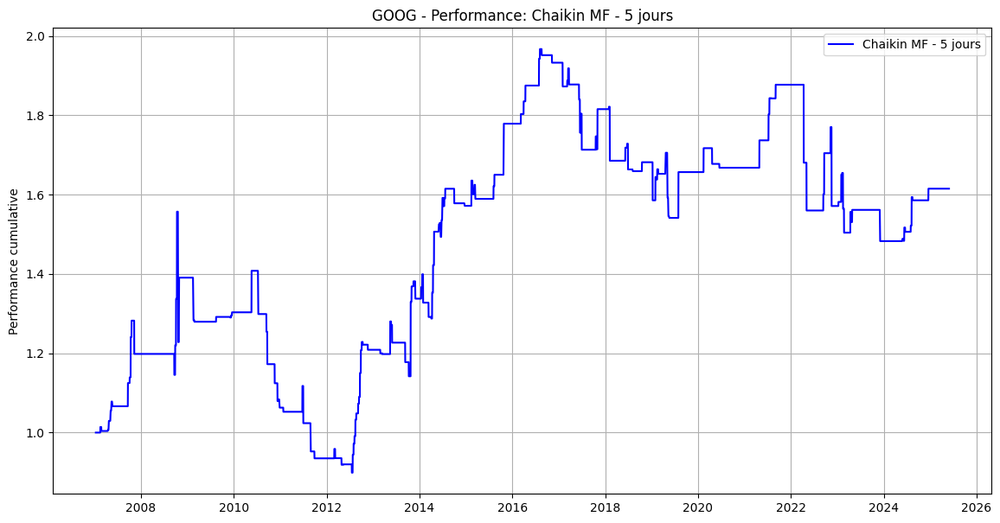

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.615114            0.02667               0.136555   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.195304     -0.422708               918  


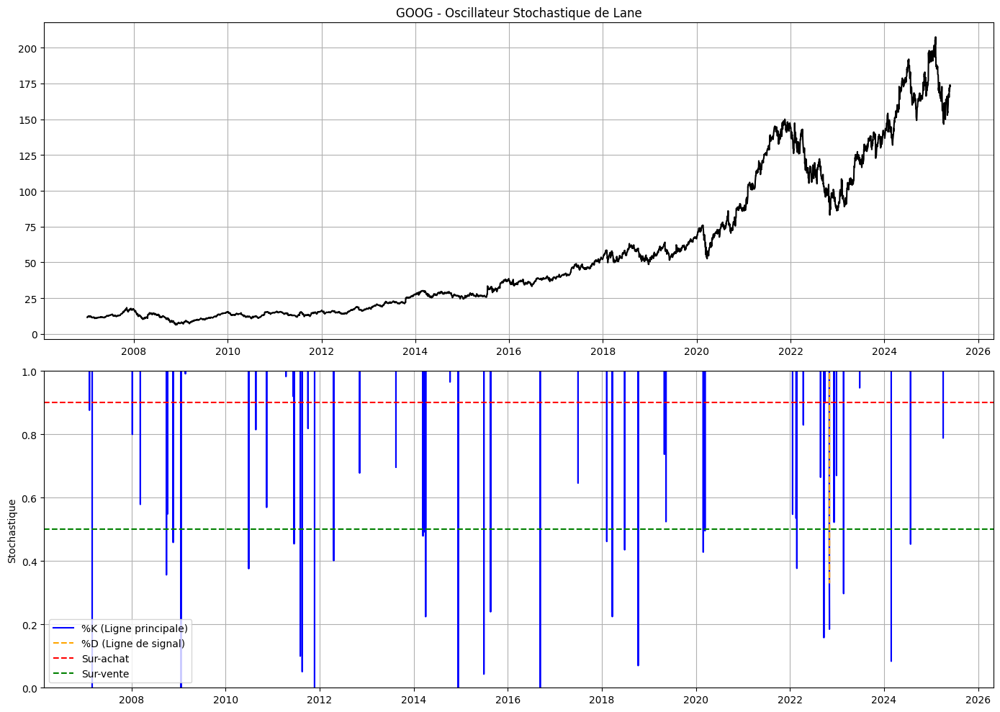


Performance Stochastique sur GOOG:


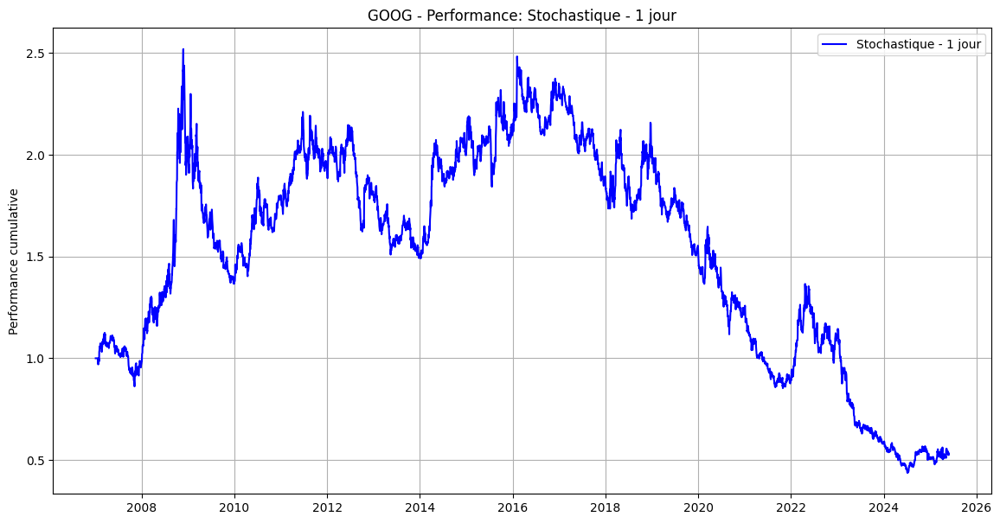

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.467377          -0.033965                0.22767   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.149184     -0.826106              4594  


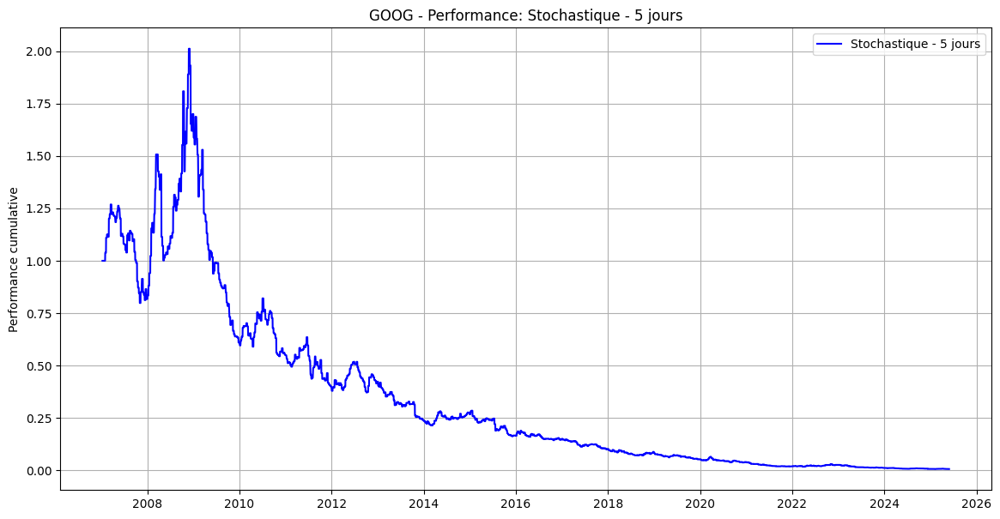

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.993083          -0.238959               0.307735   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.776509     -0.996639               918  


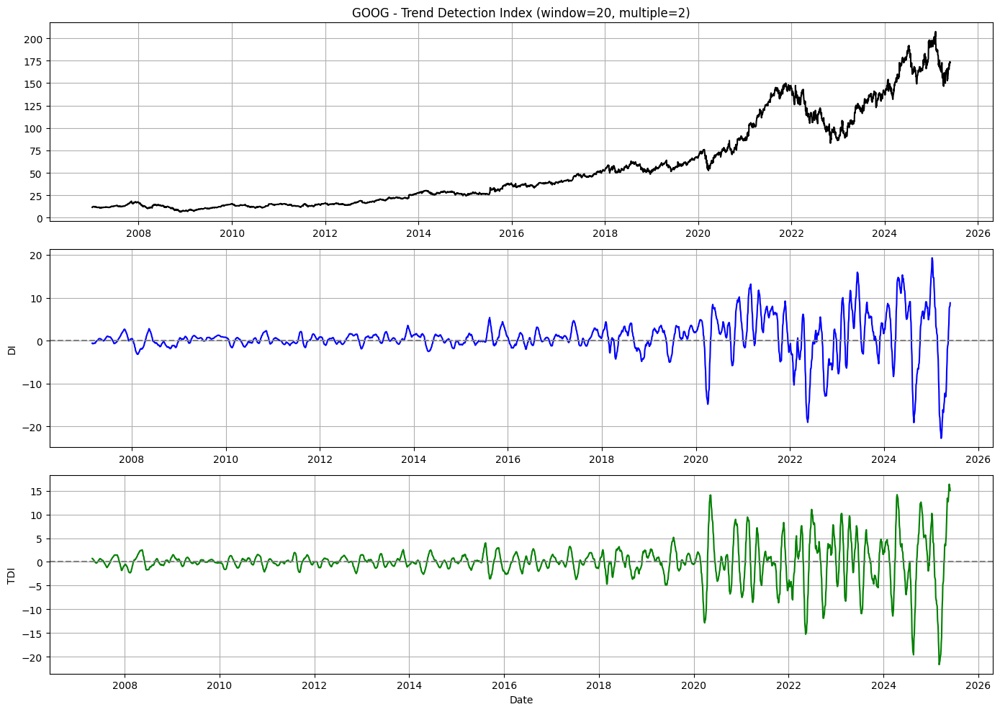


Performance Trend Detection sur GOOG:


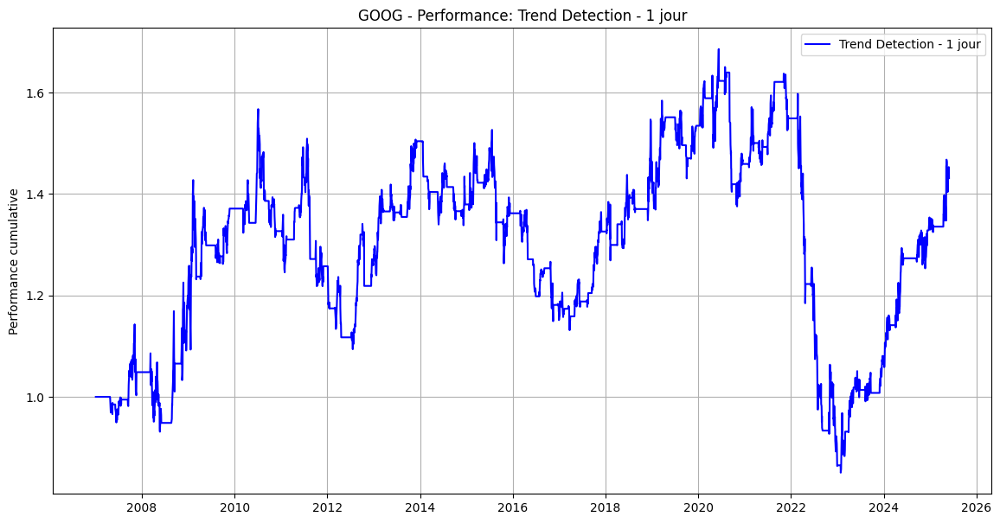

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.431285           0.019864               0.158774   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.125108     -0.495589              4594  


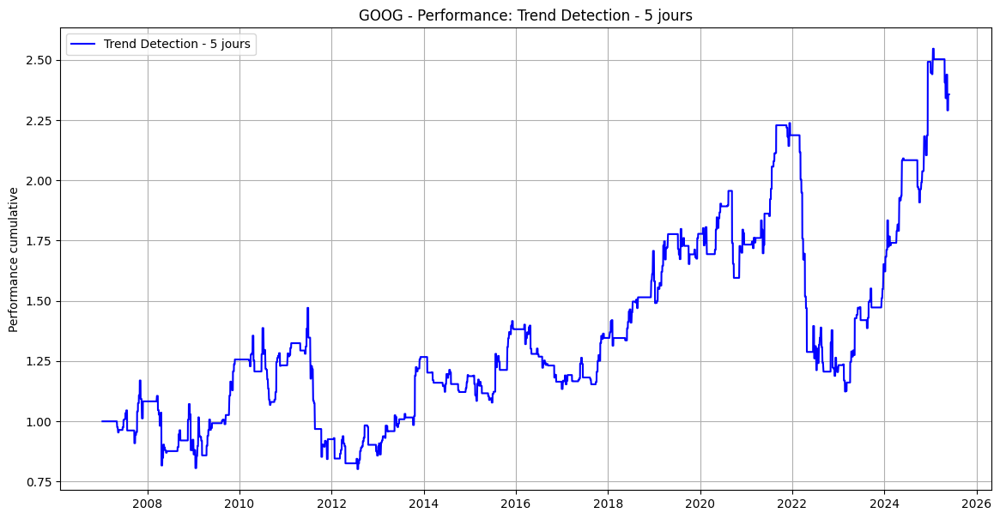

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           1.356813           0.048193               0.219766   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.219293     -0.497793               918  


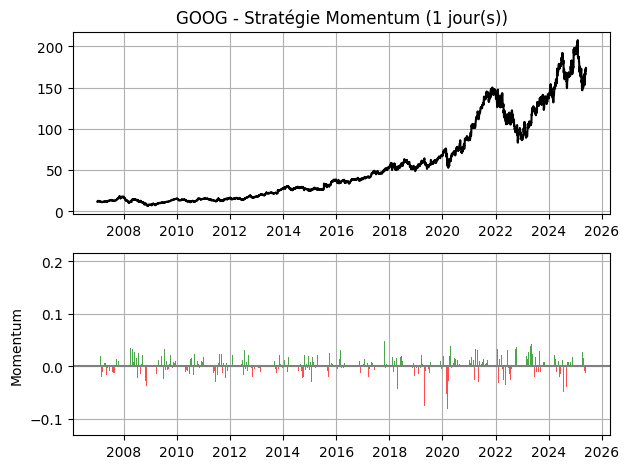


Performance Momentum 1j sur GOOG:


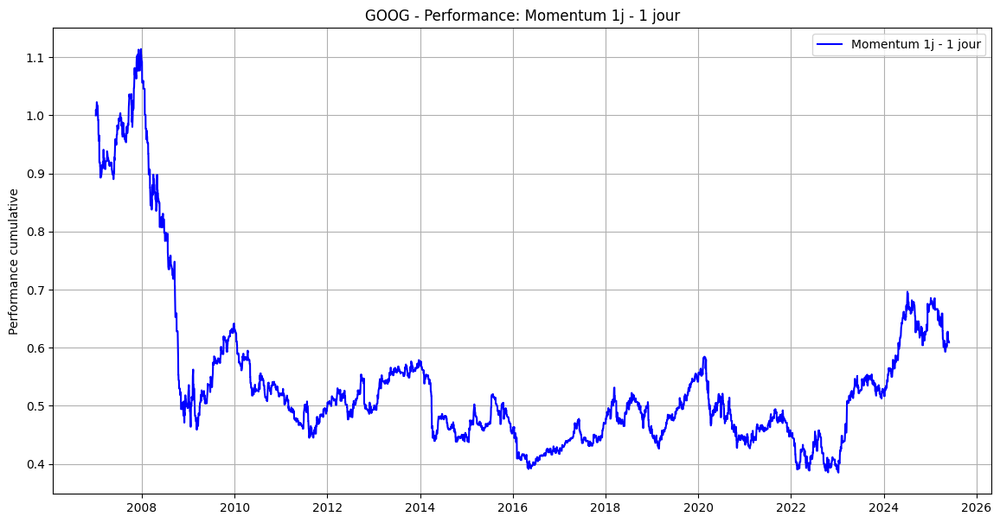

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.390976          -0.026835               0.156723   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.171229     -0.654548              4594  


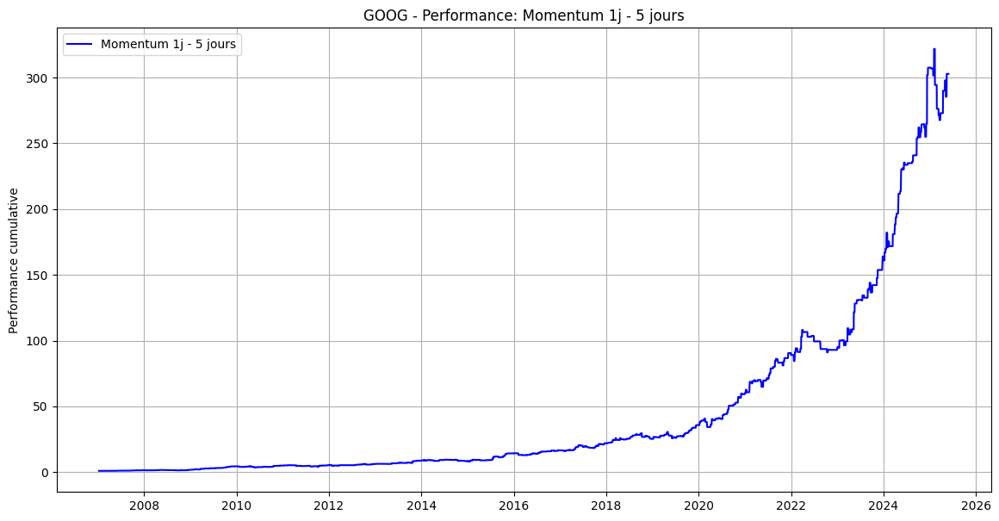

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value         301.783884           0.368419               0.215656   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      1.708361      -0.21391               918  


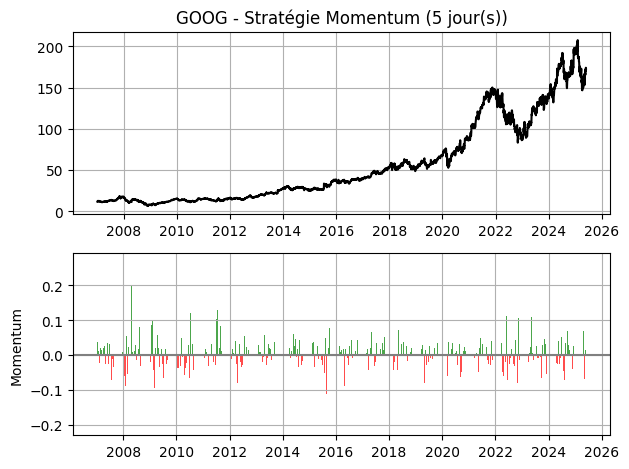


Performance Momentum 5j sur GOOG:


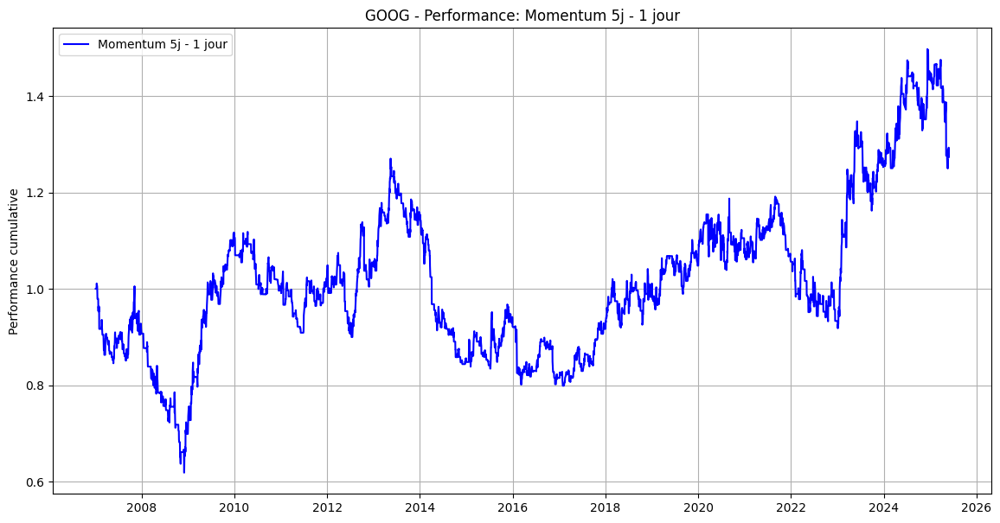

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.273492            0.01335               0.152471   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.087558     -0.388428              4594  


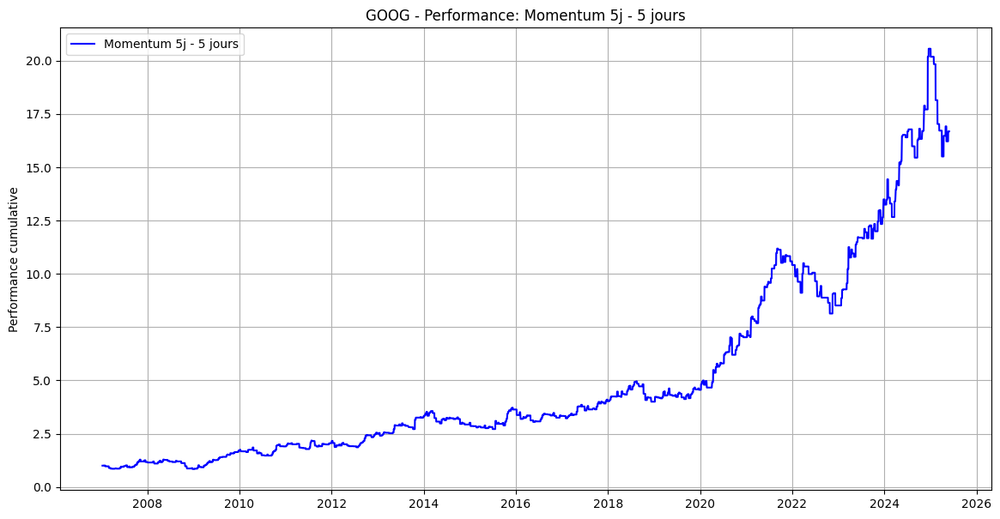

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           15.68488             0.1671               0.215258   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.776276      -0.34686               918  


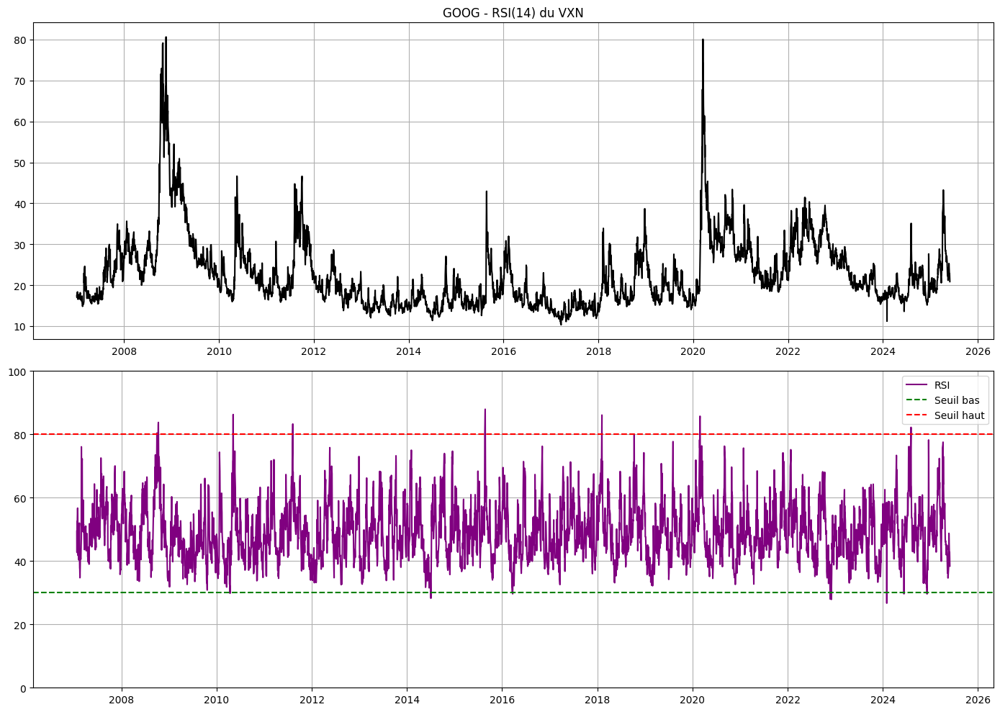


Performance RSI VXN sur GOOG:


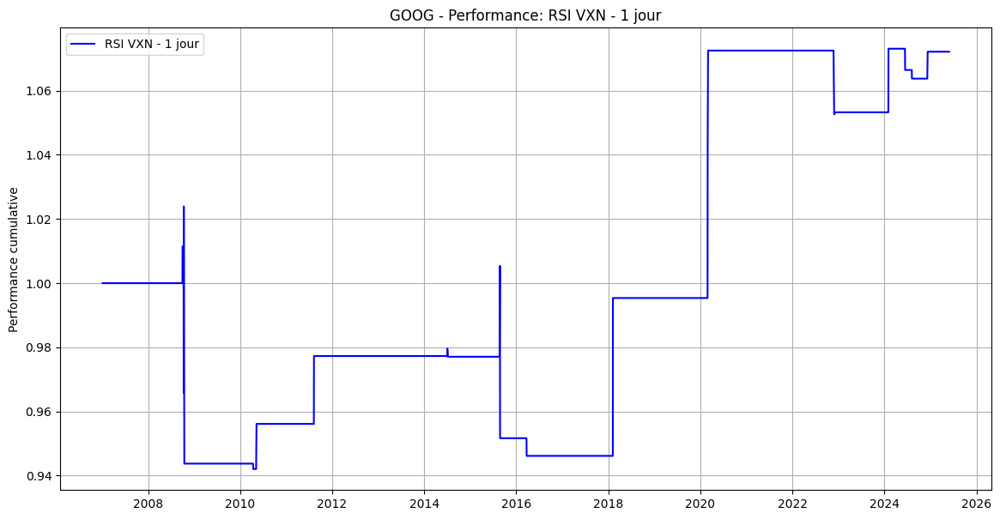

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.072143           0.003828               0.035387   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.108187     -0.079972              4594  


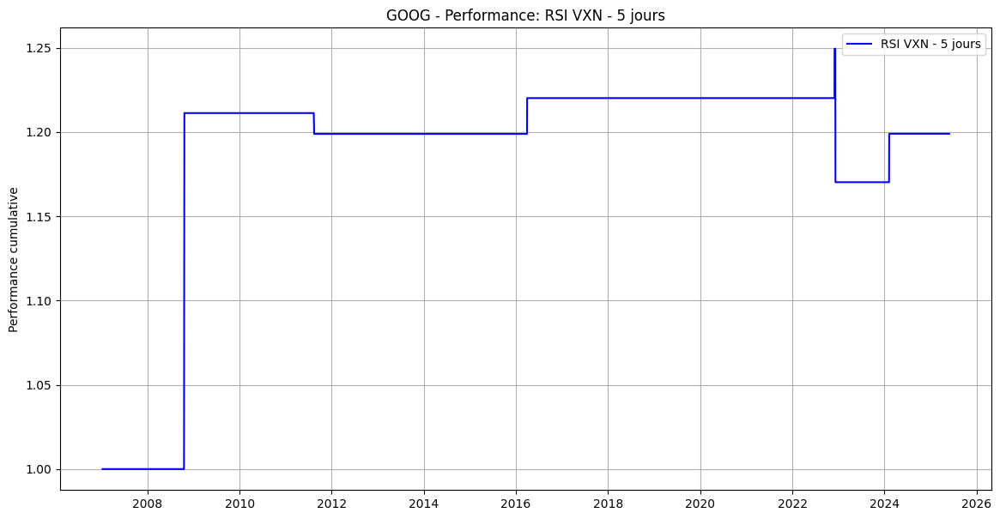

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           0.198983           0.010013                0.05253   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.190615     -0.063399               918  


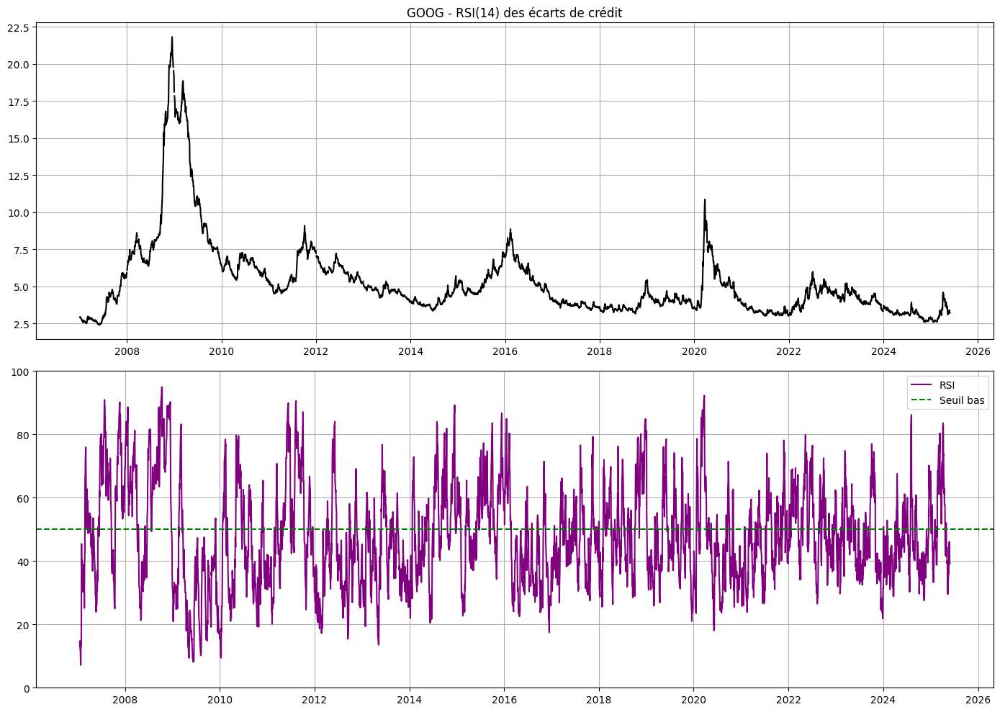


Performance RSI Credit sur GOOG:


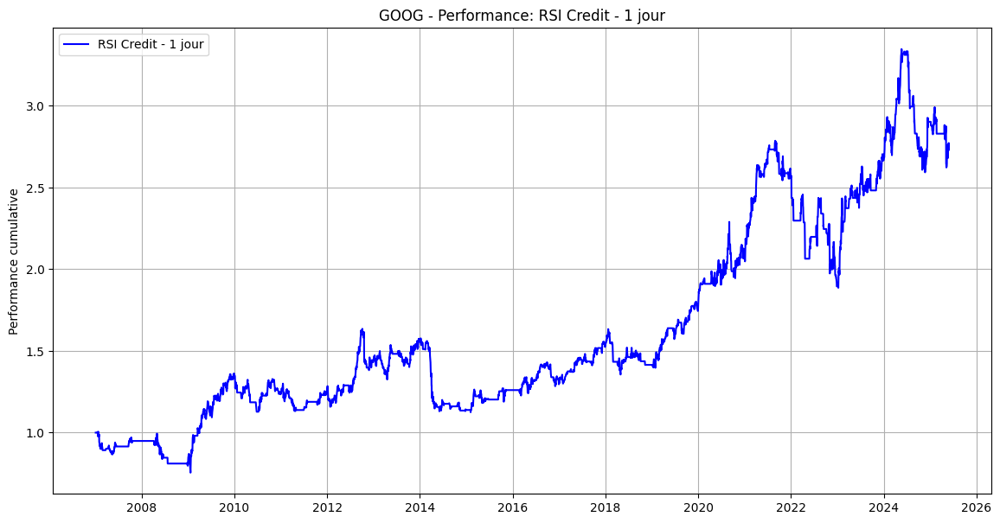

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           1.730975           0.056657               0.149677   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.378526     -0.322966              4594  


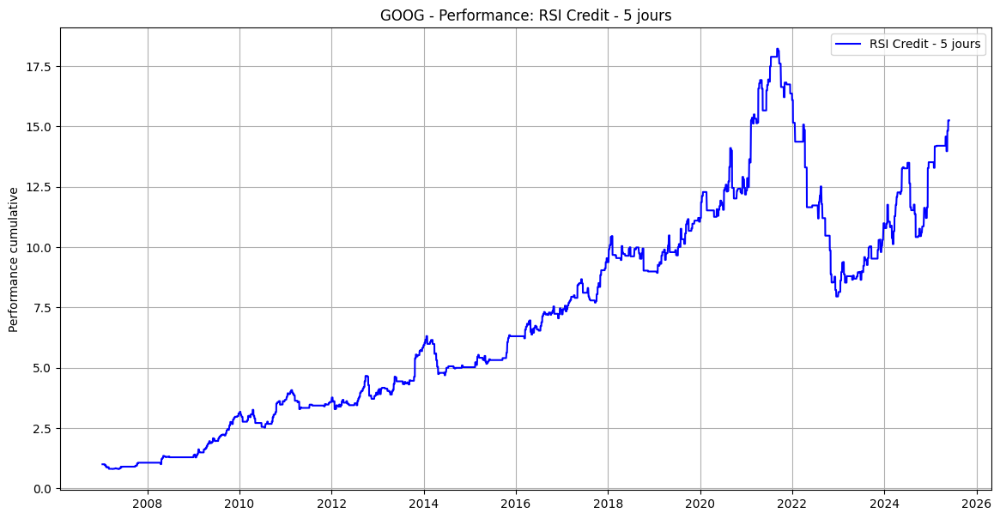

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          14.257155           0.161382                0.20994   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.768704     -0.563599               918  


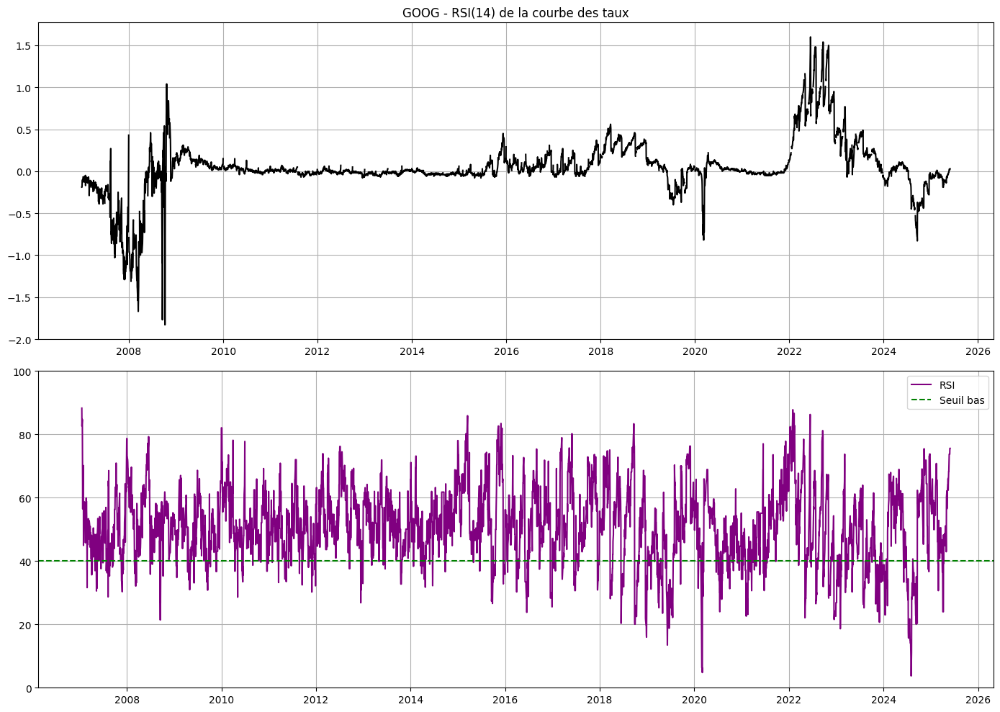


Performance RSI YC sur GOOG:


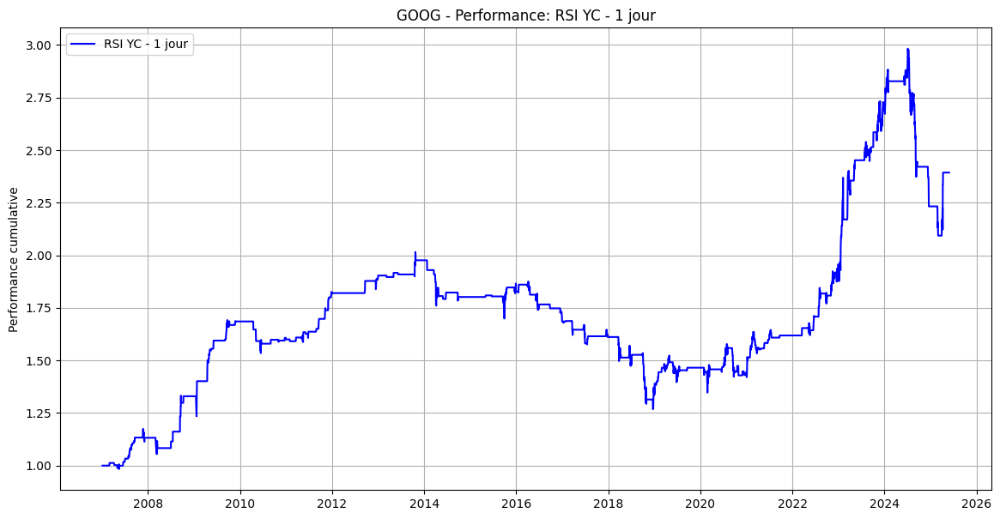

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           1.393133            0.04903               0.102362   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.478987     -0.370742              4594  


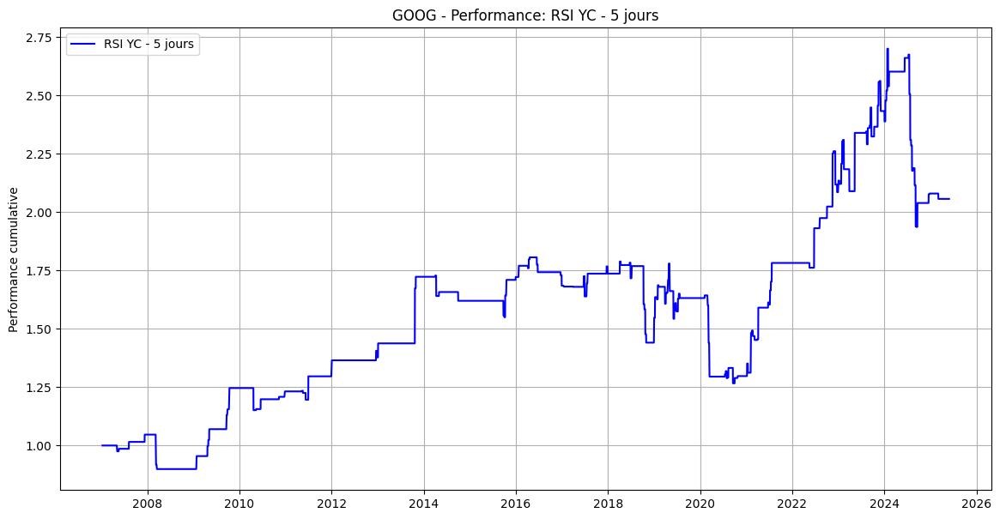

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value           1.057113           0.040396                0.12936   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      0.312273     -0.298915               918  


In [14]:
test_all_strategies(data, fred_data, 'GOOG')

## Question 2

### Comparaison des indicateurs d'Apple et Google

In [15]:
# Décommenter si on veut voir l'ensemble des indicateurs disponibles.
# get_all_strategies().keys()

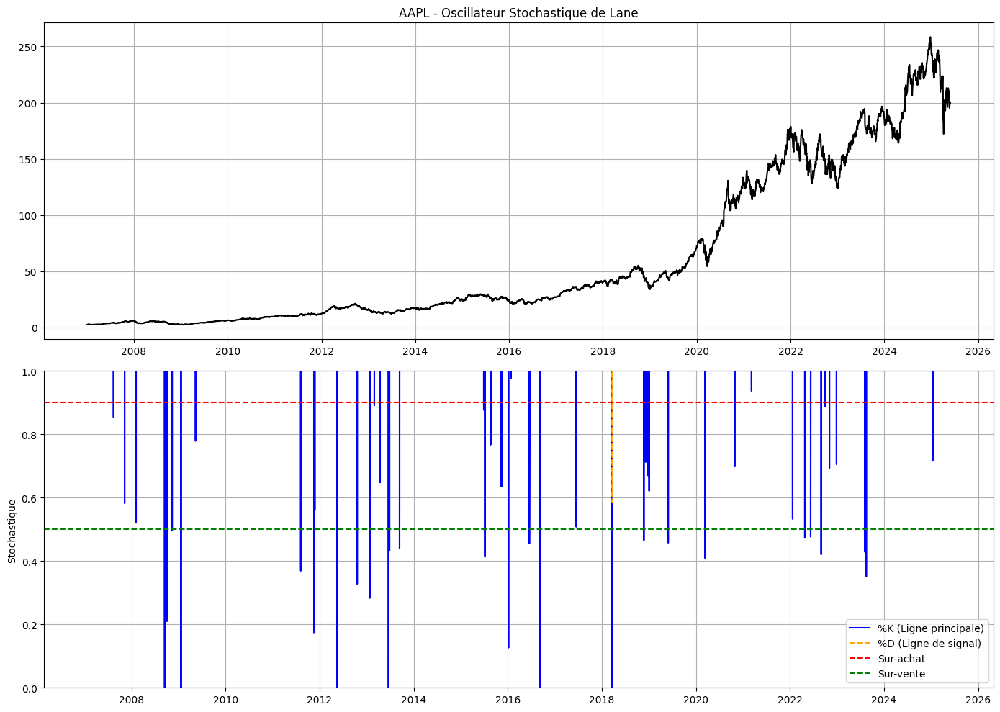


Performance Stochastique sur AAPL:


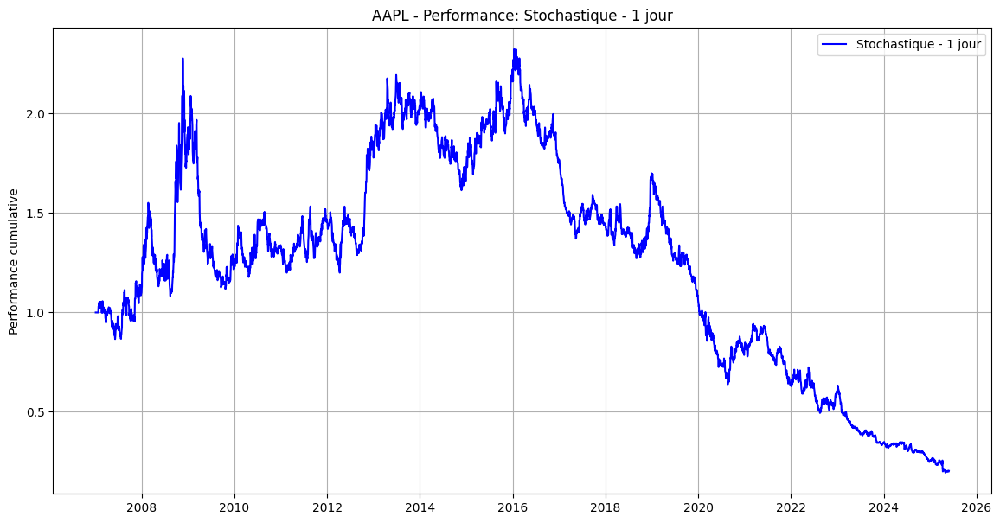

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.796729          -0.083684               0.253076   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.330669     -0.916368              4594  


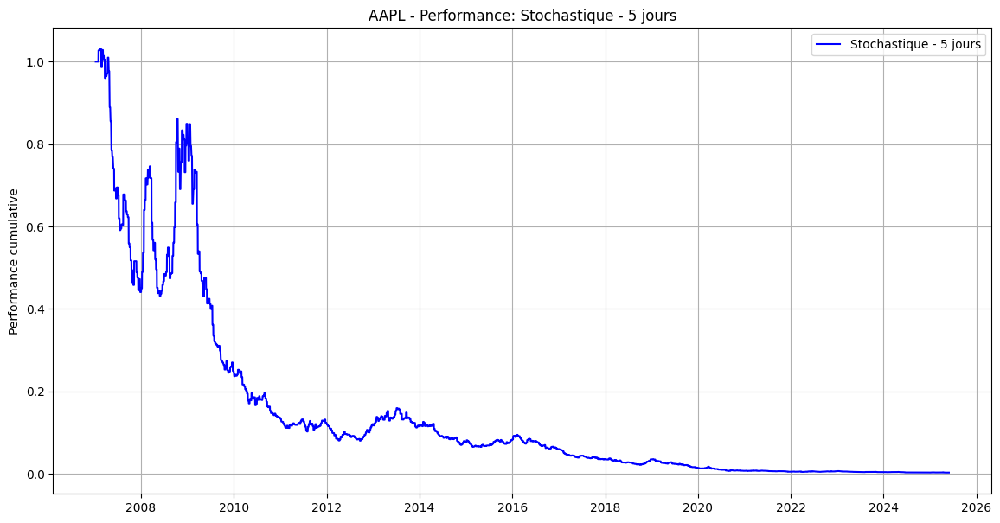

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.997383          -0.278509               0.324508   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value      -0.85825     -0.997571               918  


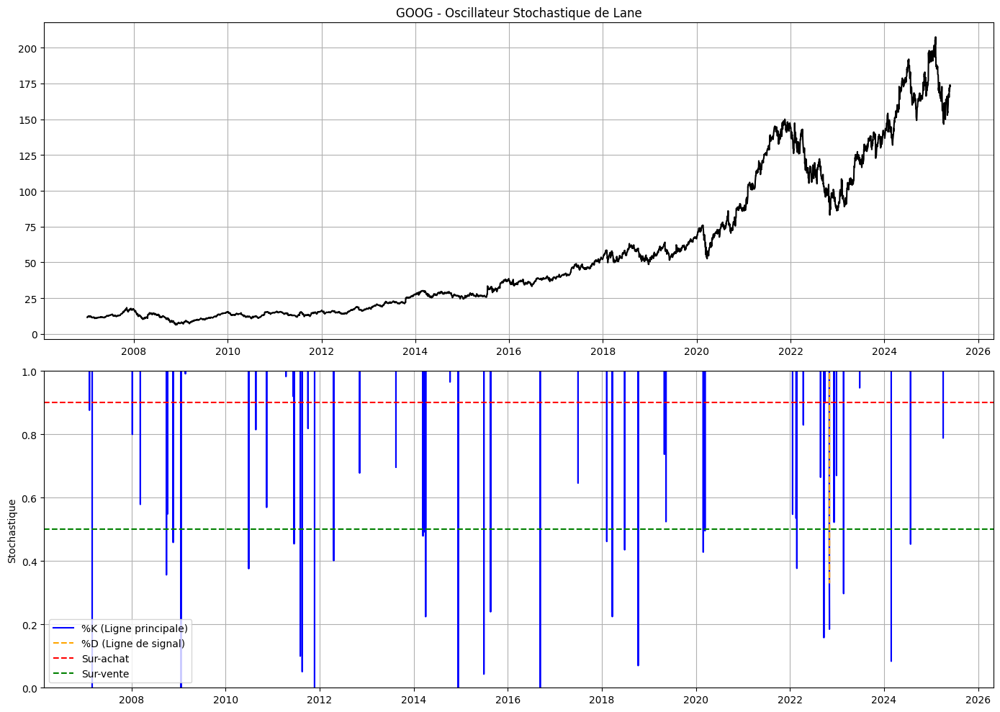


Performance Stochastique sur GOOG:


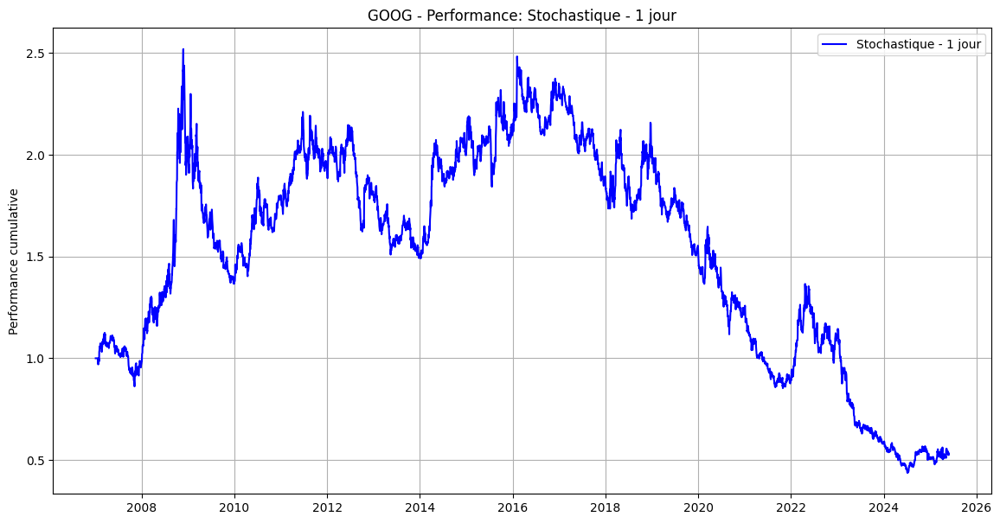

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.467377          -0.033965                0.22767   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.149184     -0.826106              4594  


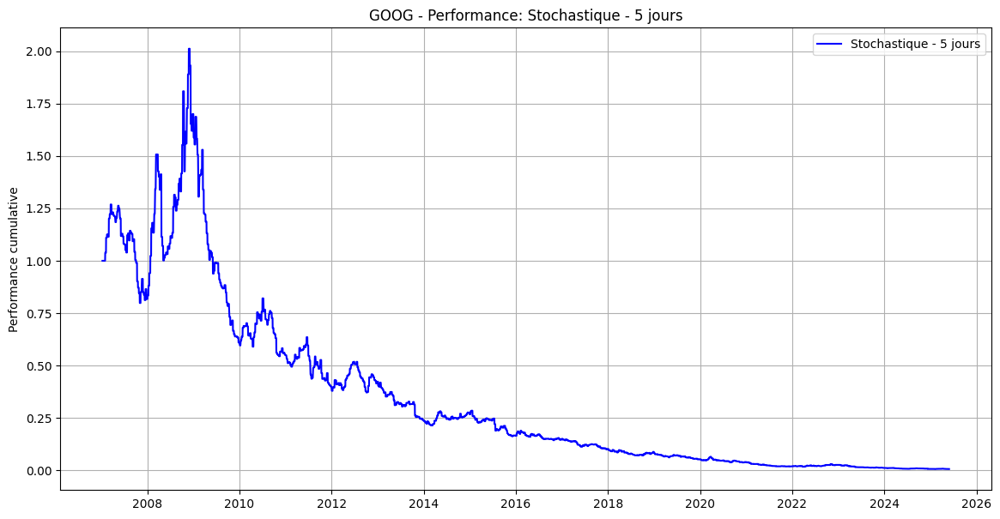

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.993083          -0.238959               0.307735   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.776509     -0.996639               918  


In [16]:
# Pour comparer d'autres indicateurs, simplement changer le dernier paramètre pour l'indicateur désiré (Voir cellule ci-haut).
compare_strategies(data, fred_data, ['AAPL', 'GOOG'], 'Stochastique')

### Constats par indicateur

1. RSI (Relative Strength Index)

    GOOG (1 jour) surperforme AAPL : Sharpe Ratio de 0,33 contre 0,23 pour AAPL.

    Aucune stratégie RSI sur 5 jours n’est rentable (Sharpe négatif pour les deux titres).

    Conclusion : RSI semble plus efficace sur des fenêtres très courtes (1 jour), et légèrement meilleur sur GOOG.

2. Bollinger Bands

    AAPL (5 jours) domine largement : Sharpe de 0,39 et rendement cumulé de +7,4 %, bien supérieur à GOOG (Sharpe 0,28, +3,3 %).

    À 1 jour, performances négatives pour les deux titres.

    Conclusion : Légèrement rentable sur AAPL à 5 jours, mais aucun signal réellement robuste.

3. Chaikin Money Flow

    À 5 jours, AAPL atteint un Sharpe de 0,58, modeste mais le plus élevé dans ce cas. GOOG est plus faible (0,19).
    
    À 1 jour, performances négatives pour les deux titres.
    
    Conclusion : Performances acceptables à 5 jours sur AAPL, mais insuffisantes pour justifier une mise en œuvre seule.

4. Oscillateur Stochastique

    Stratégie très peu performante : pertes massives sur les deux titres à toutes les périodes.

    Sharpe négatif, drawdowns extrêmes (près de -99 % à 5 jours).

    Conclusion : À éviter absolument, peu importe le titre ou la période.

5. Trend Direction Index

    À 5 jours, AAPL performe bien (Sharpe 0,40) contre 0,23 pour GOOG.

    À 1 jour, performance très modeste (Sharpe autour de 0).

    Conclusion : L’indicateur fonctionne mieux à 5 jours, surtout sur AAPL.

6. Momentum (1j / 5j)

    Momentum 1j sur AAPL à 5 jours : très forte performance (Sharpe 2,01, rendement cumulé 1046 %). C'est à se demander si c'est réaliste

    GOOG aussi rentable pour les même paramètres (Sharpe 1,7, rendement cumulé de 289%).

    Conclusion : Une des meilleures stratégies testées, surtout sur AAPL 1j à 5 jours.

7. RSI VXN (Volatilité Nasdaq)

    Faible volatilité avec Sharpe modérés sur AAPL (0,30 à 1 jour, 0,32 à 5 jours).

    GOOG encore plus faible.

    Conclusion : Stratégie très stable, mais les Sharpe restent trop bas.

8. RSI Credit

    Bons résultats sur AAPL : Sharpe 1,06 à 5 jours, rendement cumulé +48 %.

    GOOG aussi performant (Sharpe 0,75 à 5 jours).

    Conclusion : Une stratégie robuste pour les deux titres, surtout en trading sur 5 jours.

9. RSI Yield Curve

    AAPL affiche un Sharpe de 0,83 à 1 jour, légèrement inférieur à 1, mais remarquable compte tenu de la faible volatilité.

    GOOG est stable autour de 0,48 à 5 jours.

    Conclusion : Stratégie fiable mais pas exceptionnelle.

### Tendances générales

AAPL surperforme GOOG dans la majorité des stratégies, surtout à 5 jours.

Les stratégies sont en général plus efficaces sur 5 jours, avec de meilleurs Sharpe Ratios et des rendements plus élevés.

L'oscillateur stochastique est la seule stratégie systématiquement perdante.

Les stratégies les plus prometteuses (car dépassent un Sharpe de 1 dans certains cas) sont :

    Momentum 1j à 5 jours

    RSI Credit 5 jours

### Constat général

Le trading quantitatif sur 1 et 5 jours pour la plupart des indicateurs utilisés a de piètres performances, surtout considérant qu'il s'agit de titres qui ont connus des croissances très élevées entre 2007 et aujourd'hui (BigTech). Il est donc mieux d'acheter et conserver les titres que d'utiliser ces stratégies.

## Question 3

### Règle de trading pour l'indicateur Williams

***Inspiré de: https://chartschool.stockcharts.com/table-of-contents/technical-indicators-and-overlays/technical-indicators/ultimate-oscillator***

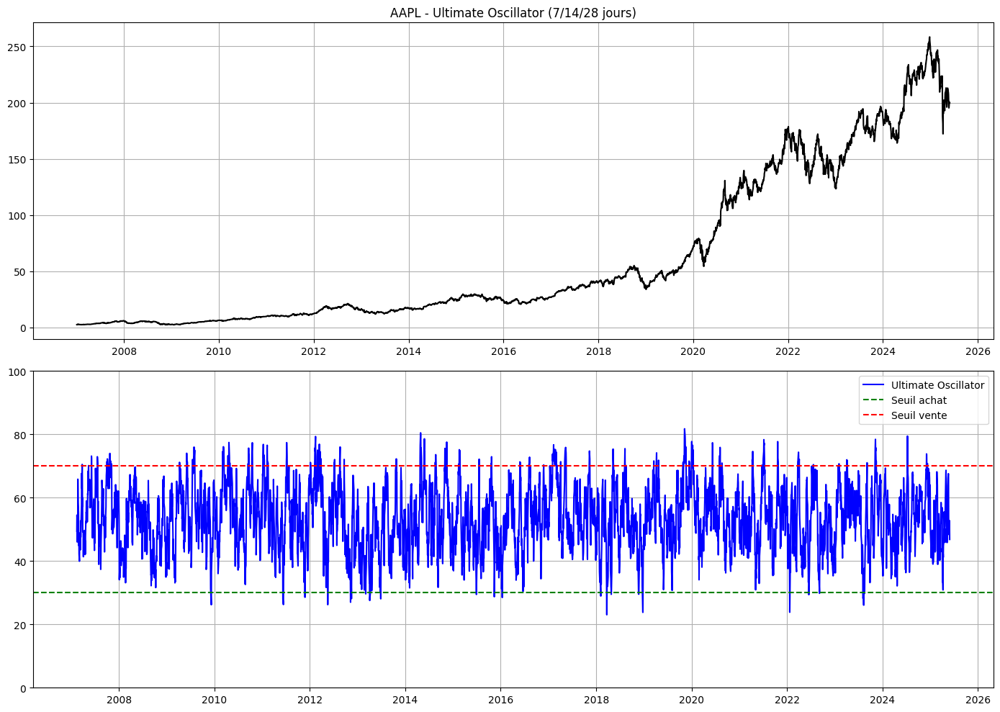


Performance Ultimate Oscillator sur AAPL:


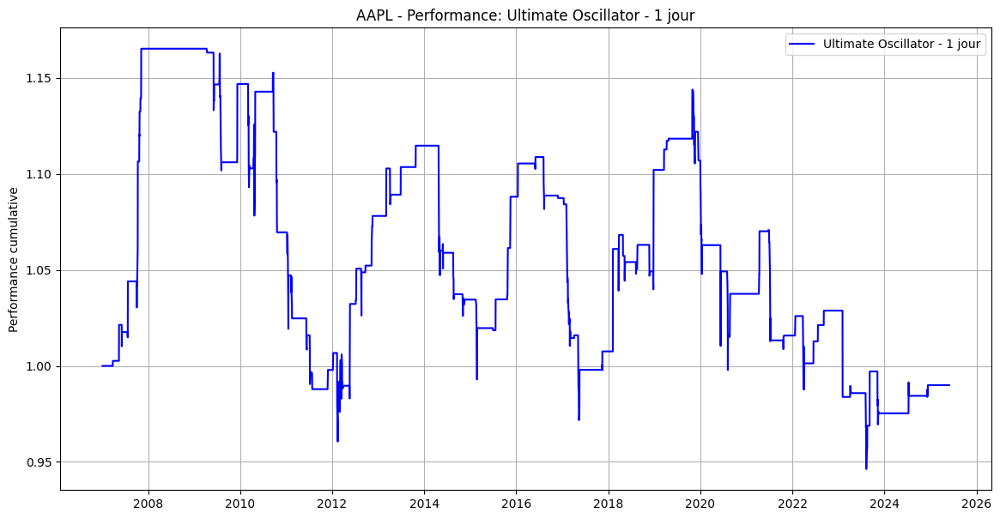

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.010019          -0.000552               0.055591   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.009934     -0.187899              4594  


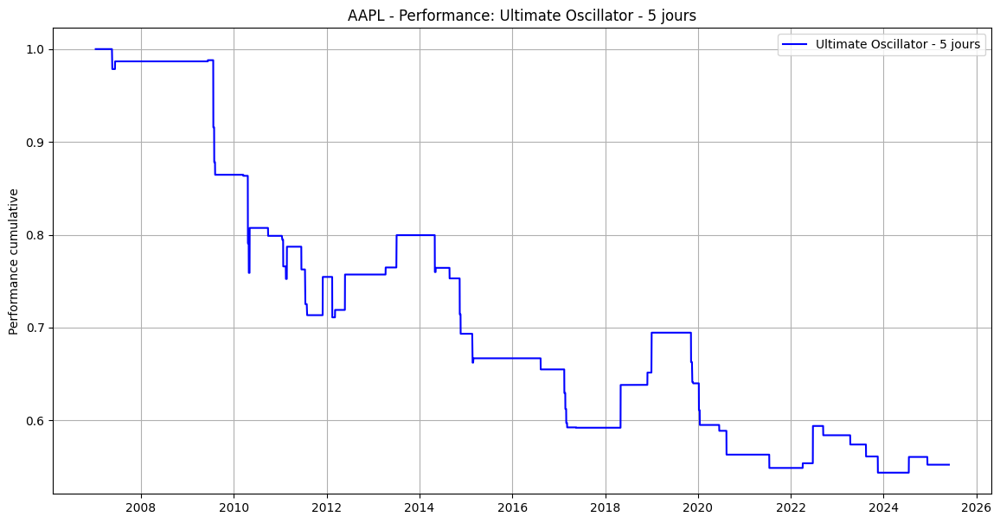

       Cumulative Return  Annualized Return  Annualized Volatility  \
Value          -0.447782          -0.032076               0.065913   

       Sharpe Ratio  Max Drawdown  Number of Trades  
Value     -0.486638     -0.456366               918  


In [17]:
def ultimate_oscillator_strategy(data, stock, n=[7, 14, 28], wts=[4, 2, 1], buy_threshold=30, sell_threshold=70):
    """
    Implémente la stratégie Ultimate Oscillator de Larry Williams.

    Args:
        data (pd.DataFrame): DataFrame contenant les données OHLC
        stock (str): Nom du stock analysé
        n (list): Périodes pour les 3 moyennes (par défaut [7, 14, 28])
        wts (list): Poids pour chaque moyenne (par défaut [4, 2, 1])
        buy_threshold (float): Seuil d'achat (par défaut 30)
        sell_threshold (float): Seuil de vente (par défaut 70)

    Returns:
        pd.DataFrame: DataFrame enrichi avec les signaux de trading
    """
    # Calcul du Ultimate Oscillator
    high = data['High']
    low = data['Low']
    close = data['Close']

    # Calcul des Buying Pressure (BP) et True Range (TR)
    bp = close - np.minimum(low, close.shift(1))
    tr = np.maximum(high, close.shift(1)) - np.minimum(low, close.shift(1))

    # Calcul des moyennes pondérées
    avg1 = bp.rolling(n[0]).sum() / tr.rolling(n[0]).sum()
    avg2 = bp.rolling(n[1]).sum() / tr.rolling(n[1]).sum()
    avg3 = bp.rolling(n[2]).sum() / tr.rolling(n[2]).sum()

    # Calcul de l'Ultimate Oscillator
    data['ult_osc'] = 100 * ((wts[0] * avg1) + (wts[1] * avg2) + (wts[2] * avg3)) / sum(wts)

    # Génération des signaux
    data['signal'] = 0  # Par défaut neutre
    data.loc[data['ult_osc'] < buy_threshold, 'signal'] = 1    # Achat si en dessous du seuil bas
    data.loc[data['ult_osc'] > sell_threshold, 'signal'] = -1  # Vente si au-dessus du seuil haut

    # Calcul des rendements
    data['strategy_return_1d'] = data['return_1d'] * data['signal'].shift(1)
    data['strategy_return_5d'] = data['return_5d'] * data['signal'].shift(5)

    # Graphique
    plt.figure(figsize=(14, 10))

    # Prix
    plt.subplot(2, 1, 1)
    plt.plot(data['Close'], label='Prix', color='black')
    plt.title(f'{stock} - Ultimate Oscillator ({n[0]}/{n[1]}/{n[2]} jours)')
    plt.grid(True)

    # Ultimate Oscillator
    plt.subplot(2, 1, 2)
    plt.plot(data['ult_osc'], label='Ultimate Oscillator', color='blue')
    plt.axhline(buy_threshold, color='green', linestyle='--', label='Seuil achat')
    plt.axhline(sell_threshold, color='red', linestyle='--', label='Seuil vente')
    plt.ylim(0, 100)
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    return data

test_strategy_on_ticker(
        data=data,
        fred_data=fred_data,
        ticker='AAPL',
        strategy_func=ultimate_oscillator_strategy,
        strategy_name='Ultimate Oscillator',
        strategy_params={
            'n': [7, 14, 28],
            'wts': [4, 2, 1],
            'buy_threshold': 30,
            'sell_threshold': 70
        },
    )

### Constat

Notre nouvelle stratégie de trading ne semble pas très bien performer avec les seuils d'usage (30 et 70).

## Question 4

### Machine learning sur Google

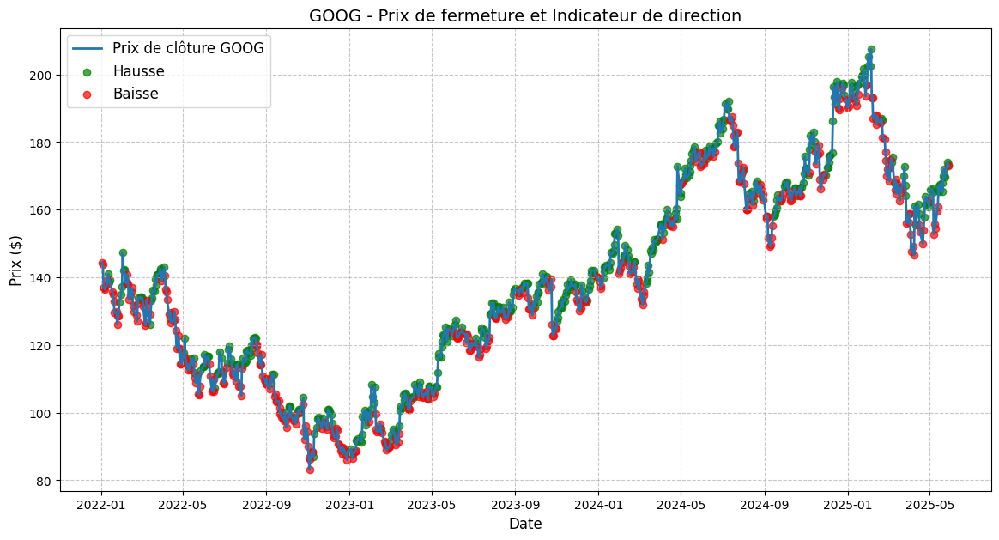

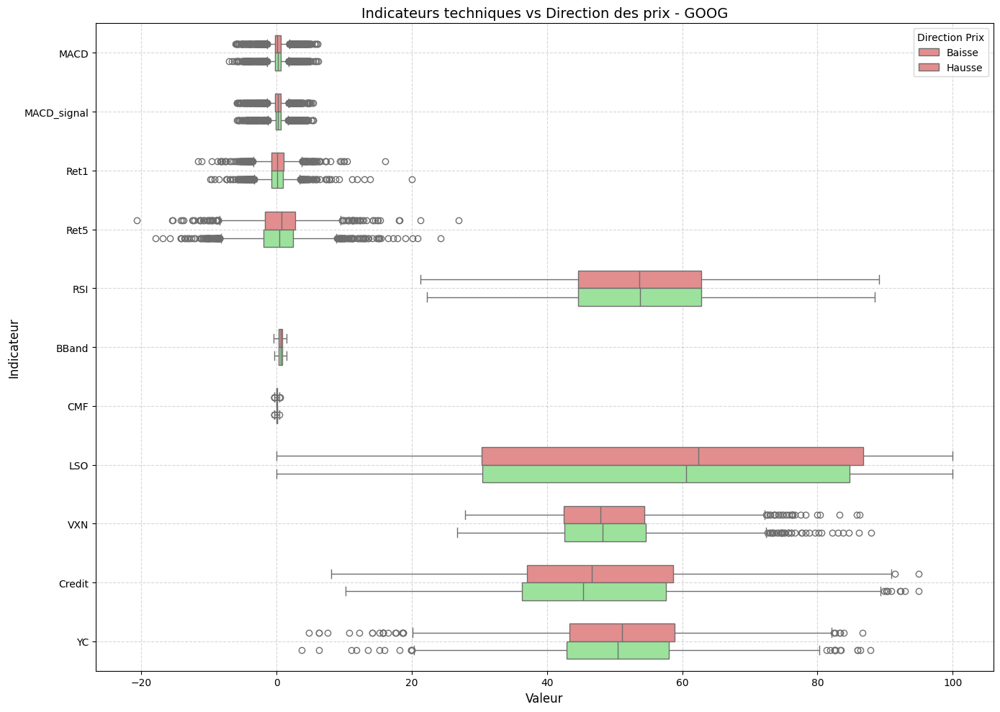


Régression Logistique


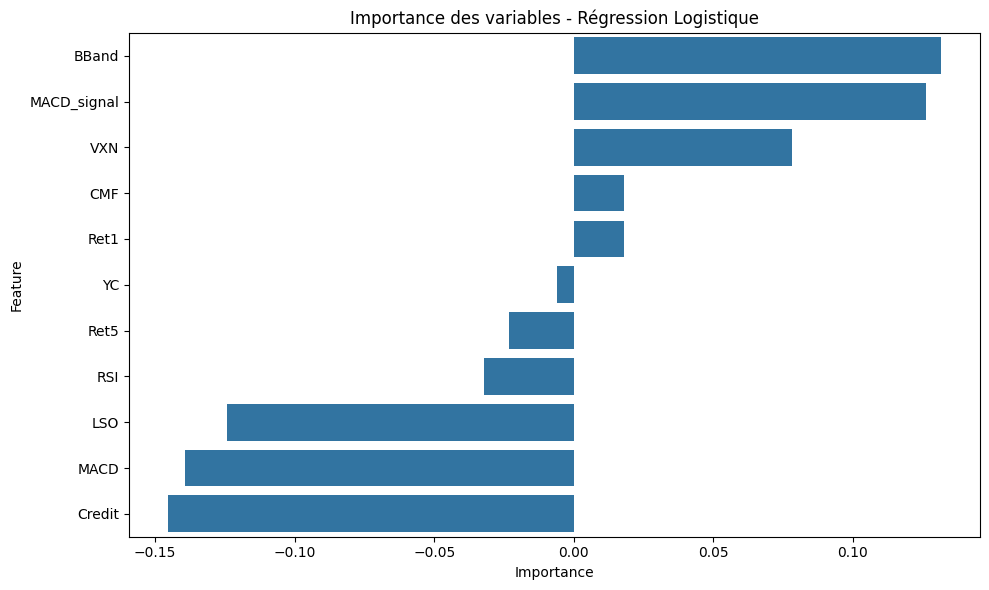

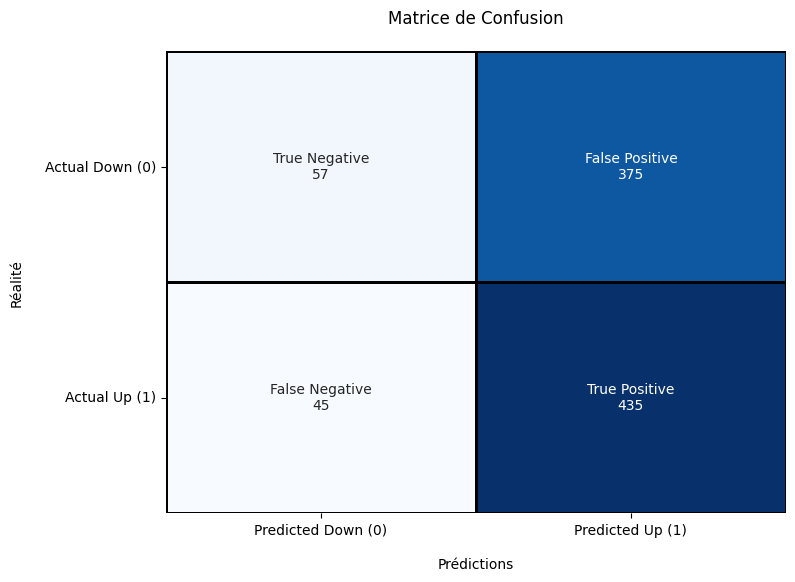


Rapport de classification - Régression Logistique:

              precision    recall  f1-score   support

           0       0.56      0.13      0.21       432
           1       0.54      0.91      0.67       480

    accuracy                           0.54       912
   macro avg       0.55      0.52      0.44       912
weighted avg       0.55      0.54      0.46       912



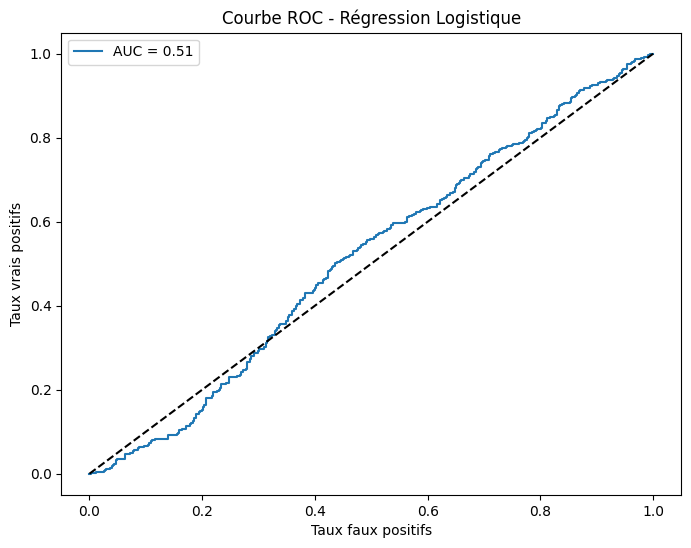


Arbre de Décision


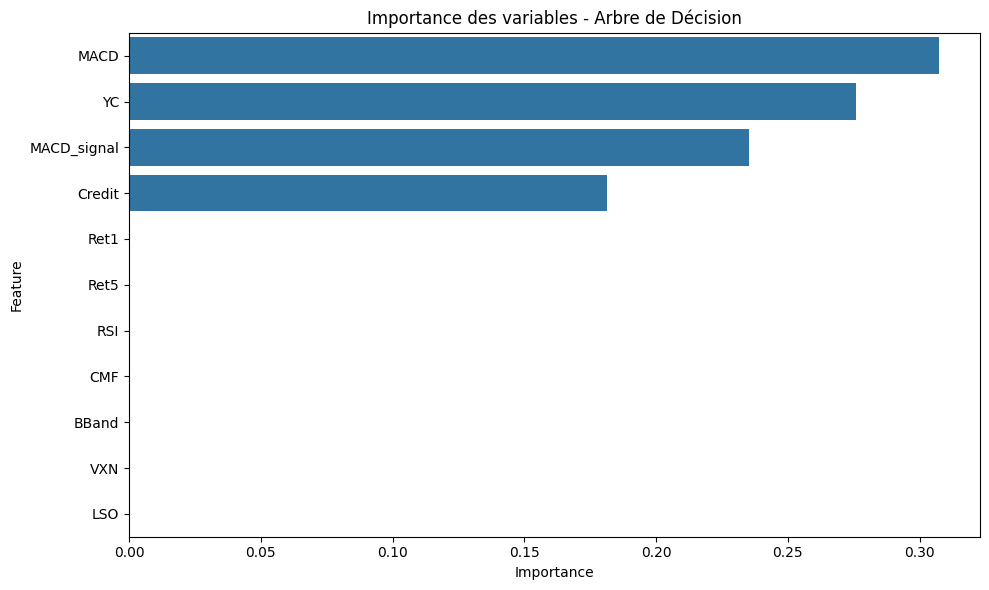

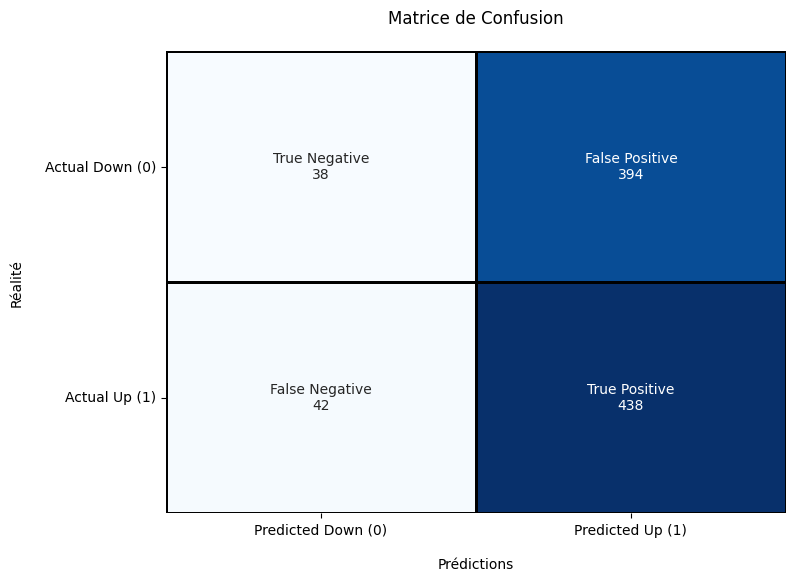


Rapport de classification - Arbre de Décision:

              precision    recall  f1-score   support

           0       0.47      0.09      0.15       432
           1       0.53      0.91      0.67       480

    accuracy                           0.52       912
   macro avg       0.50      0.50      0.41       912
weighted avg       0.50      0.52      0.42       912



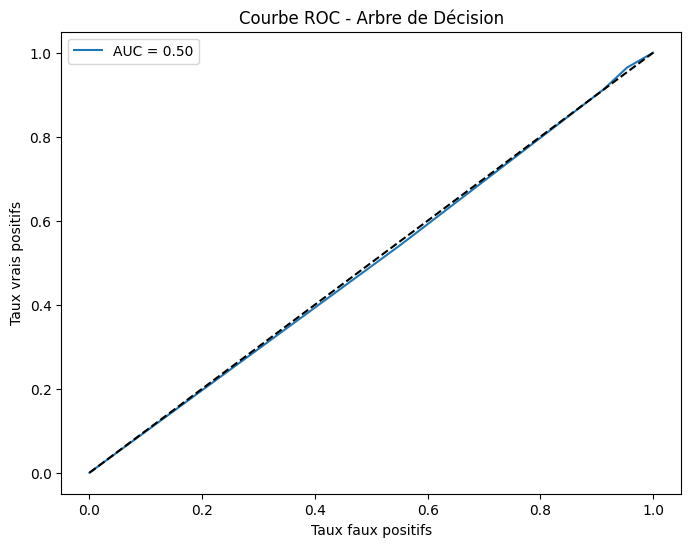

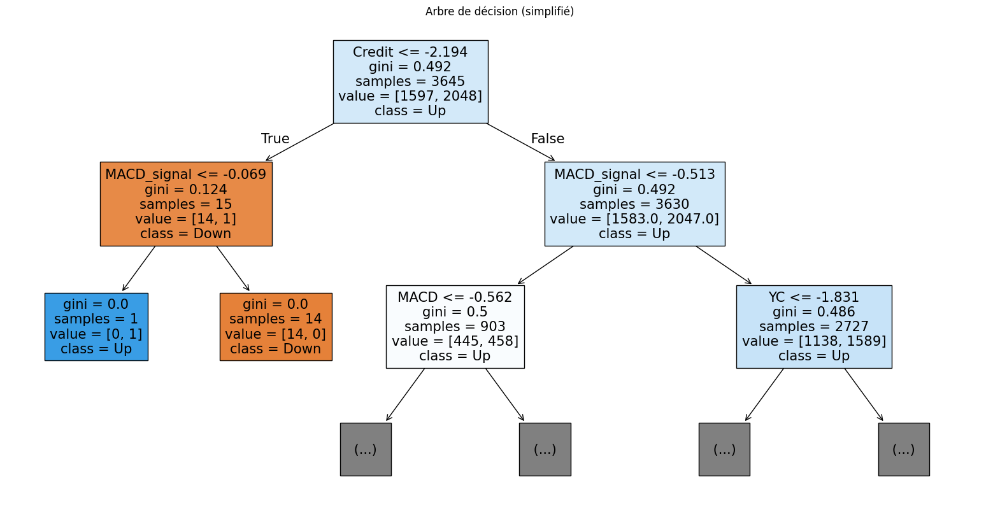


Random Forest


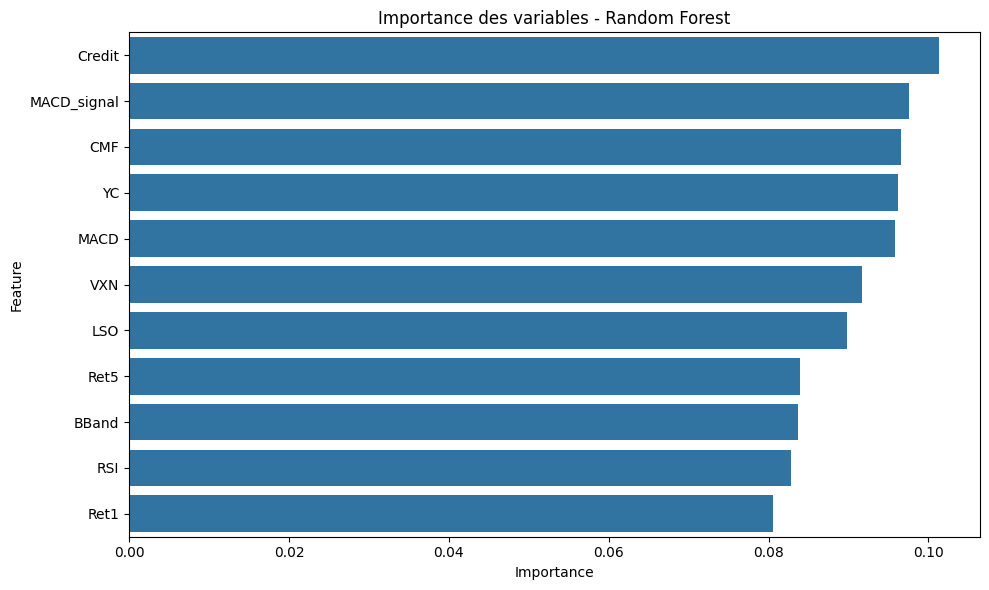

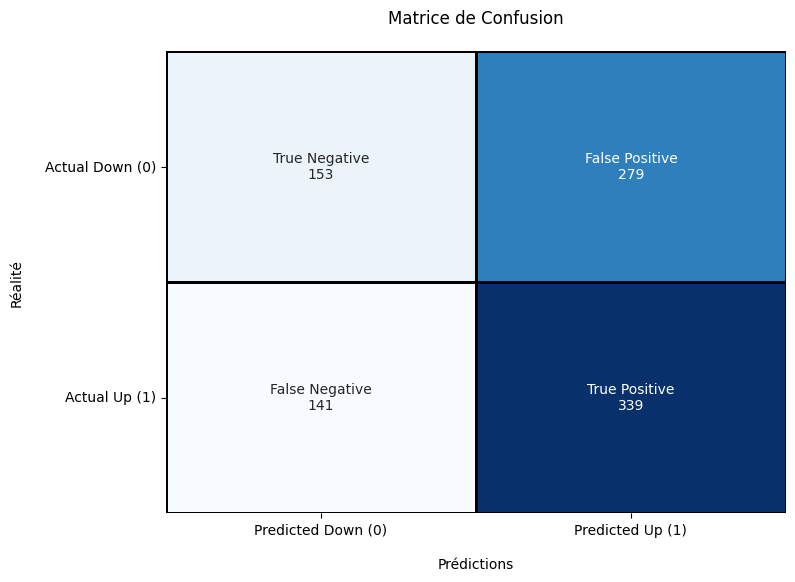


Rapport de classification - Random Forest:

              precision    recall  f1-score   support

           0       0.52      0.35      0.42       432
           1       0.55      0.71      0.62       480

    accuracy                           0.54       912
   macro avg       0.53      0.53      0.52       912
weighted avg       0.54      0.54      0.52       912



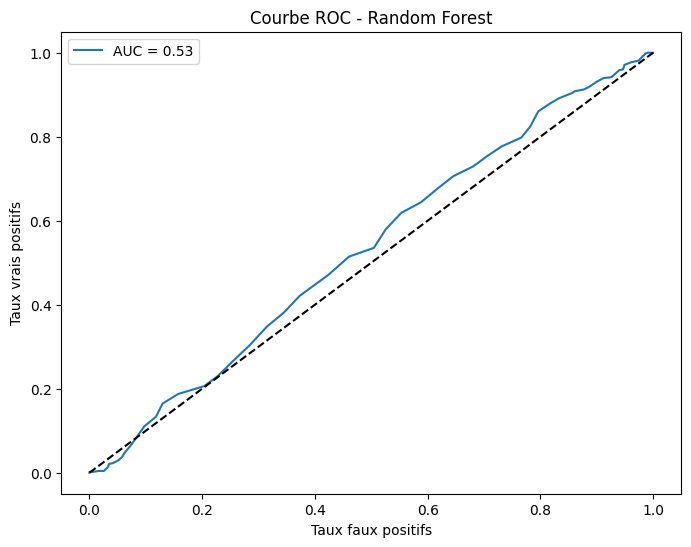


Gradient Boosting
n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 227
max_resources_: 3645
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 16
n_resources: 227
Fitting 3 folds for each of 16 candidates, totalling 48 fits
----------
iter: 1
n_candidates: 8
n_resources: 454
Fitting 3 folds for each of 8 candidates, totalling 24 fits
----------
iter: 2
n_candidates: 4
n_resources: 908
Fitting 3 folds for each of 4 candidates, totalling 12 fits
----------
iter: 3
n_candidates: 2
n_resources: 1816
Fitting 3 folds for each of 2 candidates, totalling 6 fits
----------
iter: 4
n_candidates: 1
n_resources: 3632
Fitting 3 folds for each of 1 candidates, totalling 3 fits

Meilleurs paramètres trouvés:
learning_rate: 0.1
max_depth: 3
min_samples_leaf: 20
n_estimators: 150


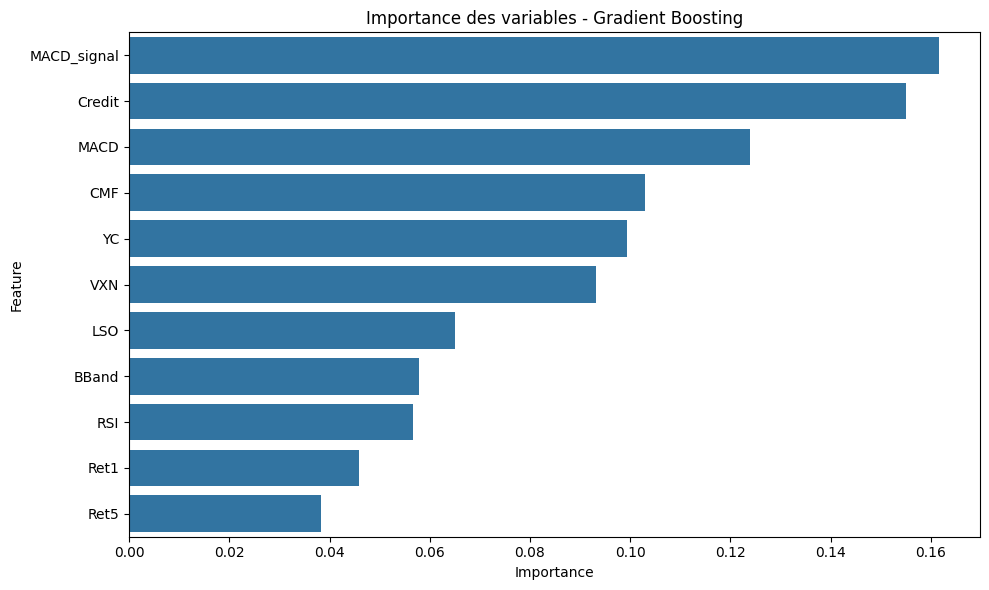

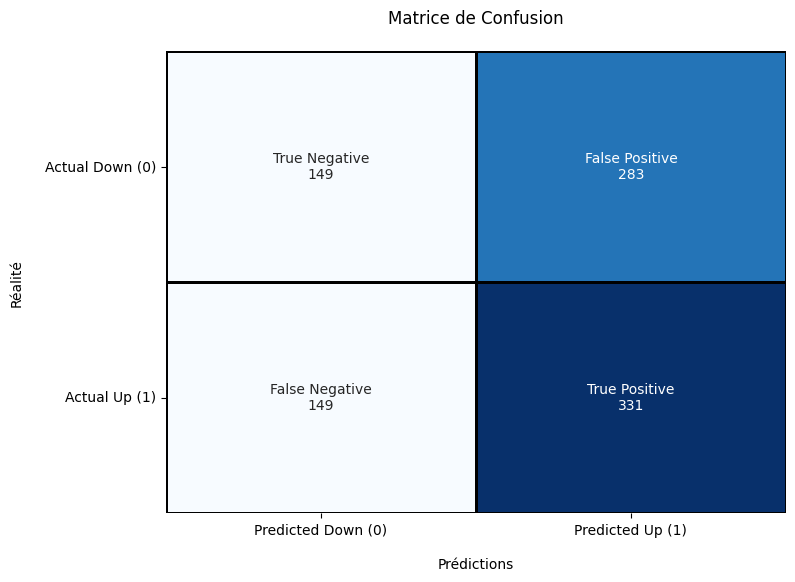


Rapport de classification - Gradient Boosting:

              precision    recall  f1-score   support

           0       0.50      0.34      0.41       432
           1       0.54      0.69      0.61       480

    accuracy                           0.53       912
   macro avg       0.52      0.52      0.51       912
weighted avg       0.52      0.53      0.51       912



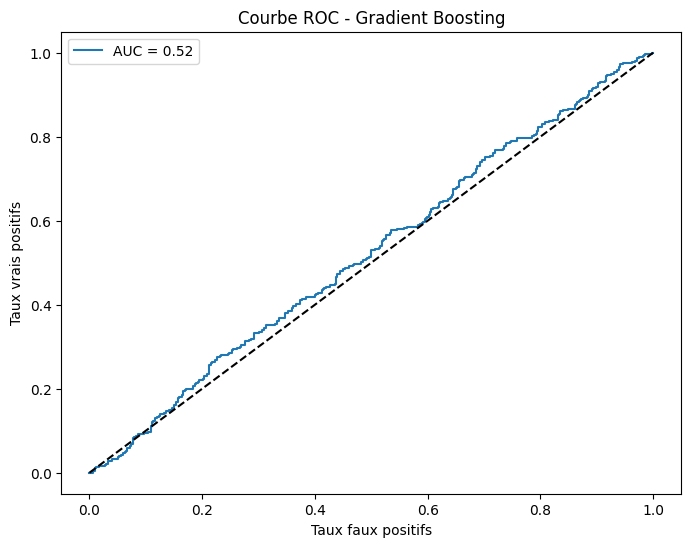

In [18]:
goog_models = learn_from_ticker(data, fred_data, 'GOOG')

### Machine learning sur Tesla

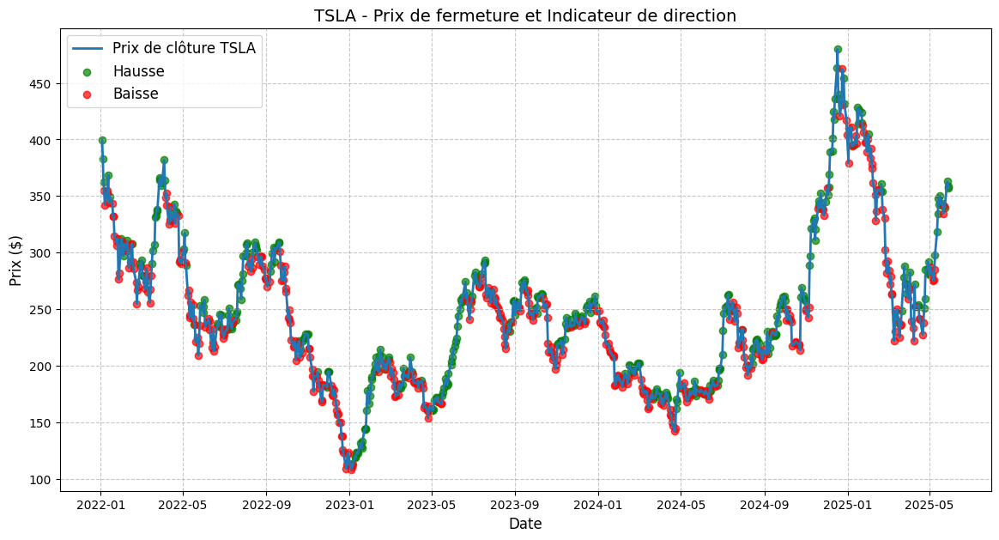

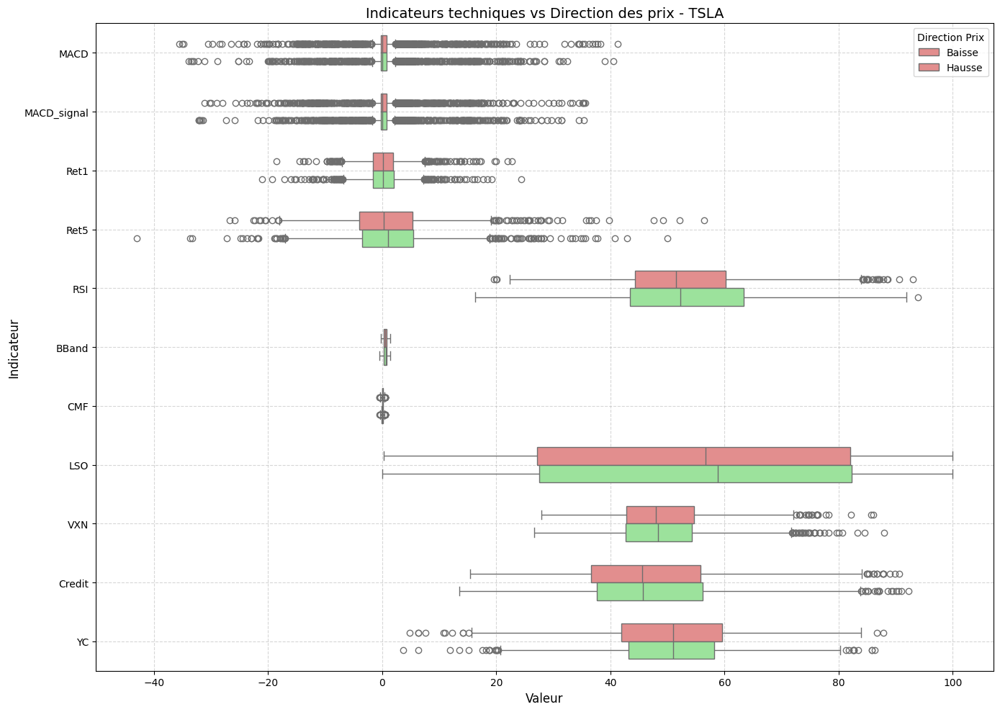


Régression Logistique


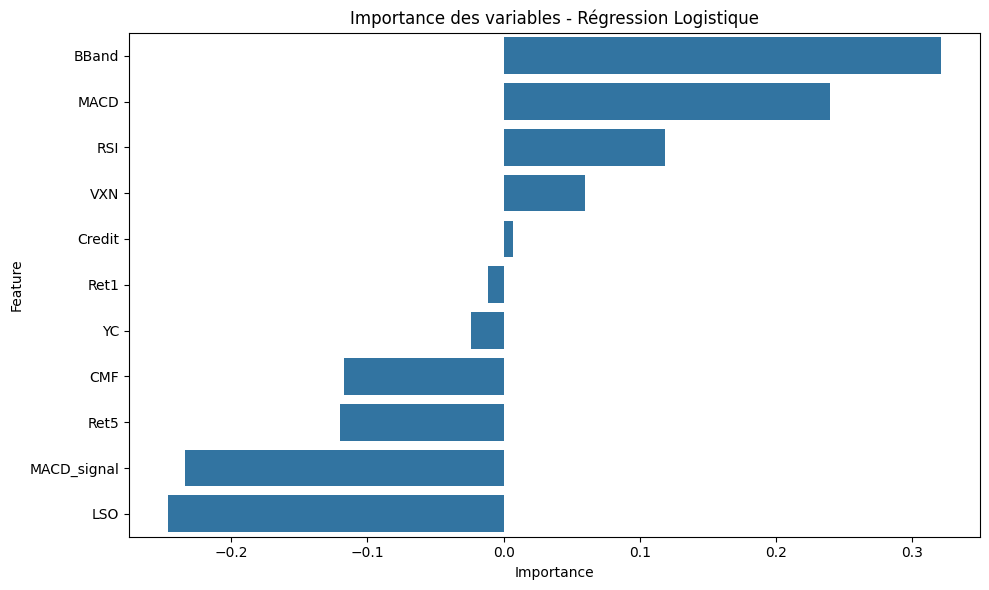

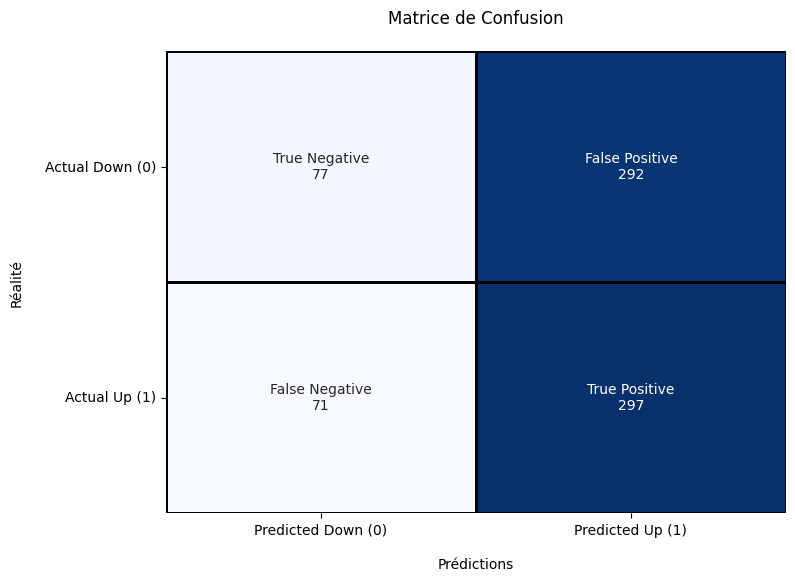


Rapport de classification - Régression Logistique:

              precision    recall  f1-score   support

           0       0.52      0.21      0.30       369
           1       0.50      0.81      0.62       368

    accuracy                           0.51       737
   macro avg       0.51      0.51      0.46       737
weighted avg       0.51      0.51      0.46       737



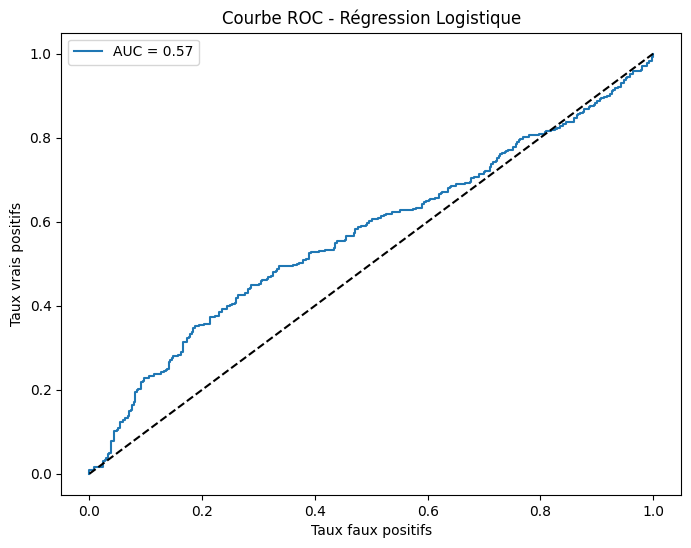


Arbre de Décision


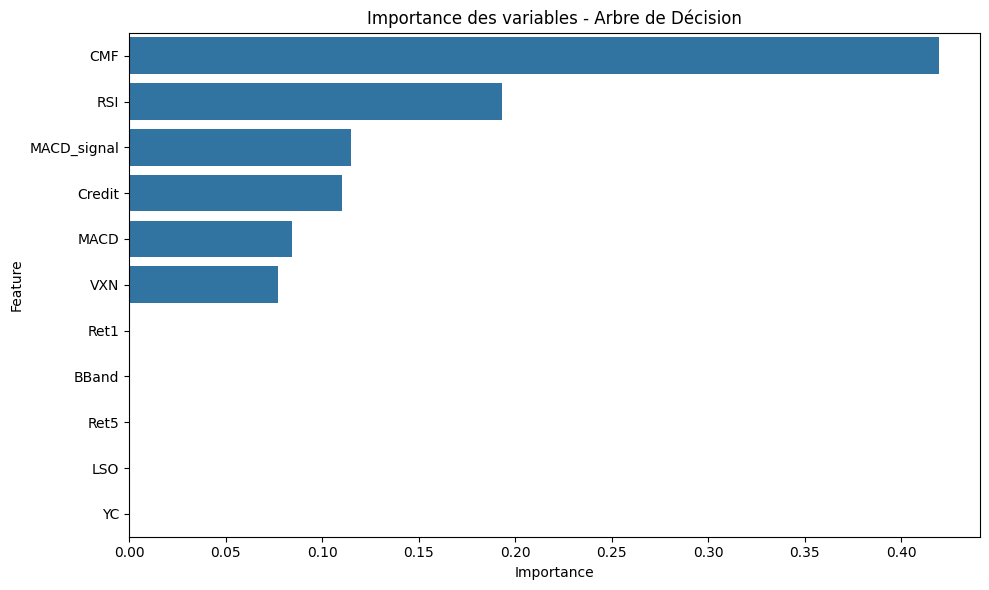

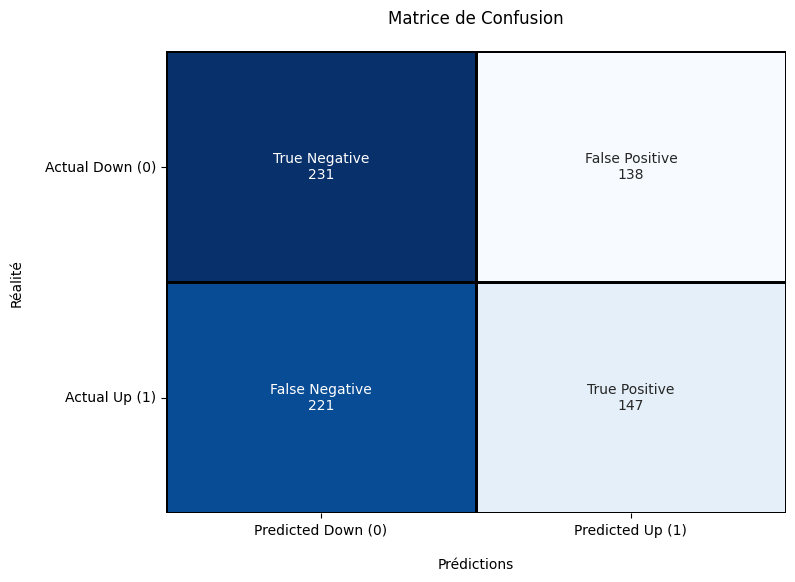


Rapport de classification - Arbre de Décision:

              precision    recall  f1-score   support

           0       0.51      0.63      0.56       369
           1       0.52      0.40      0.45       368

    accuracy                           0.51       737
   macro avg       0.51      0.51      0.51       737
weighted avg       0.51      0.51      0.51       737



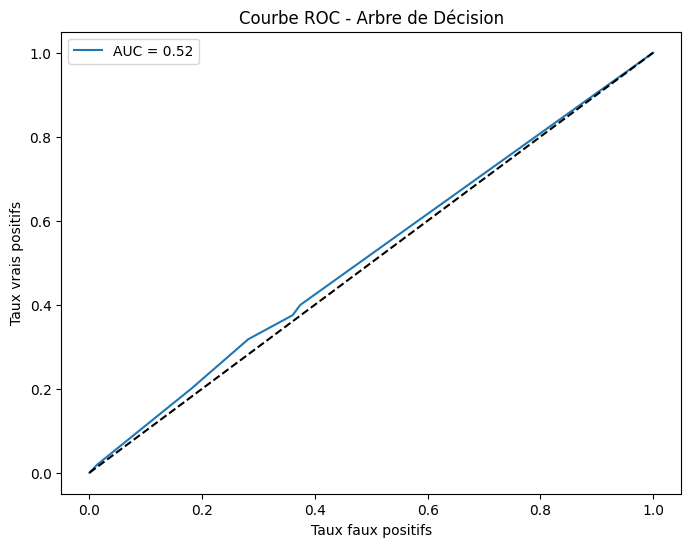

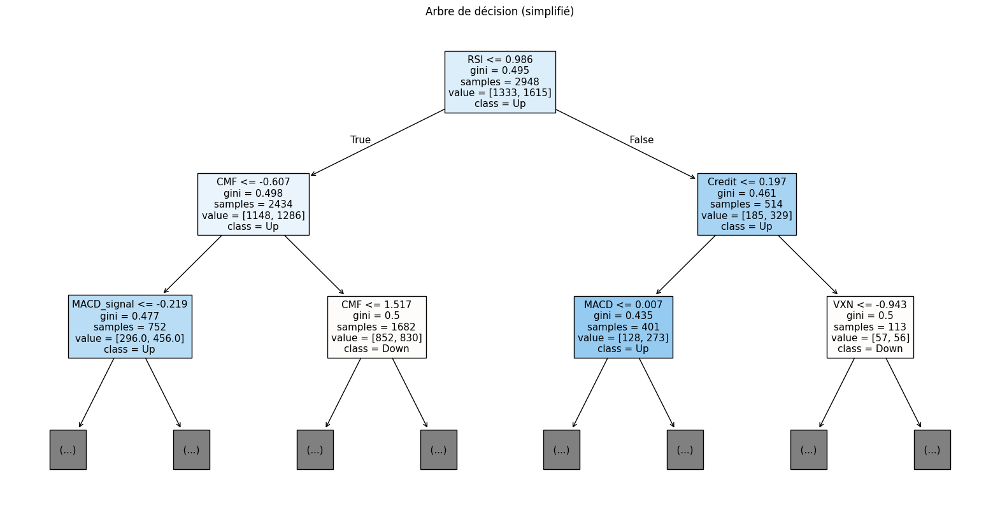


Random Forest


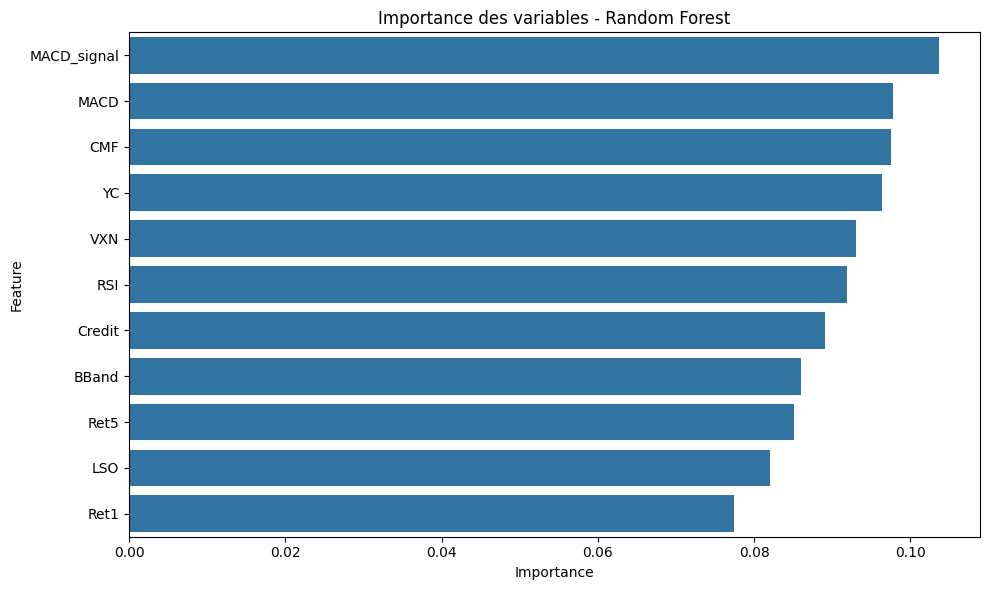

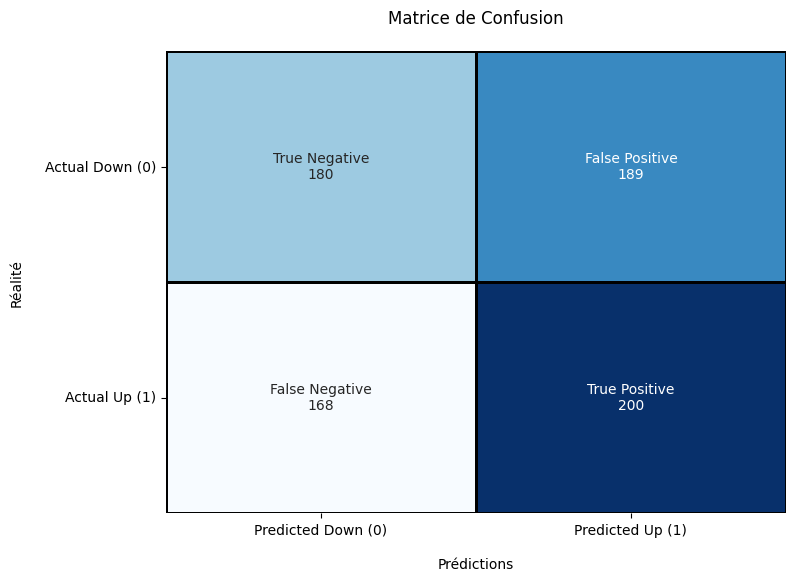


Rapport de classification - Random Forest:

              precision    recall  f1-score   support

           0       0.52      0.49      0.50       369
           1       0.51      0.54      0.53       368

    accuracy                           0.52       737
   macro avg       0.52      0.52      0.52       737
weighted avg       0.52      0.52      0.52       737



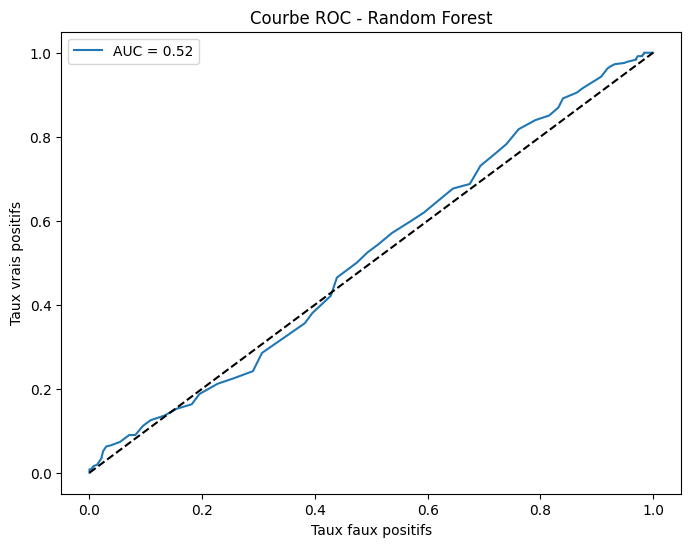


Gradient Boosting
n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 184
max_resources_: 2948
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 16
n_resources: 184
Fitting 3 folds for each of 16 candidates, totalling 48 fits
----------
iter: 1
n_candidates: 8
n_resources: 368
Fitting 3 folds for each of 8 candidates, totalling 24 fits
----------
iter: 2
n_candidates: 4
n_resources: 736
Fitting 3 folds for each of 4 candidates, totalling 12 fits
----------
iter: 3
n_candidates: 2
n_resources: 1472
Fitting 3 folds for each of 2 candidates, totalling 6 fits
----------
iter: 4
n_candidates: 1
n_resources: 2944
Fitting 3 folds for each of 1 candidates, totalling 3 fits

Meilleurs paramètres trouvés:
learning_rate: 0.1
max_depth: 4
min_samples_leaf: 20
n_estimators: 100


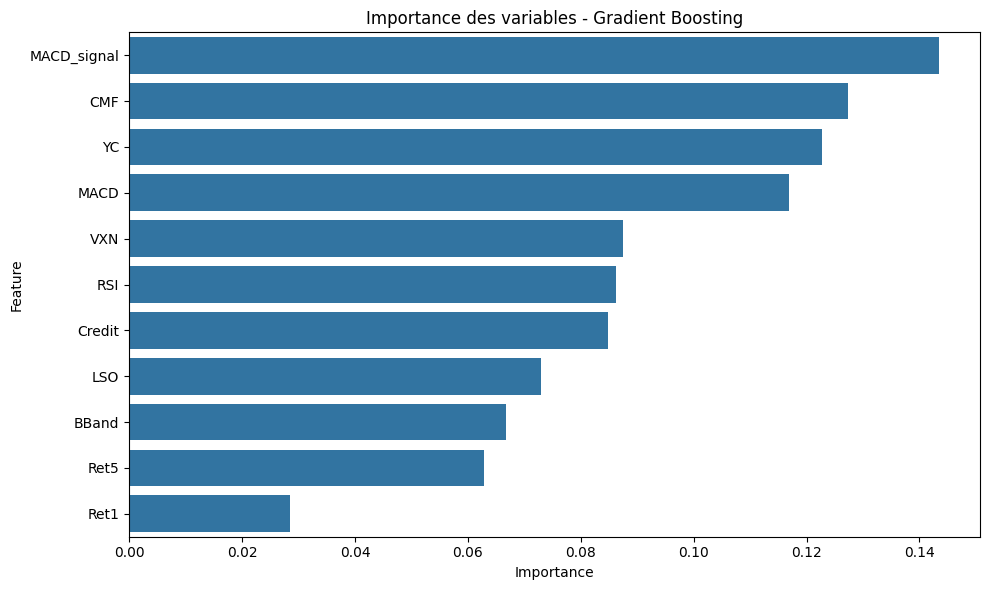

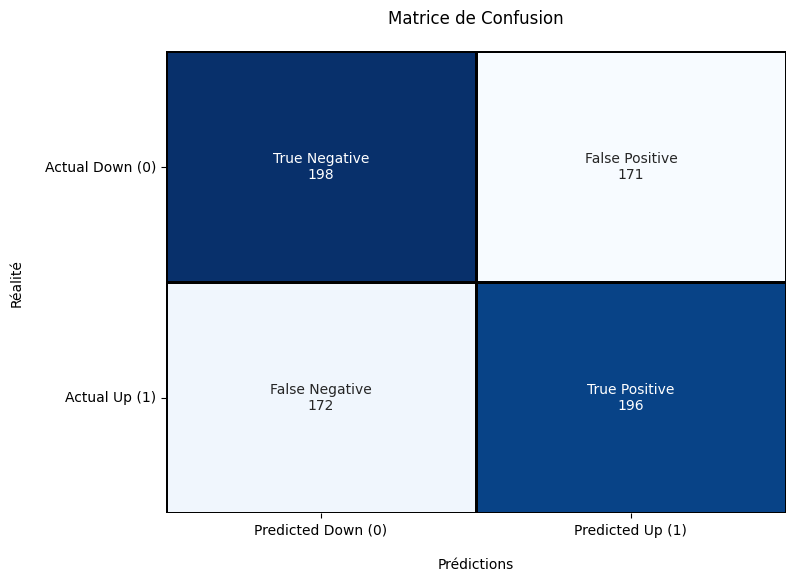


Rapport de classification - Gradient Boosting:

              precision    recall  f1-score   support

           0       0.54      0.54      0.54       369
           1       0.53      0.53      0.53       368

    accuracy                           0.53       737
   macro avg       0.53      0.53      0.53       737
weighted avg       0.53      0.53      0.53       737



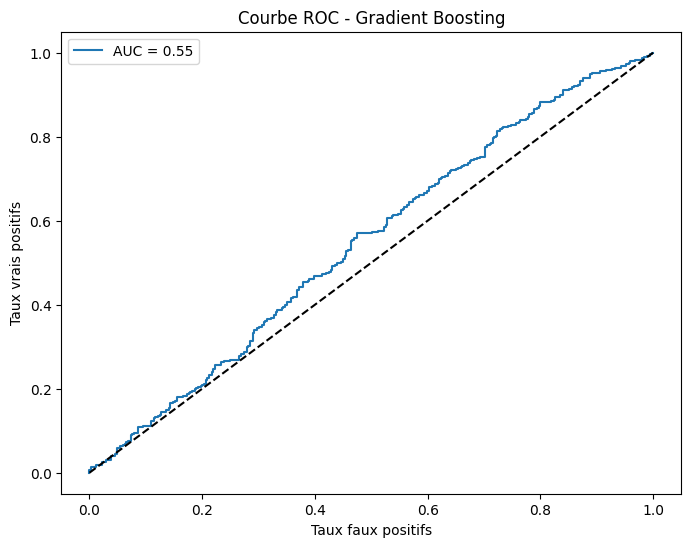

In [19]:
tsla_models = learn_from_ticker(data, fred_data, 'TSLA')

## Question 5

### Constats sur les modèles

Tous les modèles semblent prédire plus souvent que le prix du titre va monter plutôt qu'il va diminuer, à part pour l'arbre de décision pour Tesla.

Les modèles d'apprentissage ne semblent pas mieux prédire que le hasard, (AUC est toujours très proche de 0.5).

La différence est mineur, mais on constate que la régression logistique prédit généralement mieux que les autres modèles.

## Question 6

### Fonctions de trading à partir des modèles de ML entraînés

In [20]:
def backtest_model(model, X_test, y_test, test_data, initial_capital=10000):
    """
    Backtest un modèle de machine learning sur les données de test

    Args:
        model: Modèle entraîné
        X_test: Features de test
        y_test: Labels de test
        test_data: DataFrame complet avec prix et dates
        initial_capital: Capital initial

    Returns:
        DataFrame avec les résultats du backtest
    """
    # Prédictions
    preds = model.predict(X_test)
    probas = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    # Création du DataFrame de résultats
    results = test_data.copy()
    results['Prediction'] = preds
    if probas is not None:
        results['Probability'] = probas
    results['Actual'] = y_test.values

    # Calcul des signaux (1 = achat, 0 = vente/neutre)
    results['Signal'] = results['Prediction']

    # Calcul des rendements stratégie
    results['Strategy_Return'] = results['Return'] * results['Signal'].shift(1)

    # Calcul des rendements cumulés
    results['Buy_Hold'] = (1 + results['Return']).cumprod()
    results['Strategy'] = (1 + results['Strategy_Return']).cumprod()

    # Calcul du equity curve
    results['Equity'] = initial_capital * results['Strategy']

    return results

def analyze_performance(backtest_results, ticker, model_name):
    """
    Analyse et visualise la performance du backtest

    Args:
        backtest_results: DataFrame de résultats du backtest
        ticker: Nom du ticker
        model_name: Nom du modèle
    """
    # Calcul des métriques
    bh_return = backtest_results['Buy_Hold'].iloc[-1] - 1
    strat_return = backtest_results['Strategy'].iloc[-1] - 1
    accuracy = accuracy_score(backtest_results['Actual'], backtest_results['Prediction'])

    # Sharpe Ratio (annualisé)
    sharpe = np.sqrt(252) * backtest_results['Strategy_Return'].mean() / backtest_results['Strategy_Return'].std()

    # Max Drawdown
    cum_returns = backtest_results['Strategy']
    peak = cum_returns.cummax()
    drawdown = (cum_returns - peak) / peak
    max_drawdown = drawdown.min()

    # Affichage des métriques
    print(f"\nPerformance du modèle {model_name} sur {ticker}:")
    print(f"Accuracy: {accuracy:.2%}")
    print(f"Rendement Buy & Hold: {bh_return:.2%}")
    print(f"Rendement Stratégie: {strat_return:.2%}")
    print(f"Sharpe Ratio: {sharpe:.2f}")
    print(f"Max Drawdown: {max_drawdown:.2%}")

    # Graphique de performance
    plt.figure(figsize=(14, 7))
    plt.plot(backtest_results.index, backtest_results['Buy_Hold'], label='Buy & Hold', linestyle='--')
    plt.plot(backtest_results.index, backtest_results['Strategy'], label='Stratégie ML')
    plt.title(f'Performance de {model_name} sur {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Rendement cumulé')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Graphique des signaux
    if 'Probability' in backtest_results.columns:
        plt.figure(figsize=(14, 7))
        plt.scatter(backtest_results.index,
                    backtest_results['Probability'],
                    c=backtest_results['Prediction'],
                    cmap='coolwarm', alpha=0.6)
        plt.title(f'Signaux de trading - {model_name} sur {ticker}')
        plt.xlabel('Date')
        plt.ylabel('Probabilité prédite')
        plt.colorbar(label='Signal (1=Hausse, 0=Baisse)')
        plt.grid(True)
        plt.show()

def test_model_on_ticker(model, ml_data, ticker, model_name):
    """
    Teste un modèle sur un ticker spécifique

    Args:
        model: Modèle entraîné
        ml_data: Données préparées (sortie de prepare_ml_data)
        ticker: Nom du ticker
        model_name: Nom du modèle
    """
    # Séparation des données
    X_train, X_test, y_train, y_test, perf_train, perf_test, scaler = split_and_prepare_data(ml_data)

    # Backtest
    test_data = ml_data.iloc[-len(X_test):].copy()
    test_data['Return'] = test_data['Return']  # Rendements 5 jours

    backtest_results = backtest_model(model, X_test, y_test, test_data)

    # Analyse de performance
    analyze_performance(backtest_results, ticker, model_name)

    return backtest_results

def trade_with_models(data, fred_data, ticker, model, model_name):
    stock_data = prepare_stock_data(data, fred_data, ticker)
    ml_data = prepare_ml_data(stock_data, data, fred_data)
    return test_model_on_ticker(model, ml_data, ticker, model_name)

### Trading ML Apple


Performance du modèle Logistic Regression sur AAPL:
Accuracy: 55.59%
Rendement Buy & Hold: 1092.68%
Rendement Stratégie: 2103.67%
Sharpe Ratio: 1.87
Max Drawdown: -60.39%


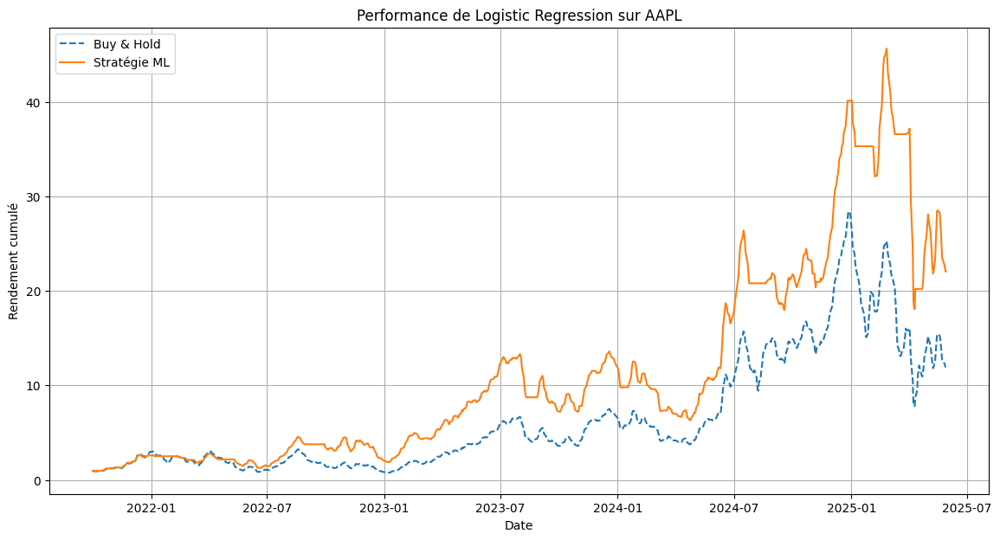

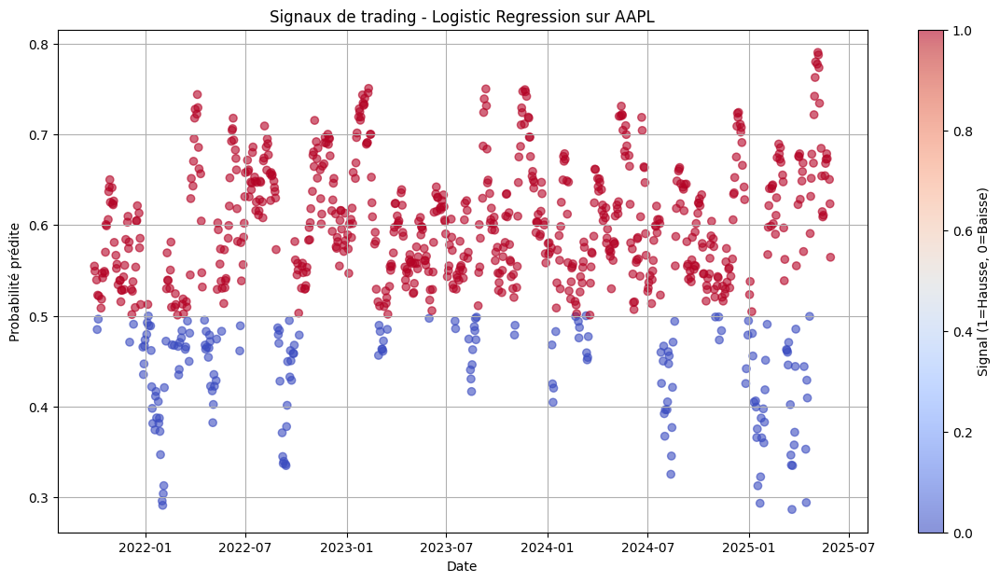


Performance du modèle Decision Tree sur AAPL:
Accuracy: 54.06%
Rendement Buy & Hold: 1092.68%
Rendement Stratégie: 815.79%
Sharpe Ratio: 1.37
Max Drawdown: -72.65%


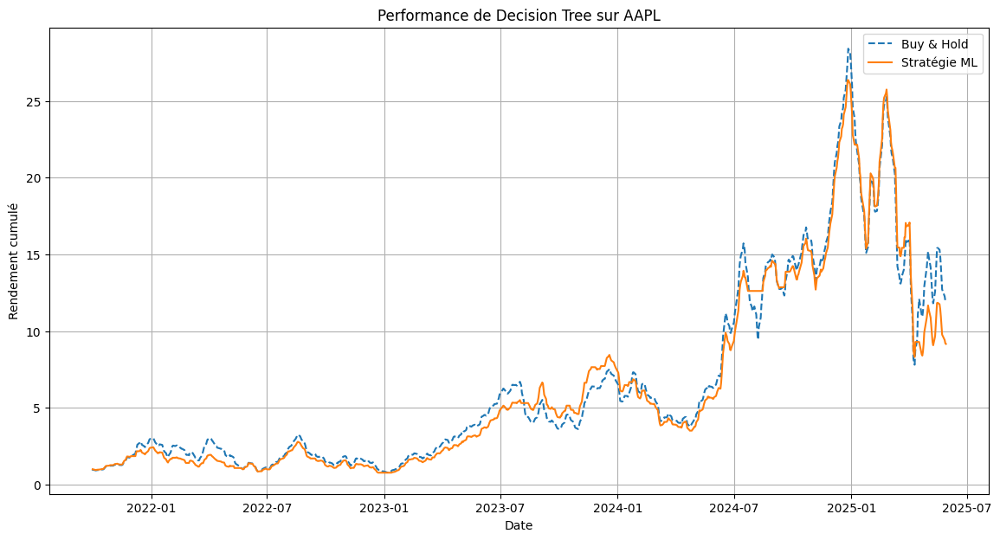

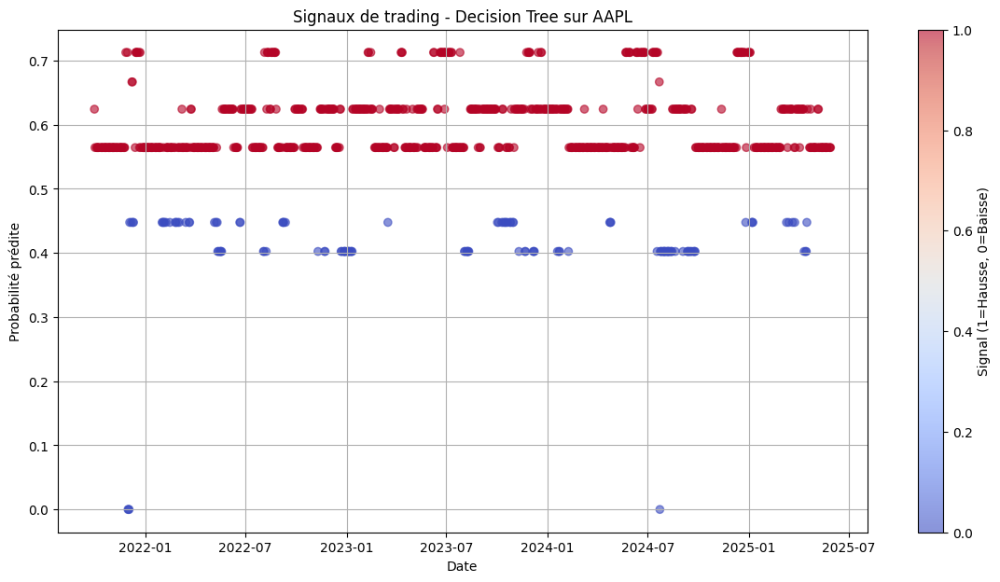


Performance du modèle Random Forest sur AAPL:
Accuracy: 54.93%
Rendement Buy & Hold: 1092.68%
Rendement Stratégie: 1397.62%
Sharpe Ratio: 1.80
Max Drawdown: -66.29%


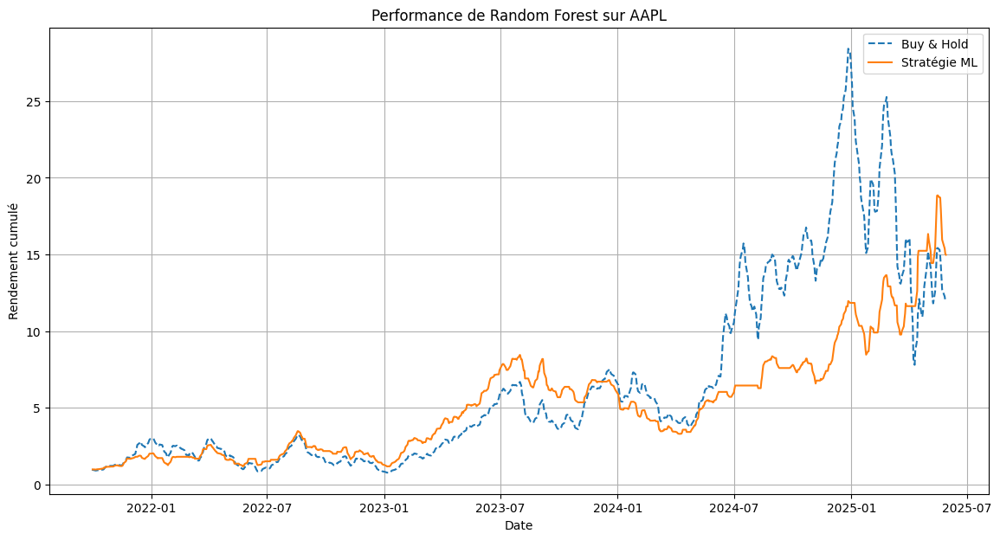

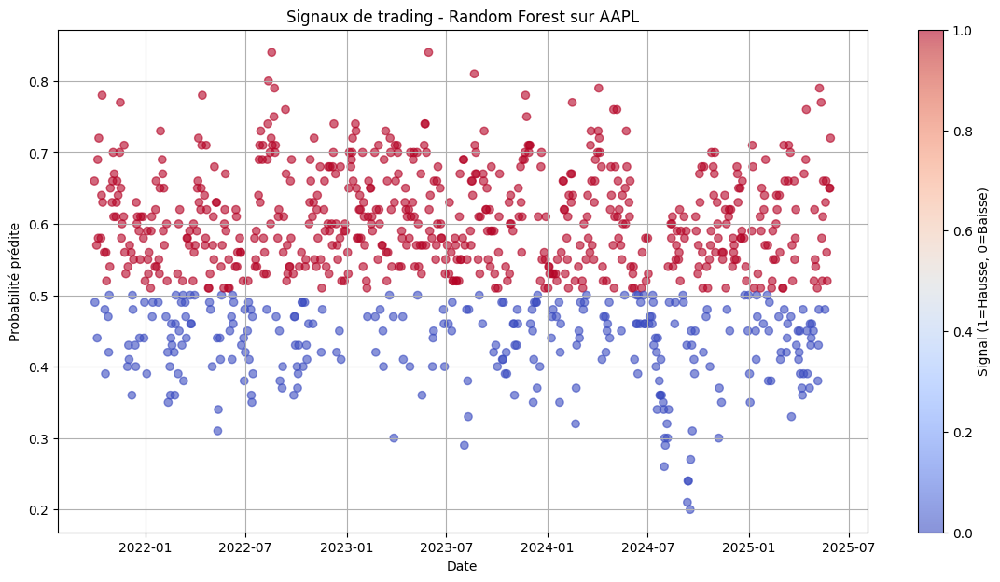


Performance du modèle Gradient Boosting sur AAPL:
Accuracy: 53.73%
Rendement Buy & Hold: 1092.68%
Rendement Stratégie: 1081.94%
Sharpe Ratio: 1.56
Max Drawdown: -72.19%


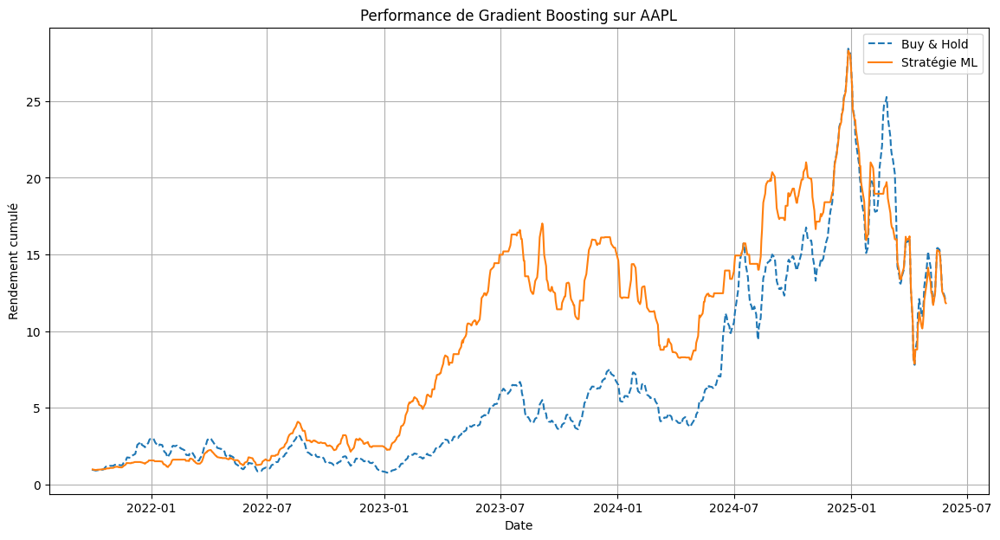

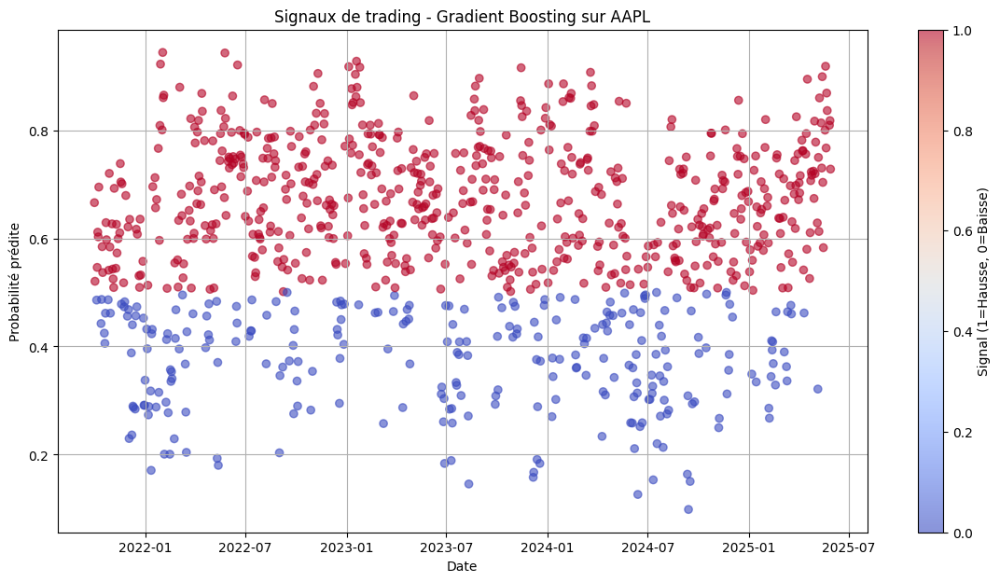

In [21]:
for model_name, model in aapl_models.items():
    trade_with_models(data, fred_data, 'AAPL', model, model_name)

### Trading ML Google


Performance du modèle Logistic Regression sur GOOG:
Accuracy: 53.95%
Rendement Buy & Hold: 268.66%
Rendement Stratégie: 459.35%
Sharpe Ratio: 1.07
Max Drawdown: -85.26%


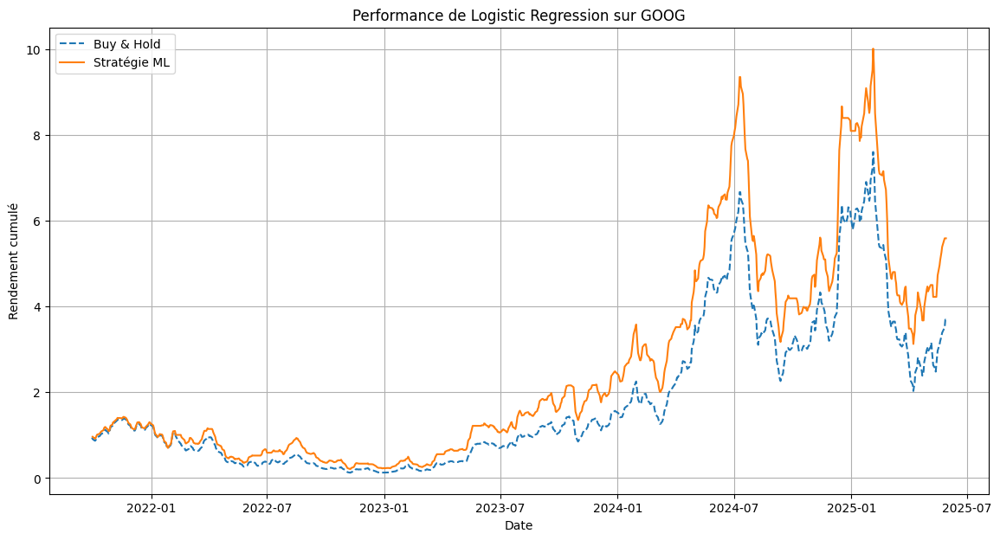

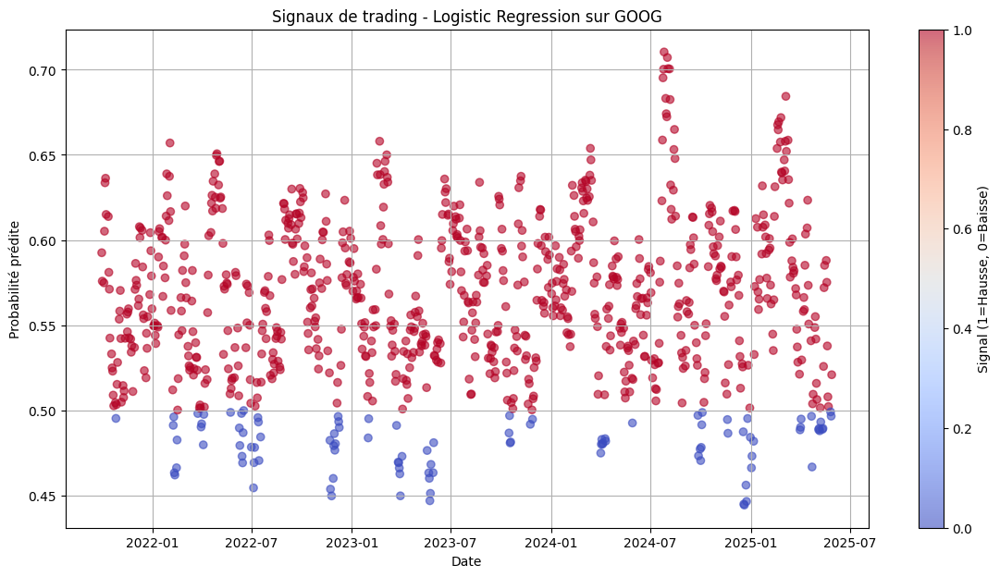


Performance du modèle Decision Tree sur GOOG:
Accuracy: 52.19%
Rendement Buy & Hold: 268.66%
Rendement Stratégie: 381.56%
Sharpe Ratio: 1.00
Max Drawdown: -90.21%


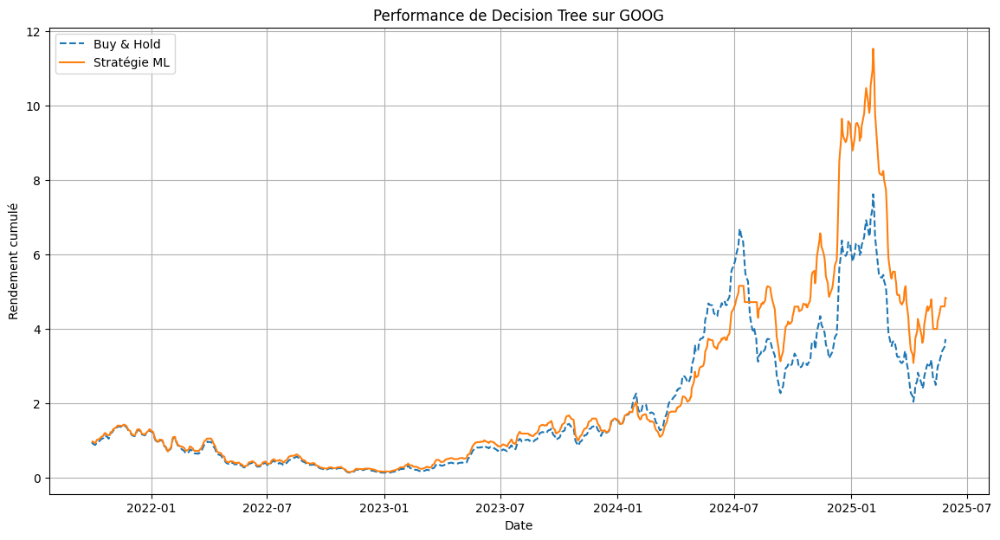

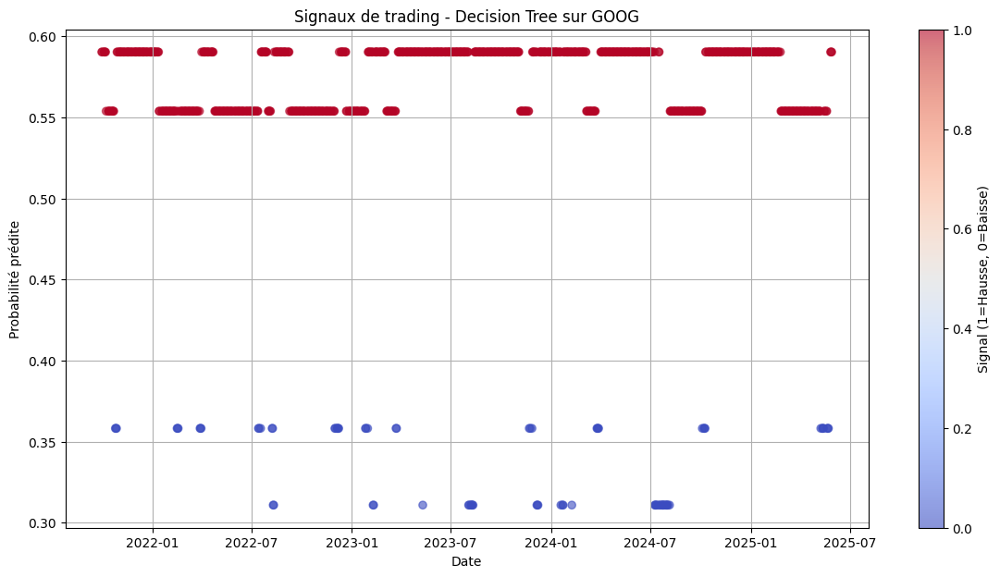


Performance du modèle Random Forest sur GOOG:
Accuracy: 53.95%
Rendement Buy & Hold: 268.66%
Rendement Stratégie: 602.63%
Sharpe Ratio: 1.25
Max Drawdown: -84.94%


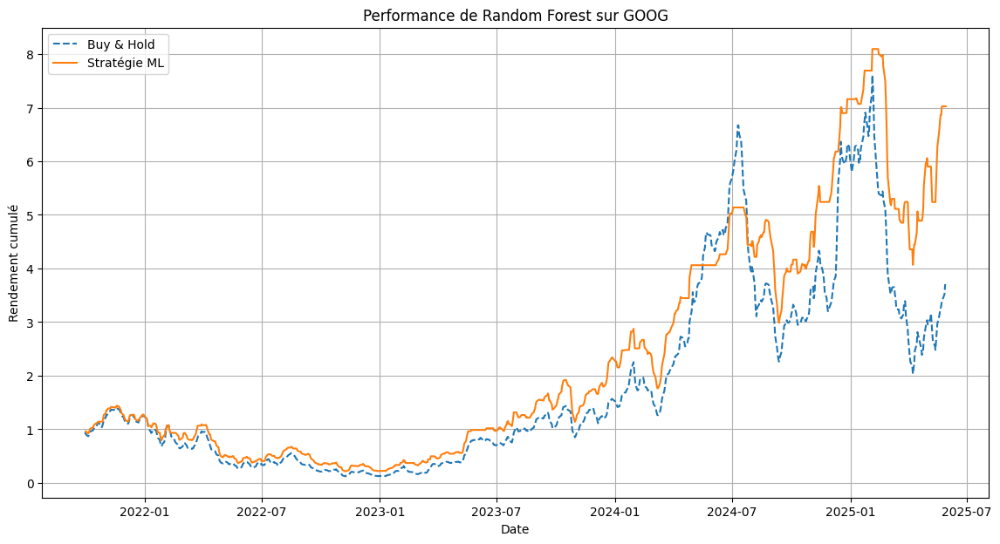

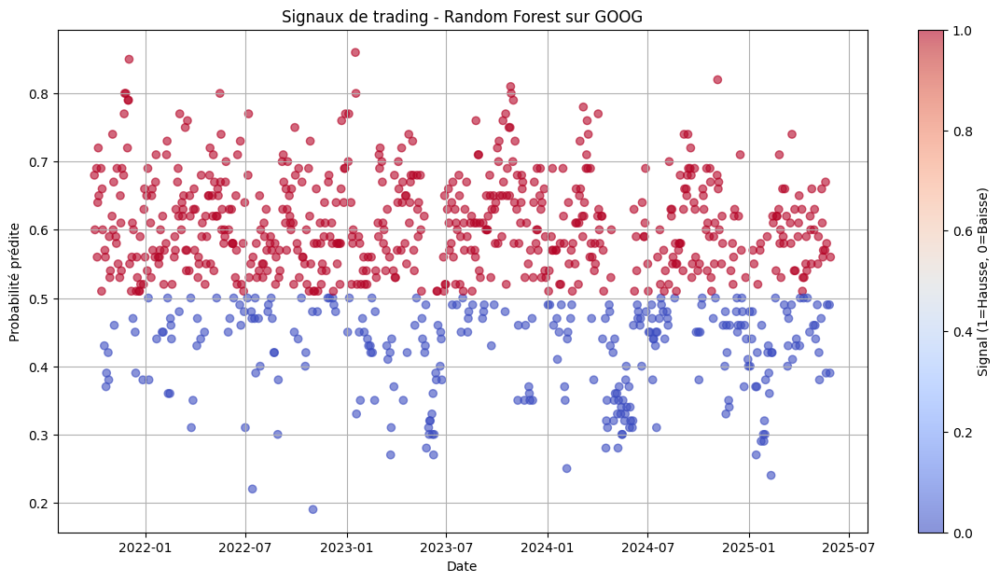


Performance du modèle Gradient Boosting sur GOOG:
Accuracy: 52.63%
Rendement Buy & Hold: 268.66%
Rendement Stratégie: 183.71%
Sharpe Ratio: 0.80
Max Drawdown: -86.72%


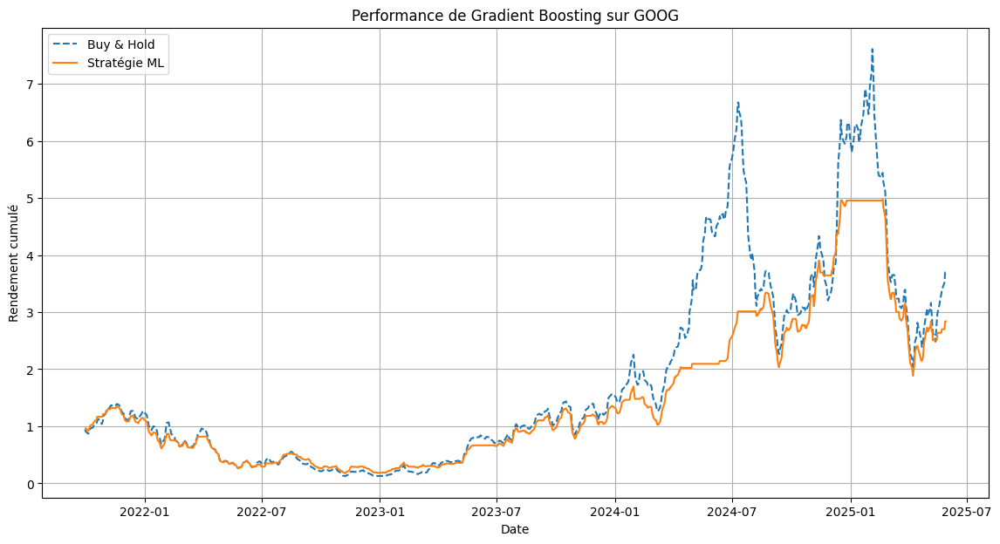

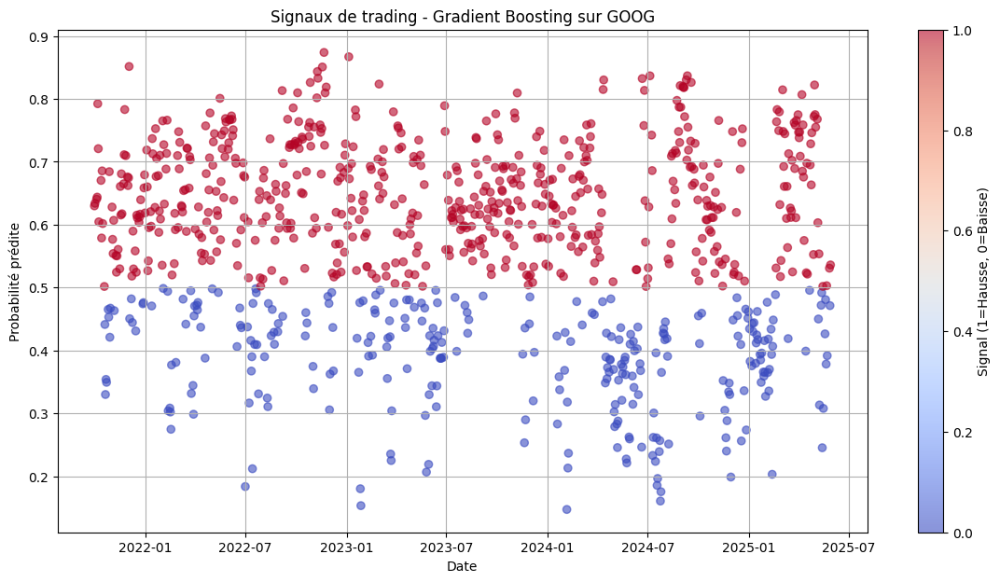

In [22]:
for model_name, model in goog_models.items():
    trade_with_models(data, fred_data, 'GOOG', model, model_name)

### Trading ML Tesla


Performance du modèle Logistic Regression sur TSLA:
Accuracy: 50.75%
Rendement Buy & Hold: 437.73%
Rendement Stratégie: 769.79%
Sharpe Ratio: 1.20
Max Drawdown: -97.64%


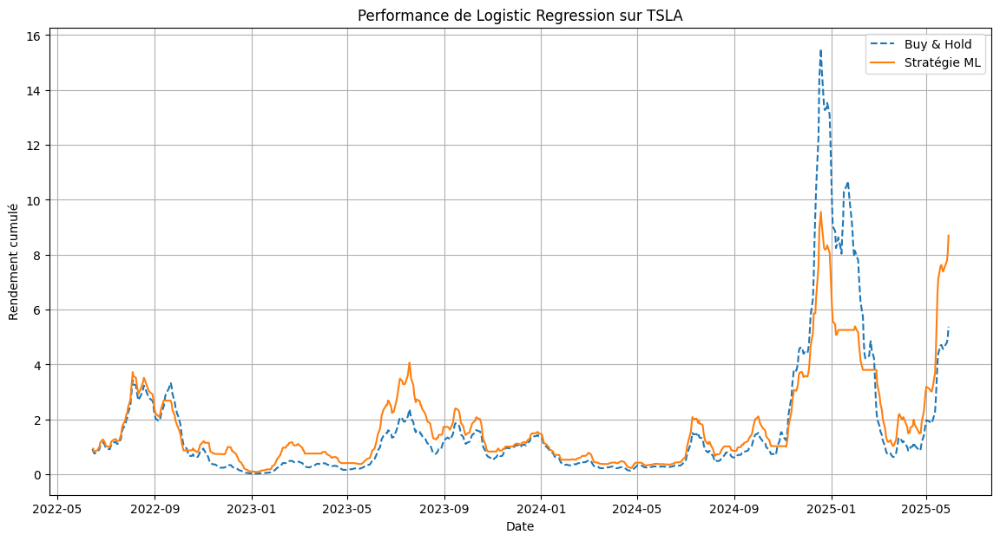

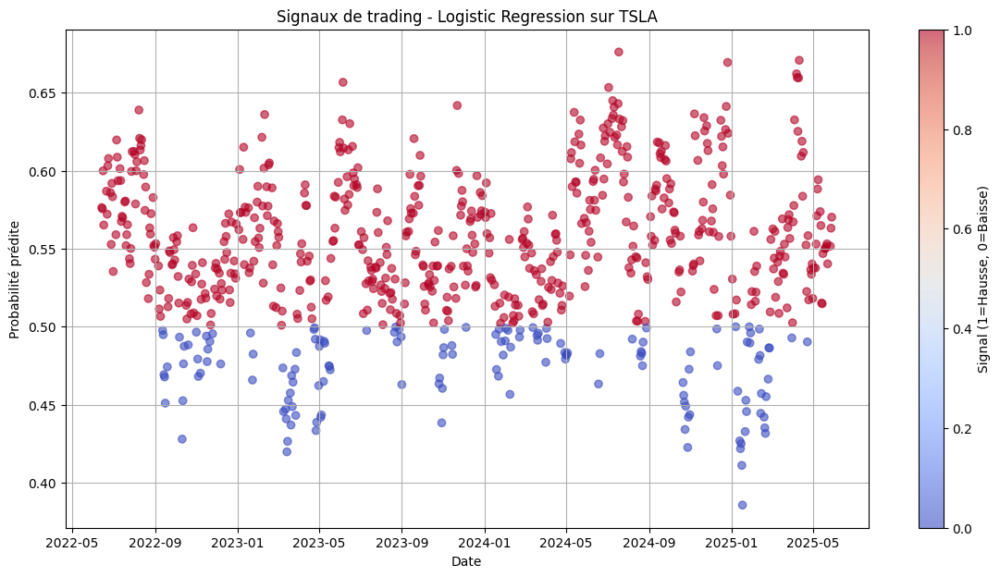


Performance du modèle Decision Tree sur TSLA:
Accuracy: 51.29%
Rendement Buy & Hold: 437.73%
Rendement Stratégie: 168.42%
Sharpe Ratio: 0.82
Max Drawdown: -94.42%


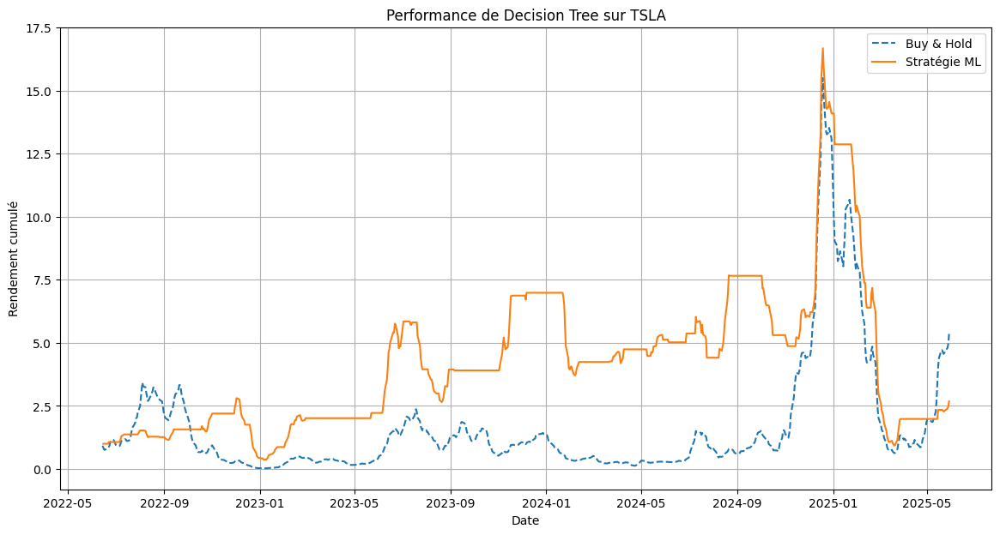

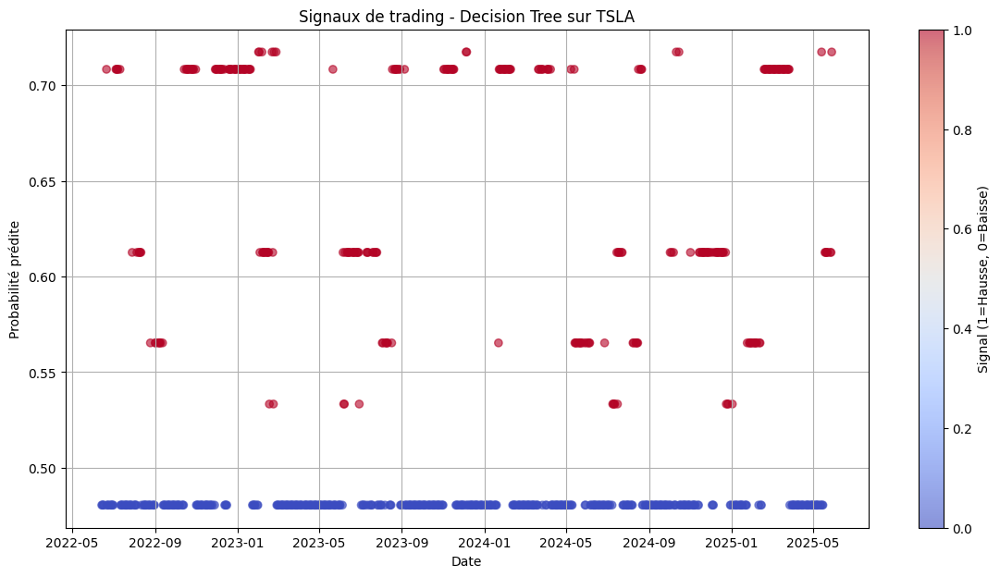


Performance du modèle Random Forest sur TSLA:
Accuracy: 51.56%
Rendement Buy & Hold: 437.73%
Rendement Stratégie: 631.98%
Sharpe Ratio: 1.18
Max Drawdown: -88.32%


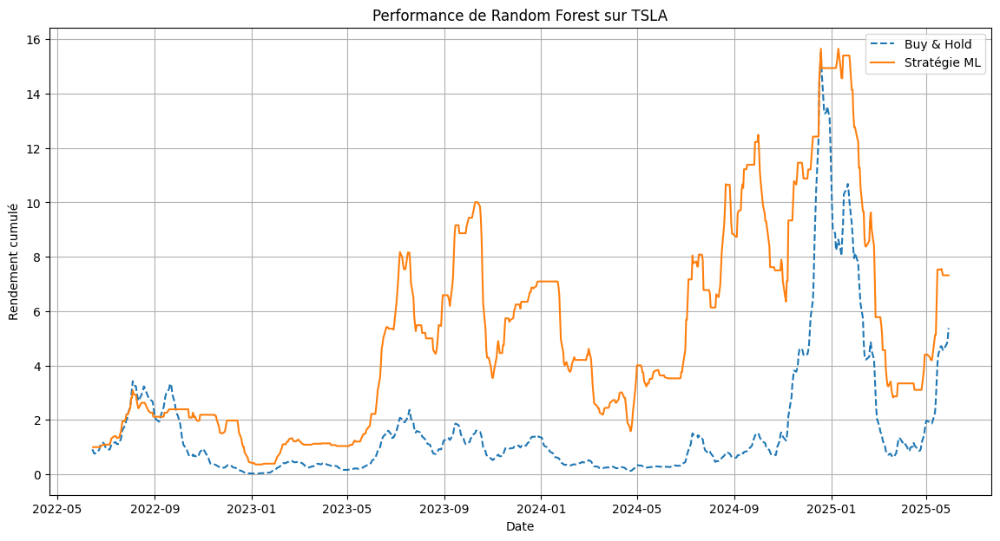

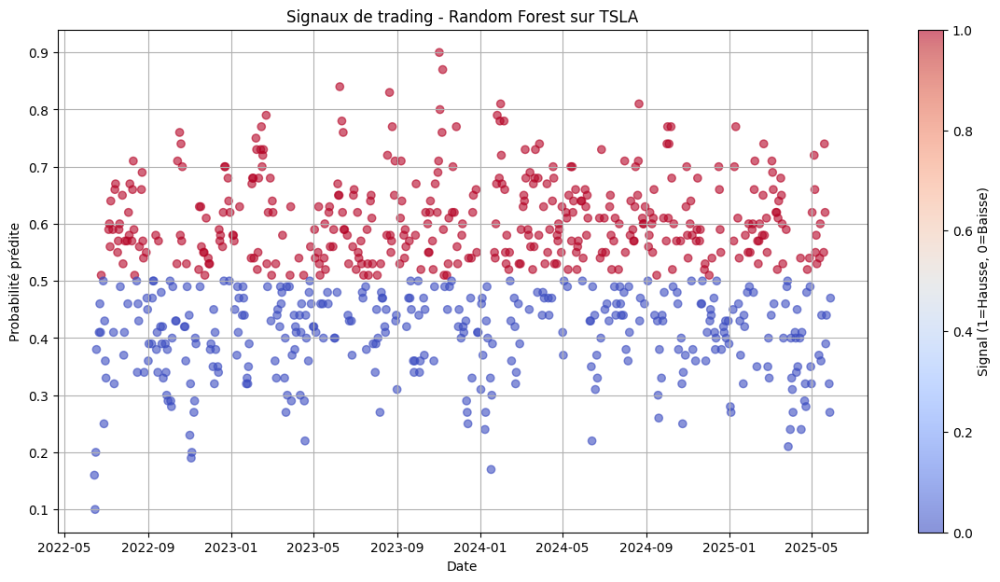


Performance du modèle Gradient Boosting sur TSLA:
Accuracy: 53.46%
Rendement Buy & Hold: 437.73%
Rendement Stratégie: 666.77%
Sharpe Ratio: 1.21
Max Drawdown: -90.73%


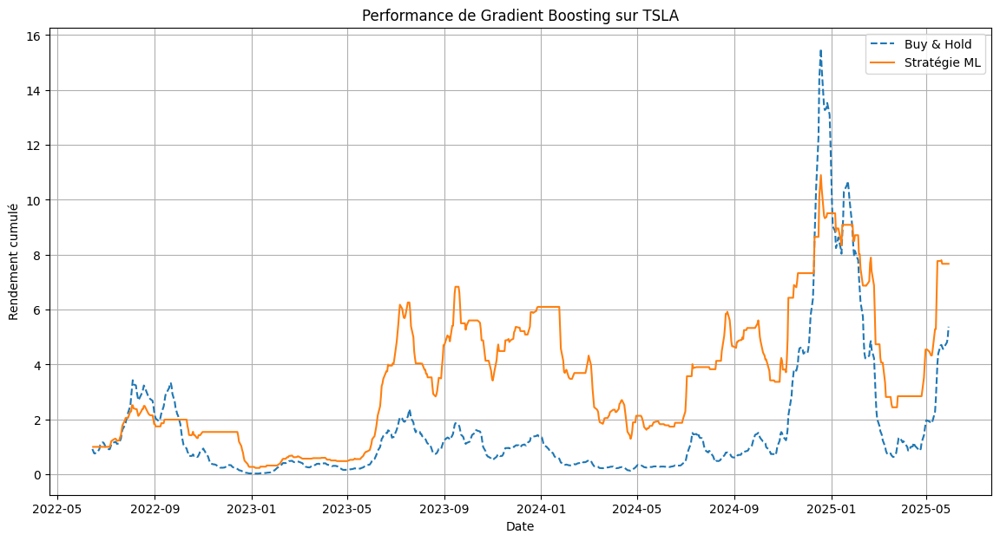

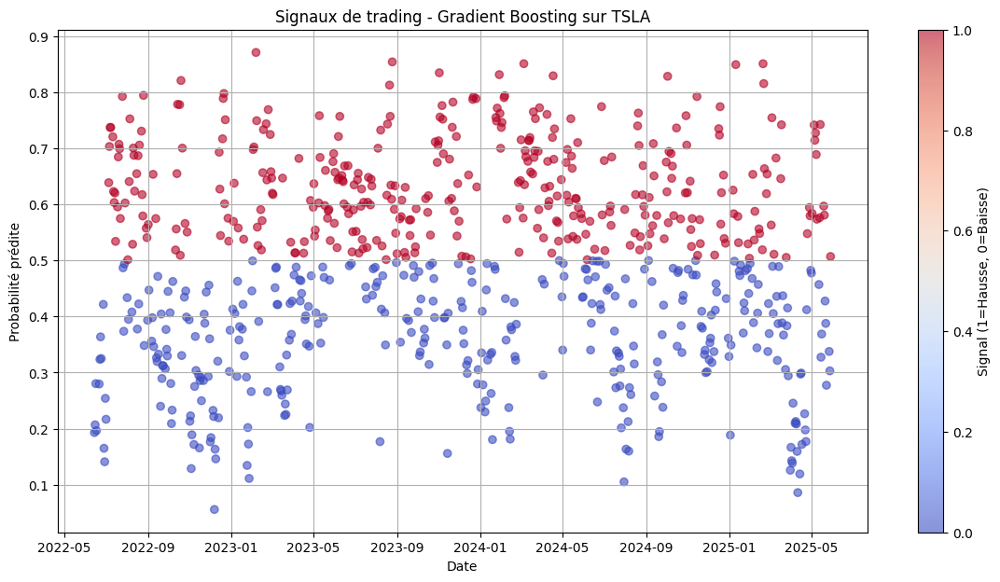

In [23]:
for model_name, model in tsla_models.items():
    trade_with_models(data, fred_data, 'TSLA', model, model_name)

### Pourquoi les résultats diffèrent-ils entre les règles de trading et les modèles estimés?

L'utilisation des modèles estimés pour le trading semble en général battre la simple utilisation des indicateurs pour effectuer le trading. Ce résultat est loin d'être étonnant.

En effet, les indicateurs se basent uniquement sur les valeurs courantes des indicateurs, tandis que les modèles estimés apprennent avec le temps. Ainsi, un modèle estimé sait davantage quoi faire lorsqu'il repère un RSI de 50 par exemple que la simple utilisation d'un threshold de 40 et d'une fenêtre pour déterminer quand acheter et quand vendre.

D'ailleurs, les modèles estimés prennent en compte plusieurs indicateurs à la fois, ce qui signifient qu'ils ont davantage d'informations qui peuvent les aider à prendre une décision d'achat ou de vente. Cette asymétrie d'information peut potentiellement jouer un rôle dans la surperformance des modèles estimés.